## 06 Graph-Based Pseudotime — Combined Experiments 2, 3, 4, 5

**What this notebook does:** Pools niche feature tables from experiments 2–5 (PDAC samples), fits a unified ElPiGraph principal tree across all samples, infers combined pseudotime and branch labels, and visualizes trajectory structure and module scores across samples.

**Data files needed:**
- `data/exp_2/`, `data/exp_3/`, `data/exp_4/`, `data/exp_5/` directories with `*_adata.h5ad`, `*_annotation.csv`, `pixel_features.csv`
- `data/combined_exp_2_3_4_5/` (cache directory, created by per-sample notebooks)

**How to run:** Run notebooks 06_dev_graph_pseudotime_v2_exp_2 through _exp_5 first to generate the per-sample caches, then run this notebook.

In [1]:
# DATA AVAILABILITY CHECK
import os
from pathlib import Path
# Combined analysis requires per-sample cache files
_cache_dir = Path("/Users/shihongwu/SpatioEv") / "data" / "combined_exp_2_3_4_5"
_per_sample_dir = _cache_dir / "per_sample"
_required_files = [
    _cache_dir,
    _per_sample_dir,
]
_missing = [f for f in _required_files if not os.path.exists(f)]
if _missing:
    print(f'Missing required data files: {_missing}')
    print('   This notebook requires real experimental data to run.')
    print('   The code is shown for reference.')
else:
    print('All required data files found. Notebook is ready to run.')


All required data files found. Notebook is ready to run.



# Combined Ductal Pathology Continuum: `exp_2`, `exp_3`, `exp_4`, `exp_5`

This notebook pools the per-sample ductal niche feature tables from:

- `exp_5`: normal pancreas
- `exp_2`, `exp_3`, `exp_4`: PDAC samples

The goal is to test whether these samples occupy a **shared ductal pathology continuum** before we force a single combined ElPiGraph trajectory.

The notebook follows three stages:

1. Rebuild the minimal per-sample surround-context layer needed for module scoring
2. Inspect pooled PCA/UMAP mixing by sample and disease
3. Fit a pooled principal tree only after the pooled embedding looks biologically coherent

Important framing:

- interpret this as a **cross-sample ductal pathology continuum**
- do **not** over-interpret it as literal temporal evolution across patients


In [2]:

%matplotlib inline

import os
os.environ.setdefault("MPLCONFIGDIR", "/private/tmp/matplotlib")
os.environ.setdefault("NUMBA_CACHE_DIR", "/private/tmp/numba")

from pathlib import Path
import gc
import json

import anndata as ad
import elpigraph
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import spatioev as sv
from spatioev.tl.pseudotime import (
    zscore_series as sv_zscore_series,           # NaN-aware z-score (replaces local zscore_numeric_series)
    prepare_pseudotime_feature_matrix,           # feature selection + correlation pruning (replaces local prepare_feature_matrix)
    assign_feature_blocks,                       # block detection for within-block PCA
    sample_center_feature_matrix,                # per-sample Z-centering before PCA
)
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from umap import UMAP

plt.rcParams["figure.dpi"] = 110
plt.rcParams["font.size"] = 9
sns.set_style("white")

ROOT = Path("/Users/shihongwu/SpatioEv")
os.chdir(ROOT)

CACHE_DIR = ROOT / "data" / "combined_exp_2_3_4_5"
PER_SAMPLE_CACHE_DIR = CACHE_DIR / "per_sample"
CACHE_DIR.mkdir(parents=True, exist_ok=True)
PER_SAMPLE_CACHE_DIR.mkdir(parents=True, exist_ok=True)

# ── Key observation column — the mask component ID for ductal niches ────────
NICHE_KEY = "pancreatic ductal epithelium_mask_component"
GRAPH_RADIUS_PX = 30 / 0.325
SURROUND_HOPS = 5

SAMPLE_CONFIGS = [
    {
        "exp_id": "exp_5",
        "sample_id": "40331_1",
        "disease_group": "NormalPancreas",
        "differentiation_label": "NormalPancreas",
        "adata_path": "data/exp_5/40331_1_adata.h5ad",
        "annotation_path": "data/exp_5/40331_1_annotation.csv",
        "pixel_path": "data/exp_5/pixel_features.csv",
        "seg_dir": "data/exp_5/segmentation",
        "niche_table_path": "data/exp_5/niche_feature_table.csv",
        "fov_grid_cols": 3,
    },
    {
        "exp_id": "exp_2",
        "sample_id": "34434_1",
        "disease_group": "PDAC",
        "differentiation_label": "PDAC_exp_2",
        "adata_path": "data/exp_2/34434_1_adata.h5ad",
        "annotation_path": "data/exp_2/34434_1_annotation.csv",
        "pixel_path": "data/exp_2/pixel_features.csv",
        "seg_dir": "data/exp_2/segmentation",
        "niche_table_path": "data/exp_2/niche_feature_table.csv",
        "fov_grid_cols": 2,
    },
    {
        "exp_id": "exp_3",
        "sample_id": "33694_1",
        "disease_group": "PDAC",
        "differentiation_label": "PDAC_exp_3",
        "adata_path": "data/exp_3/33694_1_adata.h5ad",
        "annotation_path": "data/exp_3/33694_1_annotation.csv",
        "pixel_path": "data/exp_3/pixel_features_with_regionprops.csv",
        "seg_dir": "data/exp_3/segmentation",
        "niche_table_path": "data/exp_3/niche_feature_table.csv",
        "fov_grid_cols": 4,
    },
    {
        "exp_id": "exp_4",
        "sample_id": "35559_1",
        "disease_group": "PDAC",
        "differentiation_label": "PDAC_exp_4",
        "adata_path": "data/exp_4/35559_1_adata.h5ad",
        "annotation_path": "data/exp_4/35559_1_annotation.csv",
        "pixel_path": "data/exp_4/pixel_features.csv",
        "seg_dir": "data/exp_4/segmentation",
        "niche_table_path": "data/exp_4/niche_feature_table.csv",
        "fov_grid_cols": 3,
    },
]

MODULE_COLS = [
    "pdac_early_duct_anchor_score",
    "pdac_panin_like_dysplasia_score",
    "pdac_invasive_gland_forming_score",
    "pdac_invasion_desmoplasia_axis",
    "pdac_proliferation_axis",
    "pdac_dedifferentiation_axis",
    "pdac_duct_organization_score",
    "pdac_dysplasia_score",
    "pdac_architectural_complexity_score",
    "pdac_invasion_desmoplasia_score",
    "pdac_proliferation_score",
    "pdac_dedifferentiation_score",
]

SUPPLEMENTAL_COL_CANDIDATES = [
    "geometry__hull_circularity",
    "geometry__mean_nearest_neighbor_distance",
    "graph_boundary__boundary_fraction",
    "graph_boundary__mean_external_degree",
    "graph_surround__cross_edges_per_niche_cell",
    "topology__skeleton_tortuosity",
    "surround_prop__Fibroblasts",
    "surround_prop__Vimentin_only_mesenchyme",
    "surround_prop__Endothelial_cells",
]

GLAND_PROXY_COL_CANDIDATES = [
    "state__solidity__mean",
    "state__solidity__std",
    "state__perimeter__mean",
    "state__perimeter__std",
    "state__convex_hull_resid__mean",
    "state__convex_hull_resid__std",
]

EXTRA_PIXEL_COL_CANDIDATES = [
    "state__nc_ratio__std",
    "state__nc_ratio__iqr",
    "state__polarity_score__std",
    "state__entropy__std",
    "state__inertia__std",
    "state__lacunarity__std",
    "state__haralick_contrast__std",
    "state__haralick_correlation__mean",
    "state__haralick_energy__mean",
    "state__haralick_homogeneity__mean",
    "state__pcc_ck19_nak__mean",
    "state__pcc_ck19_nak__std",
    "state__intensity_ratio__mean",
    "state__intensity_ratio__std",
    "graph_boundary__polarity_score__boundary_minus_core",
    "graph_boundary__entropy__boundary_minus_core",
    "graph_boundary__haralick_contrast__boundary_minus_core",
    "graph_boundary__intensity_ratio__boundary_minus_core",
    "graph_boundary__pcc_ck19_nak__boundary_minus_core",
]

EPITHELIAL_INTRINSIC_MODULE_COLS = [
    "pdac_duct_organization_score",
    "pdac_dysplasia_score",
    "pdac_architectural_complexity_score",
    "pdac_proliferation_score",
    "pdac_dedifferentiation_score",
]

EPITHELIAL_INTRINSIC_FEATURE_CANDIDATES = [
    "geometry__hull_circularity",
    "geometry__mean_nearest_neighbor_distance",
    "geometry__nearest_neighbor_distance_cv",
    "geometry__edge_length_cv",
    "geometry__orientation_entropy",
    "geometry__orientation_coherence",
    "geometry__spatial_entropy",
    "geometry__cell_density_hull",
    "geometry__edge_density_hull",
    "geometry__span_ratio",
    "geometry__node_cloud_elongation",
    "topology__largest_component_fraction",
    "topology__density",
    "topology__degree_var",
    "topology__avg_clustering",
    "topology__bridge_fraction",
    "topology__skeleton_leaf_fraction",
    "topology__skeleton_branchpoint_fraction",
    "topology__skeleton_degree_cv",
    "topology__skeleton_tortuosity",
    "state__CK19_expr_z__mean",
    "state__CK19_expr__mean",
    "state__NaKATPase_expr_z__mean",
    "state__NaKATPase_expr__mean",
    "state__Ki67_expr_z__mean",
    "state__Ki67_expr__mean",
    "state__Vimentin_expr_z__mean",
    "state__Vimentin_expr__mean",
    "state__nc_ratio__mean",
    "state__nc_ratio__std",
    "state__nc_ratio__iqr",
    "state__major_minor_axis_ratio__mean",
    "state__major_minor_axis_ratio__std",
    "state__convex_hull_resid__mean",
    "state__convex_hull_resid__std",
    "state__centroid_dif__mean",
    "state__centroid_dif__std",
    "state__num_concavities__mean",
    "state__num_concavities__std",
    "state__solidity__mean",
    "state__solidity__std",
    "state__circularity__mean",
    "state__circularity__std",
    "state__boundary_irregularity__mean",
    "state__boundary_irregularity__std",
    "state__polarity_score__mean",
    "state__polarity_score__std",
    "state__entropy__mean",
    "state__entropy__std",
    "state__inertia__mean",
    "state__inertia__std",
    "state__lacunarity__mean",
    "state__lacunarity__std",
    "state__haralick_contrast__mean",
    "state__haralick_contrast__std",
    "state__haralick_correlation__mean",
    "state__haralick_energy__mean",
    "state__haralick_homogeneity__mean",
    "state__pcc_ck19_nak__mean",
    "state__pcc_ck19_nak__std",
    "state__intensity_ratio__mean",
    "state__intensity_ratio__std",
]

PANIN_VALIDATION_SCORE_COLS = [
    "panin_validation__normal_duct_like_score",
    "panin_validation__lg_panin_like_score",
    "panin_validation__hg_panin_like_score",
    "panin_validation__invasive_desmoplastic_context_score",
    "panin_validation__panin_grade_like_axis",
]

MARKER_CANDIDATES = ["FAP", "aSMA", "PDPN", "Thy1", "Ki67", "CK19", "NaKATPase", "Vimentin"]
FIBRO_MARKER_FEATURES = ["FAP_expr_z", "aSMA_expr_z", "PDPN_expr_z", "Thy1_expr_z"]
BRANCH_CONTEXT_FEATURES = [
    "surround_prop__pancreatic_ductal_epithelium",
    "surround_prop__Fibroblasts",
    "surround_prop__T_cells",
    "surround_prop__B_lineage",
    "surround_prop__Endothelial_cells",
    "surround_prop__Vimentin_only_mesenchyme",
    "surround_prop__pancreatic_acinar_epithelium",
]
BRANCH_CONTEXT_TREND_FEATURES = [
    "surround_prop__pancreatic_ductal_epithelium",
    "surround_prop__Fibroblasts",
    "surround_prop__T_cells",
    "surround_prop__B_lineage",
]
BRANCH_FIBRO_MARKER_FEATURES = [
    "surround__Fibroblasts__FAP_expr_z__mean",
    "surround__Fibroblasts__aSMA_expr_z__mean",
    "surround__Fibroblasts__PDPN_expr_z__mean",
    "surround__Fibroblasts__Thy1_expr_z__mean",
]

FORCE_REBUILD_PER_SAMPLE = False
FORCE_REBUILD_POOLED = False
RANDOM_STATE = 42
TOP_BRANCHES_FOR_CONTEXT_TRENDS = None
SIMPLIFIED_NUM_NODES = 36
TOP_BRANCH_GROUPS_FOR_SUMMARY = None
SPATIAL_VIS_SAMPLE_IDS = [cfg["sample_id"] for cfg in SAMPLE_CONFIGS]
REPRESENTATIVE_SAMPLE_ID = "33694_1"
REPRESENTATIVE_NICHE_QUANTILES = (0.15, 0.50, 0.85)

print("Cache dir:", CACHE_DIR)
print(pd.DataFrame(SAMPLE_CONFIGS)[["exp_id", "sample_id", "disease_group", "differentiation_label", "fov_grid_cols"]])

# ── Nature/Cell publication rcParams ─────────────────────────────────────────
import matplotlib as mpl

_pub_rc = {
    # Font
    "font.family":       "sans-serif",
    "font.sans-serif":   ["Arial", "Helvetica", "DejaVu Sans"],
    "font.size":         7,
    "axes.titlesize":    8,
    "axes.labelsize":    7,
    "xtick.labelsize":   6,
    "ytick.labelsize":   6,
    "legend.fontsize":   6,
    # Lines
    "axes.linewidth":    0.6,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "xtick.major.size":  2.5,
    "ytick.major.size":  2.5,
    "lines.linewidth":   1.0,
    # Spines: remove top + right
    "axes.spines.top":   False,
    "axes.spines.right": False,
    # Background
    "axes.facecolor":    "white",
    "figure.facecolor":  "white",
    # Saving
    "savefig.dpi":       300,
    "savefig.bbox":      "tight",
    "pdf.fonttype":      42,   # editable text in Illustrator
    "ps.fonttype":       42,
}
mpl.rcParams.update(_pub_rc)

# Publication colour constants
DISEASE_PALETTE = {"NormalPancreas": "#4CAF50", "PDAC": "#D32F2F"}
SAMPLE_PALETTE  = {
    "40331_1": "#4CAF50",   # green — normal
    "34434_1": "#1565C0",   # dark blue — exp_2 (most invasive)
    "33694_1": "#E65100",   # dark orange — exp_3 (intermediate)
    "35559_1": "#7B1FA2",   # purple — exp_4 (early PanIN-like)
}
DIFF_ORDER = ["NormalPancreas", "PDAC_exp_4", "PDAC_exp_3", "PDAC_exp_2"]
DIFF_LABEL = {
    "NormalPancreas": "Normal pancreas",
    "PDAC_exp_4":     "PDAC exp_4 (early PanIN-like)",
    "PDAC_exp_3":     "PDAC exp_3 (intermediate)",
    "PDAC_exp_2":     "PDAC exp_2 (invasive)",
}


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Cache dir: /Users/shihongwu/SpatioEv/data/combined_exp_2_3_4_5
  exp_id sample_id   disease_group differentiation_label  fov_grid_cols
0  exp_5   40331_1  NormalPancreas        NormalPancreas              3
1  exp_2   34434_1            PDAC            PDAC_exp_2              2
2  exp_3   33694_1            PDAC            PDAC_exp_3              4
3  exp_4   35559_1            PDAC            PDAC_exp_4              3


In [3]:
# ── I/O helpers ─────────────────────────────────────────────────────────────

def save_df(df, path):
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)
    df.to_pickle(path)


def load_df(path):
    return pd.read_pickle(path)


def merge_annotations(adata, annotation_path):
    ann = pd.read_csv(annotation_path, index_col=0)
    keep_cols = [c for c in ["Tier_A", "Tier_B"] if c in ann.columns]
    ann = ann[keep_cols]
    adata.obs = adata.obs.join(ann, how="left")
    return adata


def merge_pixel_features(adata, pixel_path):
    pix = pd.read_csv(pixel_path)
    key_cols = ["fov", "label"]
    pix_cols = [c for c in pix.columns if c not in key_cols]

    dup_counts = pix.groupby(key_cols).size()
    if int(dup_counts.max()) <= 1:
        adata.obs = adata.obs.merge(pix, on=key_cols, how="left")
        return adata, pix_cols

    obs = adata.obs.copy()
    obs["obs_name"] = obs.index
    tmp = obs[["obs_name", "fov", "label", "X_centroid", "Y_centroid"]].merge(
        pix,
        on=key_cols,
        how="left",
    )
    tmp["centroid_dist2"] = (
        (tmp["geometric_centroid_x"] - tmp["X_centroid"]) ** 2
        + (tmp["geometric_centroid_y"] - tmp["Y_centroid"]) ** 2
    )
    pix_best = (
        tmp.sort_values(["obs_name", "centroid_dist2"], na_position="last")
        .drop_duplicates(subset=["obs_name"], keep="first")
    )
    obs_merged = (
        obs.merge(
            pix_best[["obs_name"] + pix_cols],
            on="obs_name",
            how="left",
            validate="one_to_one",
        )
        .set_index("obs_name")
        .loc[adata.obs_names]
    )
    adata.obs = obs_merged
    return adata, pix_cols



# ── Data-loading helpers (per sample) ────────────────────────────────────────
def load_preprocessed_adata(cfg):
    adata = sv.load_h5ad(cfg["adata_path"])
    adata = merge_annotations(adata, cfg["annotation_path"])
    adata, pix_cols = merge_pixel_features(adata, cfg["pixel_path"])

    finite_pix_cols = [c for c in pix_cols if c in adata.obs.columns]
    if finite_pix_cols:
        keep_mask = adata.obs[finite_pix_cols].notna().all(axis=1)
        adata = adata[keep_mask].copy()

    adata = sv.cluster_spatial_components_from_mask(
        adata,
        seg_dir=cfg["seg_dir"],
        label_key="Tier_A",
        label_value="pancreatic ductal epithelium",
        fov_key="fov",
        cell_label_key="label",
        connection_mode="label_adjacency",
        gap_tolerance=5,
        stitch_across_fovs=True,
        fov_grid_cols=cfg["fov_grid_cols"],
        stitch_gap_tolerance=5,
        connectivity=2,
        min_component_size=3,
        assign_singletons=True,
    )

    markers_present = [m for m in MARKER_CANDIDATES if m in adata.var_names]
    if markers_present:
        adata = sv.add_obs_from_var(
            adata,
            markers=markers_present,
            zscore=True,
            overwrite=True,
        )

    adata = sv.build_cell_graph(
        adata,
        feature_cols=[],
        phenotype_key=None,
        radius=GRAPH_RADIUS_PX,
        image_key="imageid",
        auto_log=False,
        scale_features=False,
        compute_weights=False,
        feature_obsm_key="cell_features",
        adjacency_key="cell_graph_connectivities",
        distance_key="cell_graph_distances",
        graph_obs_key="cell_graph_valid",
    )
    return adata


def build_sample_pathology_feature_df(cfg, force=False):
    cache_path = PER_SAMPLE_CACHE_DIR / f"{cfg['exp_id']}_pathology_feature_table.pkl"
    if cache_path.exists() and not force:
        return load_df(cache_path)

    print(f"Building pathology feature table for {cfg['exp_id']} ({cfg['sample_id']})")
    adata = load_preprocessed_adata(cfg)

    niche_feature_df = pd.read_csv(cfg["niche_table_path"], index_col=0)
    niche_key = "pancreatic ductal epithelium_mask_component"
    phenotype_labels = (
        adata.obs["Tier_A"]
        .value_counts()
        .loc[lambda s: ~s.index.isin(["noise", "Unknown"])]
        .index.tolist()
    )
    fibro_context_features = [c for c in FIBRO_MARKER_FEATURES if c in adata.obs.columns]
    phenotype_feature_map = {"Fibroblasts": fibro_context_features} if fibro_context_features else {}

    surround_context_df = sv.summarize_niche_surrounding_context(
        adata,
        niche_key=niche_key,
        phenotype_key="Tier_A",
        phenotype_labels=phenotype_labels,
        phenotype_feature_map=phenotype_feature_map,
        surround_hops=SURROUND_HOPS,
    )

    context_cols = [col for col in surround_context_df.columns if col != "n_cells"]
    pathology_feature_df = niche_feature_df.merge(
        surround_context_df[context_cols],
        on=[niche_key, "image_id"],
        how="left",
    )

    pathology_module_df = sv.score_pdac_niche_pathology_modules(
        pathology_feature_df,
        niche_key=niche_key,
        polarity_high_is_organized=True,
    )
    pathology_feature_df = pathology_feature_df.merge(
        pathology_module_df,
        on=[niche_key, "image_id"],
        how="left",
    )

    pathology_feature_df["exp_id"] = cfg["exp_id"]
    pathology_feature_df["sample_id"] = cfg["sample_id"]
    pathology_feature_df["disease_group"] = cfg["disease_group"]
    pathology_feature_df["differentiation_label"] = cfg["differentiation_label"]

    save_df(pathology_feature_df, cache_path)

    del adata, surround_context_df, pathology_module_df
    gc.collect()
    return pathology_feature_df


def compute_sample_mixing(X, sample_labels, disease_labels, k=15):
    X = np.asarray(X, dtype=float)
    sample_labels = np.asarray(sample_labels, dtype=object)
    disease_labels = np.asarray(disease_labels, dtype=object)

    n_neighbors = min(k + 1, len(X))
    nbrs = NearestNeighbors(n_neighbors=n_neighbors)
    nbrs.fit(X)
    _, idx = nbrs.kneighbors(X)
    nn_idx = idx[:, 1:]

    same_sample = (sample_labels[nn_idx] == sample_labels[:, None]).mean(axis=1)
    same_disease = (disease_labels[nn_idx] == disease_labels[:, None]).mean(axis=1)
    return pd.DataFrame(
        {
            "same_sample_fraction": same_sample,
            "same_disease_fraction": same_disease,
        }
    )



# ── Visualisation helpers ────────────────────────────────────────────────────
def resolve_palette_mapping(df, color, palette="tab10"):
    categories = [x for x in pd.Series(df[color]).dropna().unique().tolist()]
    if isinstance(palette, dict):
        return {cat: palette.get(cat, "#7f7f7f") for cat in categories}
    colors = sns.color_palette(palette, n_colors=max(len(categories), 1))
    return dict(zip(categories, colors))


def get_embedding_limits(df, x, y, pad_frac=0.03):
    x_vals = pd.to_numeric(df[x], errors="coerce")
    y_vals = pd.to_numeric(df[y], errors="coerce")
    xmin, xmax = float(x_vals.min()), float(x_vals.max())
    ymin, ymax = float(y_vals.min()), float(y_vals.max())
    xpad = max((xmax - xmin) * pad_frac, 1e-6)
    ypad = max((ymax - ymin) * pad_frac, 1e-6)
    return (xmin - xpad, xmax + xpad), (ymin - ypad, ymax + ypad)


def plot_categorical_embedding(ax, df, x, y, color, title, palette="tab10", size=9):
    palette_map = resolve_palette_mapping(df, color, palette)
    for cat, sub in df.groupby(color, observed=True):
        c = palette_map.get(cat, "#888888")
        ax.scatter(sub[x], sub[y], c=c, s=size, alpha=0.55, linewidths=0,
                   rasterized=True, label=cat)
    ax.set_title(title, pad=4)
    ax.set_xlabel(x); ax.set_ylabel(y)
    ax.set_aspect("auto")
    for sp in ["top", "right"]: ax.spines[sp].set_visible(False)
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)


def plot_continuous_embedding(ax, df, x, y, color, title, cmap="viridis", size=10, vmin=None, vmax=None):
    vals = pd.to_numeric(df[color], errors="coerce")
    _vmin = vmin if vmin is not None else np.nanpercentile(vals, 2)
    _vmax = vmax if vmax is not None else np.nanpercentile(vals, 98)
    sc = ax.scatter(df[x], df[y], c=vals, s=size, alpha=0.65, linewidths=0,
                    cmap=cmap, vmin=_vmin, vmax=_vmax, rasterized=True)
    cb = plt.colorbar(sc, ax=ax, shrink=0.6, pad=0.02, fraction=0.03)
    cb.ax.tick_params(labelsize=5, width=0.4, length=2)
    cb.outline.set_linewidth(0.4)
    ax.set_title(title, pad=4)
    ax.set_xlabel(x); ax.set_ylabel(y)
    ax.set_aspect("auto")
    for sp in ["top", "right"]: ax.spines[sp].set_visible(False)
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)


def plot_categorical_embedding_facets(
    df,
    facet_col,
    x,
    y,
    color,
    palette="tab10",
    title_prefix="",
    size=6,
    alpha=0.85,
    n_cols=2,
):
    facet_values = [x for x in pd.Series(df[facet_col]).dropna().unique().tolist()]
    palette_map = resolve_palette_mapping(df, color, palette=palette)
    xlim, ylim = get_embedding_limits(df, x, y)

    n_rows = int(np.ceil(len(facet_values) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.1 * n_cols, 3.9 * n_rows), sharex=True, sharey=True)
    axes = np.array(axes).reshape(-1)

    for ax, value in zip(axes, facet_values):
        sub = df[df[facet_col] == value].copy()
        if color == facet_col or sub[color].nunique(dropna=True) <= 1:
            point_color = palette_map.get(value, "#7f7f7f")
            ax.scatter(sub[x], sub[y], s=size, c=[point_color], alpha=alpha, linewidths=0)
        else:
            sns.scatterplot(
                data=sub,
                x=x,
                y=y,
                hue=color,
                palette=palette_map,
                s=size,
                linewidth=0,
                alpha=alpha,
                legend=False,
                ax=ax,
            )
        ax.set_title(f"{title_prefix}{value}")
        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        ax.grid(False)

    for ax in axes[len(facet_values):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


def plot_continuous_embedding_facets(
    df,
    facet_col,
    x,
    y,
    color,
    cmap="viridis",
    title_prefix="",
    size=6,
    alpha=0.85,
    n_cols=2,
):
    facet_values = [x for x in pd.Series(df[facet_col]).dropna().unique().tolist()]
    xlim, ylim = get_embedding_limits(df, x, y)
    vals = pd.to_numeric(df[color], errors="coerce")
    vmin = float(vals.min())
    vmax = float(vals.max())

    n_rows = int(np.ceil(len(facet_values) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.1 * n_cols, 3.9 * n_rows), sharex=True, sharey=True)
    axes = np.array(axes).reshape(-1)
    sc = None

    for ax, value in zip(axes, facet_values):
        sub = df[df[facet_col] == value].copy()
        sc = ax.scatter(
            sub[x],
            sub[y],
            c=pd.to_numeric(sub[color], errors="coerce"),
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            s=size,
            alpha=alpha,
            linewidths=0,
        )
        ax.set_title(f"{title_prefix}{value}")
        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        ax.grid(False)

    for ax in axes[len(facet_values):]:
        ax.axis("off")

    if sc is not None:
        fig.colorbar(sc, ax=axes.tolist(), fraction=0.025, pad=0.02)

    plt.tight_layout()
    plt.show()


def lowess_smooth(x, y, frac=0.3):
    import statsmodels.api as ssm

    tmp = pd.DataFrame({"x": x, "y": y}).dropna().sort_values("x")
    if len(tmp) < 10:
        return None
    if tmp["x"].nunique() < 8:
        return None
    if not np.isfinite(tmp["y"]).all():
        return None
    if tmp["y"].std(ddof=0) <= 1e-12:
        return None
    return ssm.nonparametric.lowess(tmp["y"], tmp["x"], frac=frac, return_sorted=True)





# ── Feature-scoring helpers ──────────────────────────────────────────────────
# [note] zscore_numeric_series and prepare_feature_matrix have been removed;
# they are replaced by sv_zscore_series / sv.tl.prepare_pseudotime_feature_matrix
# imported at the top of this notebook.
def score_signed_feature_module(df, specs, min_features=2):
    parts = []
    resolved = []
    for sign, candidates in specs:
        resolved_col = next((col for col in candidates if col in df.columns), None)
        if resolved_col is None:
            continue
        z = sv_zscore_series(df[resolved_col].to_numpy()).to_numpy(dtype=float)
        if np.isfinite(z).sum() < 2:
            continue
        parts.append(float(sign) * z)
        resolved.append((resolved_col, float(sign)))
    if len(parts) < min_features:
        return np.full(len(df), np.nan, dtype=float), resolved
    stacked = np.vstack(parts)
    finite_counts = np.isfinite(stacked).sum(axis=0)
    score = np.nanmean(stacked, axis=0)
    score[finite_counts == 0] = np.nan
    return score, resolved


def score_panin_morphology_validation(df, min_features=2):
    specs = {
        "panin_validation__normal_duct_like_score": [
            (1.0, ["pdac_duct_organization_score"]),
            (-1.0, ["pdac_dysplasia_score"]),
            (-1.0, ["pdac_architectural_complexity_score"]),
            (-1.0, ["pdac_proliferation_score"]),
            (-1.0, ["pdac_dedifferentiation_score"]),
            (1.0, ["state__CK19_expr_z__mean", "state__CK19_expr__mean"]),
            (1.0, ["state__NaKATPase_expr_z__mean", "state__NaKATPase_expr__mean"]),
            (1.0, ["state__polarity_score__mean", "state__polarity_score__median"]),
            (1.0, ["state__solidity__mean"]),
            (-1.0, ["state__boundary_irregularity__mean"]),
        ],
        "panin_validation__lg_panin_like_score": [
            (1.0, ["pdac_dysplasia_score"]),
            (1.0, ["pdac_architectural_complexity_score"]),
            (1.0, ["state__CK19_expr_z__mean", "state__CK19_expr__mean"]),
            (1.0, ["state__NaKATPase_expr_z__mean", "state__NaKATPase_expr__mean"]),
            (1.0, ["state__nc_ratio__mean"]),
            (1.0, ["state__major_minor_axis_ratio__mean"]),
            (-1.0, ["pdac_proliferation_score"]),
            (-1.0, ["pdac_dedifferentiation_score"]),
            (-1.0, ["pdac_invasion_desmoplasia_score"]),
        ],
        "panin_validation__hg_panin_like_score": [
            (1.0, ["pdac_dysplasia_score"]),
            (1.0, ["pdac_architectural_complexity_score"]),
            (1.0, ["pdac_proliferation_score"]),
            (1.0, ["pdac_dedifferentiation_score"]),
            (1.0, ["state__Ki67_expr_z__mean", "state__Ki67_expr__mean"]),
            (1.0, ["state__nc_ratio__mean"]),
            (1.0, ["state__boundary_irregularity__mean"]),
            (1.0, ["state__num_concavities__mean"]),
            (-1.0, ["pdac_duct_organization_score"]),
            (-1.0, ["state__polarity_score__mean", "state__polarity_score__median"]),
            (-1.0, ["state__solidity__mean"]),
        ],
        "panin_validation__invasive_desmoplastic_context_score": [
            (1.0, ["pdac_invasion_desmoplasia_score", "pdac_invasion_desmoplasia_axis"]),
            (1.0, ["pdac_dedifferentiation_score", "pdac_dedifferentiation_axis"]),
            (1.0, ["graph_boundary__boundary_fraction"]),
            (1.0, ["graph_boundary__mean_external_degree"]),
            (1.0, ["graph_surround__cross_edges_per_niche_cell"]),
            (1.0, ["surround_prop__Fibroblasts"]),
            (1.0, ["surround__Fibroblasts__FAP_expr_z__mean"]),
            (1.0, ["surround__Fibroblasts__aSMA_expr_z__mean"]),
            (-1.0, ["pdac_duct_organization_score"]),
        ],
    }
    out = pd.DataFrame(index=df.index)
    resolved_rows = []
    for score_name, score_specs in specs.items():
        score, resolved = score_signed_feature_module(
            df,
            score_specs,
            min_features=min_features,
        )
        out[score_name] = score
        out[f"{score_name}__n_features"] = len(resolved)
        for feature, sign in resolved:
            resolved_rows.append(
                {
                    "score": score_name,
                    "feature": feature,
                    "sign": sign,
                }
            )

    normal_z = sv_zscore_series(out["panin_validation__normal_duct_like_score"])
    lg_z = sv_zscore_series(out["panin_validation__lg_panin_like_score"])
    hg_z = sv_zscore_series(out["panin_validation__hg_panin_like_score"])
    invasive_z = sv_zscore_series(out["panin_validation__invasive_desmoplastic_context_score"])
    out["panin_validation__panin_grade_like_axis"] = np.nanmean(
        np.vstack([-normal_z, lg_z, hg_z, invasive_z]),
        axis=0,
    )
    return out, pd.DataFrame(resolved_rows)


def plot_pseudotime_score_trends(
    df,
    score_cols,
    pseudotime_col,
    hue_col="disease_group",
    hue_order=None,
    palette=None,
    n_cols=2,
    figsize_scale=3.0,
    lowess_frac=0.3,
    point_alpha=0.04,
    point_size=4,
    min_points=40,
):
    use_cols = [c for c in score_cols if c in df.columns]
    if len(use_cols) == 0:
        print("No score columns available for trend plotting.")
        return
    plot_df = df[[pseudotime_col, hue_col] + use_cols].copy()
    plot_df[pseudotime_col] = pd.to_numeric(plot_df[pseudotime_col], errors="coerce")
    if hue_order is None:
        hue_order = plot_df[hue_col].dropna().astype(str).unique().tolist()
    palette = palette or resolve_palette_mapping(plot_df, hue_col, palette="tab10")

    n_rows = int(np.ceil(len(use_cols) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(8.5, figsize_scale * n_rows))
    axes = np.array(axes).reshape(-1)
    for ax, score_col in zip(axes, use_cols):
        for hue_value in hue_order:
            sub = plot_df[plot_df[hue_col].astype(str) == str(hue_value)].copy()
            sub[score_col] = pd.to_numeric(sub[score_col], errors="coerce")
            sub = sub[[pseudotime_col, score_col]].dropna().sort_values(pseudotime_col)
            if len(sub) < min_points:
                continue
            color = palette.get(hue_value, "#4d4d4d") if isinstance(palette, dict) else None
            ax.scatter(
                sub[pseudotime_col],
                sub[score_col],
                s=point_size,
                alpha=point_alpha,
                c=[color] if color is not None else None,
                linewidths=0,
            )
            smooth = lowess_smooth(sub[pseudotime_col], sub[score_col], frac=lowess_frac)
            if smooth is not None:
                ax.plot(
                    smooth[:, 0],
                    smooth[:, 1],
                    color=color,
                    linewidth=1.8,
                    label=str(hue_value),
                )
        ax.set_title(clean_spatial_feature_name(score_col))
        ax.set_xlabel(pseudotime_col)
        ax.grid(False)
    for ax in axes[len(use_cols):]:
        ax.axis("off")
    handles, labels = axes[0].get_legend_handles_labels()
    if handles:
        axes[0].legend(frameon=False, fontsize=7, loc="best")
    plt.tight_layout()
    plt.show()


def get_sample_cfg(sample_id):
    for cfg in SAMPLE_CONFIGS:
        if cfg["sample_id"] == sample_id:
            return cfg
    raise KeyError(f"Unknown sample_id: {sample_id}")



# ── Tree and branch-inference helpers ────────────────────────────────────────
def build_tree_graph(pg_tree):
    edges = np.asarray(pg_tree["Edges"][0], dtype=int)
    adjacency = {}
    for a, b in edges:
        a = int(a)
        b = int(b)
        adjacency.setdefault(a, set()).add(b)
        adjacency.setdefault(b, set()).add(a)
    return edges, adjacency


def root_tree(adjacency, root_node):
    parent = {int(root_node): None}
    depth = {int(root_node): 0}
    children = {int(root_node): []}
    stack = [int(root_node)]

    while stack:
        node = stack.pop()
        for nbr in adjacency.get(node, []):
            if nbr in parent:
                continue
            parent[nbr] = node
            depth[nbr] = depth[node] + 1
            children.setdefault(node, []).append(nbr)
            children.setdefault(nbr, [])
            stack.append(nbr)
    return parent, children, depth


def summarize_tree_nodes(df, pg_tree, root_node, node_col="simple_node_id", branch_col="major_branch"):
    edges, adjacency = build_tree_graph(pg_tree)
    parent, children, depth = root_tree(adjacency, root_node)
    node_counts = df[node_col].dropna().astype(int).value_counts()
    rows = []
    for node_id in sorted(adjacency):
        sub = df[df[node_col] == node_id]
        branch_counts = (
            sub[branch_col].value_counts(dropna=True).head(3).to_dict()
            if branch_col in sub.columns
            else {}
        )
        rows.append(
            {
                "node_id": int(node_id),
                "parent": parent.get(int(node_id)),
                "depth_from_root": depth.get(int(node_id)),
                "degree": len(adjacency.get(int(node_id), [])),
                "n_projected_niches": int(node_counts.get(int(node_id), 0)),
                "children": ",".join(str(int(x)) for x in sorted(children.get(int(node_id), []))),
                "top_branch_labels": branch_counts,
            }
        )
    return pd.DataFrame(rows)


def _path_edges(path, edge_lookup):
    edges = []
    for a, b in zip(path[:-1], path[1:]):
        key = frozenset((int(a), int(b)))
        if key not in edge_lookup:
            raise ValueError(f"Path edge {a}-{b} is not present in the simplified tree.")
        edges.append(edge_lookup[key])
    return set(edges)


def shortest_tree_path(adjacency, start, end):
    start = int(start)
    end = int(end)
    queue = [(start, [start])]
    seen = {start}
    while queue:
        node, path = queue.pop(0)
        if node == end:
            return path
        for nbr in sorted(adjacency.get(node, [])):
            nbr = int(nbr)
            if nbr in seen:
                continue
            seen.add(nbr)
            queue.append((nbr, path + [nbr]))
    raise ValueError(f"No path found between tree nodes {start} and {end}.")


def component_after_cut(adjacency, start, blocked):
    start = int(start)
    blocked = int(blocked)
    stack = [start]
    seen = {blocked}
    component = set()
    while stack:
        node = stack.pop()
        if node in seen:
            continue
        seen.add(node)
        component.add(node)
        for nbr in adjacency.get(node, []):
            if nbr not in seen:
                stack.append(int(nbr))
    return component


def infer_auto_simple_tree_branch_paths(
    df,
    pg_tree,
    node_col="simple_node_id",
    normal_label="NormalPancreas",
    disease_col="disease_group",
    early_col="pdac_early_duct_anchor_score",
):
    edges, adjacency = build_tree_graph(pg_tree)
    node_counts = df[node_col].dropna().astype(int).value_counts()

    hub_node = max(
        adjacency,
        key=lambda node: (len(adjacency[node]), int(node_counts.get(node, 0))),
    )
    leaves = sorted([node for node, nbrs in adjacency.items() if len(nbrs) == 1])

    leaf_rows = []
    for leaf in leaves:
        sub = df[df[node_col] == leaf]
        n = int(len(sub))
        normal_fraction = (
            float((sub[disease_col] == normal_label).mean())
            if disease_col in sub.columns and n > 0
            else np.nan
        )
        early_mean = (
            float(pd.to_numeric(sub[early_col], errors="coerce").mean())
            if early_col in sub.columns and n > 0
            else np.nan
        )
        leaf_rows.append(
            {
                "leaf_node": int(leaf),
                "n_projected_niches": n,
                "normal_fraction": normal_fraction,
                "early_anchor_mean": early_mean,
            }
        )
    leaf_score_df = pd.DataFrame(leaf_rows)
    leaf_score_df["_normal_rank"] = leaf_score_df["normal_fraction"].fillna(-np.inf)
    leaf_score_df["_early_rank"] = leaf_score_df["early_anchor_mean"].fillna(-np.inf)
    leaf_score_df = leaf_score_df.sort_values(
        ["_normal_rank", "_early_rank", "n_projected_niches"],
        ascending=[False, False, False],
    )
    trunk_endpoint = int(leaf_score_df.iloc[0]["leaf_node"])
    trunk_path = shortest_tree_path(adjacency, trunk_endpoint, hub_node)
    trunk_side_node = trunk_path[-2] if len(trunk_path) > 1 else None

    branch_paths = {}
    subbranch_paths = {}
    branch_rows = []
    for entry_node in sorted(adjacency[hub_node]):
        entry_node = int(entry_node)
        if entry_node == trunk_side_node:
            continue
        component_nodes = component_after_cut(adjacency, entry_node, hub_node)
        terminal_leaves = sorted([node for node in component_nodes if len(adjacency[node]) == 1])
        label = f"branch {entry_node}"

        if len(terminal_leaves) == 1:
            path = shortest_tree_path(adjacency, hub_node, terminal_leaves[0])
        else:
            path = [int(hub_node), int(entry_node)]
        branch_paths[label] = path

        for idx, leaf in enumerate(terminal_leaves):
            if len(terminal_leaves) <= 1:
                continue
            suffix = chr(ord("a") + idx)
            subbranch_paths[f"{label}.{suffix}"] = shortest_tree_path(adjacency, entry_node, leaf)

        branch_rows.append(
            {
                "label": label,
                "entry_node": entry_node,
                "n_nodes": len(component_nodes),
                "terminal_leaves": ",".join(map(str, terminal_leaves)),
                "path": "-".join(map(str, path)),
                "n_projected_niches": int(df[df[node_col].isin(component_nodes)].shape[0]),
            }
        )

    inference_summary_df = pd.DataFrame(
        [
            {
                "hub_node": int(hub_node),
                "hub_degree": len(adjacency[hub_node]),
                "trunk_endpoint": int(trunk_endpoint),
                "trunk_path": "-".join(map(str, trunk_path)),
                "n_branches": len(branch_paths),
            }
        ]
    )
    branch_inference_df = pd.DataFrame(branch_rows)
    leaf_score_df = leaf_score_df.drop(columns=["_normal_rank", "_early_rank"])
    return trunk_path, branch_paths, subbranch_paths, inference_summary_df, branch_inference_df, leaf_score_df


def assign_simple_tree_branches_from_paths(
    df,
    pg_tree,
    trunk_path,
    branch_paths,
    subbranch_paths=None,
    node_col="simple_node_id",
    edge_col="simple_edge_id",
    out_col="major_branch",
    promote_subbranches=True,
):
    subbranch_paths = subbranch_paths or {}
    edges, adjacency = build_tree_graph(pg_tree)
    edge_lookup = {
        frozenset((int(a), int(b))): edge_idx
        for edge_idx, (a, b) in enumerate(edges)
    }

    trunk_nodes = {int(x) for x in trunk_path}
    trunk_edges = _path_edges(trunk_path, edge_lookup)
    first_branch_node = int(trunk_path[-1])

    branch_defs = {}
    for label, path in branch_paths.items():
        path = [int(x) for x in path]
        nodes = set(path[1:])
        edge_ids = _path_edges(path, edge_lookup)
        sub_defs = {}
        for sub_label, sub_path in subbranch_paths.items():
            if not sub_label.startswith(f"{label}."):
                continue
            sub_path = [int(x) for x in sub_path]
            nodes.update(sub_path)
            edge_ids |= _path_edges(sub_path, edge_lookup)
            sub_defs[sub_label] = {
                "nodes": set(sub_path[1:]),
                "edges": _path_edges(sub_path, edge_lookup),
                "path": sub_path,
            }
        branch_defs[label] = {
            "path": path,
            "nodes": nodes,
            "edges": edge_ids,
            "subbranches": sub_defs,
        }

    out = df.copy()

    def _assign_major(row):
        edge_id = row.get(edge_col, np.nan)
        node_id = row.get(node_col, np.nan)
        if pd.notna(edge_id):
            edge_id = int(edge_id)
            if edge_id in trunk_edges:
                return "trunk"
            for label, info in branch_defs.items():
                if edge_id in info["edges"]:
                    return label
        if pd.notna(node_id):
            node_id = int(node_id)
            if node_id in trunk_nodes:
                return "trunk"
            for label, info in branch_defs.items():
                if node_id in info["nodes"]:
                    return label
        return "unassigned"

    def _assign_terminal(row):
        major = row.get("hub_branch")
        if major not in branch_defs:
            return major
        info = branch_defs[major]
        edge_id = row.get(edge_col, np.nan)
        node_id = row.get(node_col, np.nan)
        for sub_label, sub_info in info["subbranches"].items():
            if pd.notna(edge_id) and int(edge_id) in sub_info["edges"]:
                return sub_label
            if pd.notna(node_id) and int(node_id) in sub_info["nodes"]:
                return sub_label
        return major

    out["hub_branch"] = out.apply(_assign_major, axis=1)
    out["terminal_lineage"] = out.apply(_assign_terminal, axis=1)
    out[out_col] = out["terminal_lineage"] if promote_subbranches else out["hub_branch"]
    out["first_branch_node"] = first_branch_node

    present_labels = set(out[out_col].dropna().astype(str).unique())
    branch_order = ["trunk"]
    for label in branch_paths.keys():
        if label in present_labels:
            branch_order.append(label)
        sub_labels = [
            sub_label
            for sub_label in subbranch_paths.keys()
            if sub_label.startswith(f"{label}.") and sub_label in present_labels
        ]
        branch_order.extend(sub_labels)
    if "unassigned" in out[out_col].astype(str).unique():
        branch_order.append("unassigned")
    branch_order = [x for x in branch_order if x in present_labels]

    branch_summary_df = (
        out.groupby(out_col, observed=True)
        .size()
        .rename("n_niches")
        .reset_index()
        .sort_values("n_niches", ascending=False)
    )

    branch_definition_rows = [
        {
            "label": "trunk",
            "level": "trunk",
            "path": "-".join(map(str, trunk_path)),
            "nodes": ",".join(map(str, trunk_path)),
            "first_branch_node": first_branch_node,
            "subbranches": "",
        }
    ]
    for label, path in branch_paths.items():
        sub_labels = [
            f"{sub_label}: {'-'.join(map(str, sub_path))}"
            for sub_label, sub_path in subbranch_paths.items()
            if sub_label.startswith(f"{label}.")
        ]
        branch_definition_rows.append(
            {
                "label": label,
                "level": "hub_branch",
                "path": "-".join(map(str, path)),
                "nodes": ",".join(map(str, branch_defs[label]["nodes"])),
                "first_branch_node": first_branch_node,
                "subbranches": "; ".join(sub_labels),
            }
        )
        for sub_label, sub_path in subbranch_paths.items():
            if not sub_label.startswith(f"{label}."):
                continue
            branch_definition_rows.append(
                {
                    "label": sub_label,
                    "level": "subbranch",
                    "path": "-".join(map(str, sub_path)),
                    "nodes": ",".join(map(str, sub_path[1:])),
                    "first_branch_node": first_branch_node,
                    "subbranches": "",
                }
            )
    branch_definition_df = pd.DataFrame(branch_definition_rows)
    return out, branch_order, branch_summary_df, branch_definition_df

def branch_palette_from_df(df, branch_col="major_branch"):
    labels = [x for x in df[branch_col].dropna().astype(str).unique().tolist()]
    ordered = []
    for fixed in ["trunk"]:
        if fixed in labels:
            ordered.append(fixed)
    branch_roots = {
        x.split(".")[0]
        for x in labels
        if x.startswith("branch ")
    }
    branches = sorted(
        branch_roots,
        key=lambda s: int(s.split()[-1]),
    )
    ordered.extend(branches)
    subbranches = sorted(
        [x for x in labels if x.startswith("branch ") and "." in x],
        key=lambda s: (int(s.split()[1].split(".")[0]), s),
    )
    ordered.extend(subbranches)
    for fixed in ["other", "unassigned"]:
        if fixed in labels:
            ordered.append(fixed)

    palette = {}
    branch_colors = sns.color_palette("tab20", n_colors=max(len(branches), 1))
    for label, color in zip(branches, branch_colors):
        palette[label] = color
    if len(subbranches) > 0:
        for label in subbranches:
            major = label.split(".")[0]
            base = palette.get(major, (0.5, 0.5, 0.5))
            rgb = mpl.colors.to_rgb(base)
            lighter = tuple(min(1.0, c * 0.75 + 0.25) for c in rgb)
            palette[label] = lighter
    if "trunk" in ordered:
        palette["trunk"] = "#252525"
    if "other" in ordered:
        palette["other"] = "#bdbdbd"
    if "unassigned" in ordered:
        palette["unassigned"] = "#d9d9d9"
    remaining = [label for label in labels if label not in palette]
    if len(remaining) > 0:
        fallback_colors = sns.color_palette("husl", n_colors=len(remaining))
        for label, color in zip(sorted(remaining), fallback_colors):
            palette[label] = color
    return palette


def clean_spatial_feature_name(name):
    out = str(name)
    out = out.replace("surround_prop__", "")
    out = out.replace("surround__", "")
    out = out.replace("__mean", "")
    out = out.replace("__median", "")
    out = out.replace("_expr_z", "")
    out = out.replace("_expr", "")
    out = out.replace("__", ": ")
    out = out.replace("_", " ")
    return out


def plot_branch_module_heatmap(
    df,
    module_cols,
    group_col="major_branch",
    group_order=None,
    top_n=None,
    figsize=(8, 4.5),
):
    if group_order is None:
        group_order = df[group_col].value_counts(dropna=True).index.tolist()
    else:
        group_order = [g for g in group_order if g in df[group_col].astype(str).unique()]
    if top_n is not None:
        group_order = group_order[:top_n]
    if len(group_order) == 0:
        raise ValueError("No branch groups available for module heatmap.")

    use_cols = [c for c in module_cols if c in df.columns]
    heat_df = (
        df[df[group_col].isin(group_order)]
        .groupby(group_col, observed=True)[use_cols]
        .mean()
        .reindex(group_order)
    )
    heat_z = heat_df.apply(
        lambda col: (col - col.mean()) / (col.std(ddof=0) if col.std(ddof=0) > 0 else 1.0),
        axis=0,
    )
    heat_z.columns = [c.replace("pdac_", "").replace("_", " ") for c in heat_z.columns]
    heat_z.index = [str(x) for x in heat_z.index]

    figsize = (figsize[0], max(figsize[1], 0.34 * len(group_order) + 1.6))
    plt.figure(figsize=figsize)
    sns.heatmap(
        heat_z,
        cmap="RdBu_r",
        center=0,
        linewidths=0.3,
        linecolor="white",
        cbar_kws={"label": "Across-branch z-score"},
    )
    plt.title("Mean module profile by major branch")
    plt.xlabel("Module")
    plt.ylabel("Branch")
    plt.tight_layout()
    plt.show()
    return heat_df


def plot_branch_feature_heatmap(
    df,
    feature_cols,
    group_col="major_branch",
    group_order=None,
    top_n=None,
    figsize=(8, 4.2),
    title="Mean feature profile by major branch",
    cbar_label="Across-branch z-score",
):
    use_cols = [c for c in feature_cols if c in df.columns]
    if group_order is None:
        group_order = df[group_col].value_counts(dropna=True).index.tolist()
    else:
        group_order = [g for g in group_order if g in df[group_col].astype(str).unique()]
    if top_n is not None:
        group_order = group_order[:top_n]
    if len(group_order) == 0 or len(use_cols) == 0:
        print("No branch features available for heatmap.")
        return pd.DataFrame()

    heat_df = (
        df[df[group_col].isin(group_order)]
        .groupby(group_col, observed=True)[use_cols]
        .mean()
        .reindex(group_order)
    )
    heat_z = heat_df.apply(
        lambda col: (col - col.mean()) / (col.std(ddof=0) if col.std(ddof=0) > 0 else 1.0),
        axis=0,
    )
    heat_z.columns = [clean_spatial_feature_name(c) for c in heat_z.columns]
    heat_z.index = [str(x) for x in heat_z.index]

    figsize = (figsize[0], max(figsize[1], 0.34 * len(group_order) + 1.6))
    plt.figure(figsize=figsize)
    sns.heatmap(
        heat_z,
        cmap="RdBu_r",
        center=0,
        linewidths=0.3,
        linecolor="white",
        cbar_kws={"label": cbar_label},
    )
    plt.title(title)
    plt.xlabel("Feature")
    plt.ylabel("Branch")
    plt.xticks(rotation=35, ha="right")
    plt.tight_layout()
    plt.show()
    return heat_df


def build_umap_tree_layout(df, pg_tree, node_col="pooled_node_id", x_col="UMAP1", y_col="UMAP2"):
    node_df = (
        df[[node_col, x_col, y_col]]
        .dropna()
        .copy()
        .assign(**{node_col: lambda d: d[node_col].astype(int)})
        .groupby(node_col, observed=True)[[x_col, y_col]]
        .median()
        .reset_index()
        .rename(columns={node_col: "node_id", x_col: "x", y_col: "y"})
    )
    node_pos = {
        int(row["node_id"]): (float(row["x"]), float(row["y"]))
        for _, row in node_df.iterrows()
    }

    edge_rows = []
    edges = np.asarray(pg_tree["Edges"][0])
    for node_a, node_b in edges:
        node_a = int(node_a)
        node_b = int(node_b)
        if node_a not in node_pos or node_b not in node_pos:
            continue
        xa, ya = node_pos[node_a]
        xb, yb = node_pos[node_b]
        edge_rows.append(
            {
                "node_a": node_a,
                "node_b": node_b,
                "x0": xa,
                "y0": ya,
                "x1": xb,
                "y1": yb,
            }
        )
    edge_df = pd.DataFrame(edge_rows)
    return node_df, edge_df


def plot_umap_tree_overlay(
    ax,
    df,
    pg_tree,
    x_col="UMAP1",
    y_col="UMAP2",
    node_col="pooled_node_id",
    color_col="major_branch",
    palette=None,
    hue_order=None,
    point_size=4,
    alpha=0.7,
    line_color="#4d4d4d",
):
    node_df, edge_df = build_umap_tree_layout(
        df,
        pg_tree,
        node_col=node_col,
        x_col=x_col,
        y_col=y_col,
    )

    sns.scatterplot(
        data=df,
        x=x_col,
        y=y_col,
        hue=color_col,
        hue_order=hue_order,
        palette=palette,
        s=point_size,
        linewidth=0,
        alpha=alpha,
        ax=ax,
        legend=True,
    )

    for _, row in edge_df.iterrows():
        ax.plot(
            [row["x0"], row["x1"]],
            [row["y0"], row["y1"]],
            color=line_color,
            linewidth=1.1,
            alpha=0.95,
            zorder=3,
        )
    ax.scatter(
        node_df["x"],
        node_df["y"],
        s=12,
        c=line_color,
        alpha=0.95,
        linewidths=0,
        zorder=4,
    )
    ax.grid(False)
    return node_df, edge_df


def plot_umap_tree_structure_overlay(
    ax,
    df,
    pg_tree,
    x_col="UMAP1",
    y_col="UMAP2",
    node_col="pooled_node_id",
    background_color="#cfcfcf",
    tree_color="#2f2f2f",
    point_size=3,
    point_alpha=0.22,
    line_width=0.9,
    line_alpha=0.9,
    show_node_labels=False,
    label_nodes=None,
    label_size=7,
    label_color="#111111",
    highlight_nodes=None,
):
    node_df, edge_df = build_umap_tree_layout(
        df,
        pg_tree,
        node_col=node_col,
        x_col=x_col,
        y_col=y_col,
    )
    ax.scatter(
        df[x_col],
        df[y_col],
        s=point_size,
        c=background_color,
        alpha=point_alpha,
        linewidths=0,
    )
    for _, row in edge_df.iterrows():
        ax.plot(
            [row["x0"], row["x1"]],
            [row["y0"], row["y1"]],
            color=tree_color,
            linewidth=line_width,
            alpha=line_alpha,
            zorder=3,
        )
    ax.scatter(
        node_df["x"],
        node_df["y"],
        s=10,
        c=tree_color,
        alpha=0.95,
        linewidths=0,
        zorder=4,
    )
    highlight_nodes = highlight_nodes or {}
    for node_id, color in highlight_nodes.items():
        hit = node_df[node_df["node_id"] == int(node_id)]
        if hit.empty:
            continue
        ax.scatter(
            hit["x"],
            hit["y"],
            s=42,
            c=[color],
            edgecolors="white",
            linewidths=0.7,
            zorder=5,
        )
    if show_node_labels:
        labels_df = node_df
        if label_nodes is not None:
            label_nodes = {int(x) for x in label_nodes}
            labels_df = node_df[node_df["node_id"].isin(label_nodes)]
        for _, row in labels_df.iterrows():
            ax.text(
                row["x"],
                row["y"],
                str(int(row["node_id"])),
                fontsize=label_size,
                color=label_color,
                ha="center",
                va="center",
                zorder=6,
                bbox={
                    "boxstyle": "round,pad=0.16",
                    "facecolor": "white",
                    "edgecolor": "none",
                    "alpha": 0.72,
                },
            )
    ax.grid(False)
    return node_df, edge_df


def plot_density_weighted_line(
    ax,
    smooth_xy,
    raw_pseudotime,
    color,
    linewidth=1.8,
    min_alpha=0.12,
    max_alpha=0.95,
    n_bins=30,
    label=None,
):
    if smooth_xy is None or len(smooth_xy) < 2:
        return

    raw_pt = pd.to_numeric(pd.Series(raw_pseudotime), errors="coerce").dropna().to_numpy(dtype=float)
    raw_pt = raw_pt[np.isfinite(raw_pt)]
    if len(raw_pt) < 2 or np.nanmin(raw_pt) == np.nanmax(raw_pt):
        ax.plot(
            smooth_xy[:, 0],
            smooth_xy[:, 1],
            color=color,
            linewidth=linewidth,
            alpha=max_alpha,
            label=label,
        )
        return

    n_bins = int(min(max(n_bins, 3), max(3, len(np.unique(raw_pt)))))
    counts, bin_edges = np.histogram(raw_pt, bins=n_bins)
    max_count = counts.max() if len(counts) > 0 else 0
    if max_count == 0:
        density = np.ones(len(smooth_xy) - 1)
    else:
        midpoints = (smooth_xy[:-1, 0] + smooth_xy[1:, 0]) / 2.0
        bin_idx = np.searchsorted(bin_edges, midpoints, side="right") - 1
        bin_idx = np.clip(bin_idx, 0, len(counts) - 1)
        density = counts[bin_idx] / max_count

    rgb = mpl.colors.to_rgb(color)
    points = smooth_xy[:, :2].reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    alphas = min_alpha + (max_alpha - min_alpha) * density
    line_colors = [(*rgb, float(alpha)) for alpha in alphas]
    collection = LineCollection(
        segments,
        colors=line_colors,
        linewidths=linewidth,
        capstyle="round",
        joinstyle="round",
    )
    ax.add_collection(collection)
    if label is not None:
        ax.plot([], [], color=color, linewidth=linewidth, alpha=max_alpha, label=label)


def plot_branch_trend_panels(
    df,
    feature_cols,
    branch_order,
    branch_palette,
    branch_col="major_branch",
    pseudotime_col="pooled_pseudotime",
    n_cols=2,
    figsize_scale=3.0,
    point_alpha=0.05,
    line_alpha=0.95,
    point_size=5,
    line_width=1.8,
    lowess_frac=0.28,
    min_points=40,
    density_weighted_line=True,
    density_bins=30,
    line_min_alpha=0.12,
):
    use_cols = [c for c in feature_cols if c in df.columns]
    if len(use_cols) == 0:
        print("No branch trend features available.")
        return

    plot_df = df[df[branch_col].isin(branch_order)].copy()
    if plot_df.empty:
        print("No data for selected branches.")
        return

    n_rows = int(np.ceil(len(use_cols) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(8.5, figsize_scale * n_rows))
    axes = np.array(axes).reshape(-1)

    for ax, feature in zip(axes, use_cols):
        for branch in branch_order:
            sub = plot_df[plot_df[branch_col] == branch].copy()
            sub = sub[[pseudotime_col, feature]].dropna().sort_values(pseudotime_col)
            if len(sub) < min_points:
                continue

            ax.scatter(
                sub[pseudotime_col],
                sub[feature],
                s=point_size,
                alpha=point_alpha,
                c=[branch_palette.get(branch, "#7f7f7f")],
                linewidths=0,
            )
            smooth = lowess_smooth(
                sub[pseudotime_col],
                sub[feature],
                frac=lowess_frac,
            )
            if smooth is not None:
                color = branch_palette.get(branch, "#7f7f7f")
                if density_weighted_line:
                    plot_density_weighted_line(
                        ax,
                        smooth,
                        sub[pseudotime_col],
                        color=color,
                        linewidth=line_width,
                        min_alpha=line_min_alpha,
                        max_alpha=line_alpha,
                        n_bins=density_bins,
                        label=branch,
                    )
                else:
                    ax.plot(
                        smooth[:, 0],
                        smooth[:, 1],
                        color=color,
                        linewidth=line_width,
                        alpha=line_alpha,
                        label=branch,
                    )

        ax.set_title(clean_spatial_feature_name(feature))
        ax.set_xlabel("Pooled pseudotime")
        ax.grid(False)

    for ax in axes[len(use_cols):]:
        ax.axis("off")

    handles, labels = axes[0].get_legend_handles_labels()
    if handles:
        axes[0].legend(frameon=False, fontsize=7, loc="best")

    plt.tight_layout()
    plt.show()


def run_simplified_tree_stability(
    X,
    embedding_df,
    root_anchor,
    num_nodes_list,
    lambda_value=0.005,
    mu_value=0.01,
):
    rows = []
    branch_frames = []
    leaf_frames = []
    baseline_major_labels = None
    baseline_terminal_labels = None
    baseline_trunk_mask = None
    baseline_branch_sets = None
    for num_nodes in num_nodes_list:
        pg_tree = elpigraph.computeElasticPrincipalTree(
            X=X,
            NumNodes=int(num_nodes),
            Lambda=lambda_value,
            Mu=mu_value,
        )[0]
        source_node = int(
            np.argmin(np.sum((pg_tree["NodePositions"] - root_anchor) ** 2, axis=1))
        )
        elpigraph.utils.getPseudotime(
            X=X,
            PG=pg_tree,
            source=source_node,
            target=None,
        )
        tmp = embedding_df.copy()
        tmp["simple_node_id"] = pg_tree["projection"]["node_id"]
        tmp["simple_edge_id"] = pg_tree["projection"]["edge_id"]
        trunk_path, branch_paths, subbranch_paths, inference_df, branch_df, leaf_df = infer_auto_simple_tree_branch_paths(
            tmp,
            pg_tree,
            node_col="simple_node_id",
        )
        tmp, branch_order, branch_summary_df, branch_definition_df = assign_simple_tree_branches_from_paths(
            tmp,
            pg_tree=pg_tree,
            trunk_path=trunk_path,
            branch_paths=branch_paths,
            subbranch_paths=subbranch_paths,
            node_col="simple_node_id",
            edge_col="simple_edge_id",
            out_col="major_branch",
        )
        major_labels = tmp["major_branch"].astype(str).to_numpy()
        terminal_labels = tmp["terminal_lineage"].astype(str).to_numpy()
        trunk_mask = major_labels == "trunk"
        current_branch_sets = {
            label: set(np.flatnonzero(major_labels == label))
            for label in sorted(pd.Series(major_labels).unique())
        }
        if baseline_major_labels is None:
            major_ari = 1.0
            terminal_ari = 1.0
            trunk_jaccard = 1.0
            baseline_major_labels = major_labels.copy()
            baseline_terminal_labels = terminal_labels.copy()
            baseline_trunk_mask = trunk_mask.copy()
            baseline_branch_sets = {
                label: set(indices)
                for label, indices in current_branch_sets.items()
            }
        else:
            major_ari = adjusted_rand_score(baseline_major_labels, major_labels)
            terminal_ari = adjusted_rand_score(baseline_terminal_labels, terminal_labels)
            trunk_union = baseline_trunk_mask | trunk_mask
            trunk_jaccard = (
                float((baseline_trunk_mask & trunk_mask).sum() / trunk_union.sum())
                if trunk_union.sum() > 0
                else np.nan
            )
        branch_match_lookup = {}
        branch_jaccard_lookup = {}
        for label, indices in current_branch_sets.items():
            best_label = None
            best_jaccard = -np.inf
            for baseline_label, baseline_indices in baseline_branch_sets.items():
                union = indices | baseline_indices
                jaccard = len(indices & baseline_indices) / len(union) if union else np.nan
                if np.isfinite(jaccard) and jaccard > best_jaccard:
                    best_label = baseline_label
                    best_jaccard = jaccard
            branch_match_lookup[label] = best_label
            branch_jaccard_lookup[label] = float(best_jaccard) if np.isfinite(best_jaccard) else np.nan
        nontrunk_jaccards = [
            value
            for label, value in branch_jaccard_lookup.items()
            if label != "trunk" and np.isfinite(value)
        ]
        summary = inference_df.iloc[0].to_dict()
        summary.update(
            {
                "num_nodes": int(num_nodes),
                "pseudotime_root_node": source_node,
                "branch_order": ", ".join(branch_order),
                "largest_branch_n": int(branch_summary_df["n_niches"].max()),
                "trunk_n": int(
                    branch_summary_df.loc[
                        branch_summary_df["major_branch"] == "trunk", "n_niches"
                    ].sum()
                ),
                "major_branch_ari_vs_first": float(major_ari),
                "terminal_lineage_ari_vs_first": float(terminal_ari),
                "trunk_jaccard_vs_first": float(trunk_jaccard),
                "mean_branch_jaccard_vs_first": (
                    float(np.mean(nontrunk_jaccards))
                    if len(nontrunk_jaccards) > 0
                    else np.nan
                ),
            }
        )
        rows.append(summary)

        branch_tmp = branch_definition_df.copy()
        branch_tmp["num_nodes"] = int(num_nodes)
        branch_tmp["matched_baseline_branch"] = branch_tmp["label"].map(branch_match_lookup)
        branch_tmp["branch_jaccard_vs_first"] = branch_tmp["label"].map(branch_jaccard_lookup)
        branch_frames.append(branch_tmp)

        leaf_tmp = leaf_df.copy()
        leaf_tmp["num_nodes"] = int(num_nodes)
        leaf_frames.append(leaf_tmp)

    stability_df = pd.DataFrame(rows)
    branch_definition_stability_df = (
        pd.concat(branch_frames, ignore_index=True)
        if branch_frames
        else pd.DataFrame()
    )
    leaf_score_stability_df = (
        pd.concat(leaf_frames, ignore_index=True)
        if leaf_frames
        else pd.DataFrame()
    )
    return stability_df, branch_definition_stability_df, leaf_score_stability_df



# ── Spatial-cell-table and representative-niche helpers ──────────────────────
def build_sample_spatial_cell_df(cfg, pooled_result_df, epithelial_result_df=None, force=False):
    cache_suffix = "with_epithelial" if epithelial_result_df is not None else "contextual"
    # [reason] v5: rebuilt after removing erroneous per-sample centering (v4 stale)
    cache_path = CACHE_DIR / f"spatial_cells_auto_branch_n{SIMPLIFIED_NUM_NODES}_v5_{cache_suffix}_{cfg['sample_id']}.pkl"
    if cache_path.exists() and not force:
        return load_df(cache_path)

    adata = load_preprocessed_adata(cfg)
    niche_lookup = (
        pooled_result_df.loc[pooled_result_df["sample_id"] == cfg["sample_id"]]
        [[
            NICHE_KEY,
            "image_id",
            "sample_id",
            "pooled_pseudotime",
            "pooled_edge_id",
            "pooled_node_id",
            "simple_pseudotime",
            "simple_edge_id",
            "simple_node_id",
            "hub_branch",
            "terminal_lineage",
            "major_branch",
        ]]
        .drop_duplicates(subset=[NICHE_KEY, "image_id"])
    )

    if epithelial_result_df is not None:
        epithelial_lookup_cols = [
            c
            for c in [
                NICHE_KEY,
                "image_id",
                "sample_id",
                "epithelial_pseudotime",
                "epithelial_node_id",
                "epithelial_edge_id",
                "epithelial_hub_branch",
                "epithelial_terminal_lineage",
                "epithelial_major_branch",
                "panin_validation__normal_duct_like_score",
                "panin_validation__lg_panin_like_score",
                "panin_validation__hg_panin_like_score",
                "panin_validation__invasive_desmoplastic_context_score",
                "panin_validation__panin_grade_like_axis",
            ]
            if c in epithelial_result_df.columns
        ]
        epithelial_lookup = (
            epithelial_result_df.loc[epithelial_result_df["sample_id"] == cfg["sample_id"], epithelial_lookup_cols]
            .drop_duplicates(subset=[NICHE_KEY, "image_id"])
        )
        niche_lookup = niche_lookup.merge(
            epithelial_lookup,
            on=[NICHE_KEY, "image_id", "sample_id"],
            how="left",
        )

    cell_df = (
        adata.obs[
            [c for c in ["fov", "label", "imageid", "X_centroid", "Y_centroid", "Tier_A", NICHE_KEY] if c in adata.obs.columns]
        ]
        .copy()
        .reset_index()
        .rename(
            columns={
                "index": "cell_id",
                "imageid": "image_id",
                "X_centroid": "x",
                "Y_centroid": "y",
            }
        )
    )
    cell_df = cell_df.merge(
        niche_lookup,
        on=[NICHE_KEY, "image_id"],
        how="left",
    )
    cell_df["sample_id"] = cfg["sample_id"]
    cell_df["disease_group"] = cfg["disease_group"]
    cell_df["differentiation_label"] = cfg["differentiation_label"]
    cell_df["has_pooled_niche"] = cell_df["pooled_pseudotime"].notna()
    cell_df["has_epithelial_niche"] = (
        cell_df["epithelial_pseudotime"].notna()
        if "epithelial_pseudotime" in cell_df.columns
        else False
    )

    save_df(cell_df, cache_path)
    del adata
    gc.collect()
    return cell_df


def plot_spatial_sample_views(cell_df, title_prefix=None, background_max=200000, point_size=0.12, niche_point_size=0.18):
    title_prefix = title_prefix or str(cell_df["sample_id"].iloc[0])
    bg_df = cell_df
    if len(bg_df) > background_max:
        bg_df = bg_df.sample(background_max, random_state=RANDOM_STATE)
    niche_df = cell_df[cell_df["has_pooled_niche"]].copy()
    palette = branch_palette_from_df(niche_df, branch_col="major_branch")
    _pt_col = "pooled_pseudotime_q" if "pooled_pseudotime_q" in niche_df.columns else "pooled_pseudotime"

    fig, axes = plt.subplots(1, 2, figsize=(11, 5))

    axes[0].scatter(bg_df["x"], bg_df["y"], s=point_size, c="#d9d9d9", alpha=0.18, linewidths=0)
    sc = axes[0].scatter(
        niche_df["x"],
        niche_df["y"],
        c=niche_df[_pt_col],
        cmap="viridis",
        s=niche_point_size,
        alpha=0.8,
        linewidths=0,
    )
    axes[0].set_title(f"{title_prefix}: pooled pseudotime (quantile)")
    axes[0].invert_yaxis()
    axes[0].set_aspect("equal")
    axes[0].grid(False)
    plt.colorbar(sc, ax=axes[0], fraction=0.046, pad=0.04)

    axes[1].scatter(bg_df["x"], bg_df["y"], s=point_size, c="#d9d9d9", alpha=0.18, linewidths=0)
    sns.scatterplot(
        data=niche_df,
        x="x",
        y="y",
        hue="major_branch",
        palette=palette,
        s=niche_point_size * 14,
        linewidth=0,
        alpha=0.8,
        ax=axes[1],
        legend=True,
    )
    axes[1].set_title(f"{title_prefix}: major branches")
    axes[1].invert_yaxis()
    axes[1].set_aspect("equal")
    axes[1].grid(False)
    axes[1].legend(frameon=False, fontsize=7, loc="best")

    plt.tight_layout()
    plt.show()


def plot_spatial_epithelial_sample_views(
    cell_df,
    title_prefix=None,
    background_max=200000,
    point_size=0.12,
    niche_point_size=0.18,
):
    if "epithelial_pseudotime" not in cell_df.columns:
        print("No epithelial pseudotime columns found in this spatial cell table.")
        return

    title_prefix = title_prefix or str(cell_df["sample_id"].iloc[0])
    bg_df = cell_df
    if len(bg_df) > background_max:
        bg_df = bg_df.sample(background_max, random_state=RANDOM_STATE)
    niche_df = cell_df[cell_df["has_epithelial_niche"]].copy()
    if niche_df.empty:
        print(f"No epithelial trajectory-assigned niches for {title_prefix}.")
        return

    branch_palette = branch_palette_from_df(niche_df, branch_col="epithelial_major_branch")
    _pt_ctx = "pooled_pseudotime_q" if "pooled_pseudotime_q" in niche_df.columns else "pooled_pseudotime"
    _pt_epi = "epithelial_pseudotime_q" if "epithelial_pseudotime_q" in niche_df.columns else "epithelial_pseudotime"

    fig, axes = plt.subplots(1, 3, figsize=(15.5, 5))

    axes[0].scatter(bg_df["x"], bg_df["y"], s=point_size, c="#d9d9d9", alpha=0.18, linewidths=0)
    sc0 = axes[0].scatter(
        niche_df["x"],
        niche_df["y"],
        c=niche_df[_pt_ctx],
        cmap="viridis",
        s=niche_point_size,
        alpha=0.8,
        linewidths=0,
    )
    axes[0].set_title(f"{title_prefix}: contextual pseudotime (quantile)")
    axes[0].invert_yaxis()
    axes[0].set_aspect("equal")
    axes[0].grid(False)
    plt.colorbar(sc0, ax=axes[0], fraction=0.046, pad=0.04)

    axes[1].scatter(bg_df["x"], bg_df["y"], s=point_size, c="#d9d9d9", alpha=0.18, linewidths=0)
    sc1 = axes[1].scatter(
        niche_df["x"],
        niche_df["y"],
        c=niche_df[_pt_epi],
        cmap="magma",
        s=niche_point_size,
        alpha=0.8,
        linewidths=0,
    )
    axes[1].set_title(f"{title_prefix}: epithelial-only pseudotime (quantile)")
    axes[1].invert_yaxis()
    axes[1].set_aspect("equal")
    axes[1].grid(False)
    plt.colorbar(sc1, ax=axes[1], fraction=0.046, pad=0.04)

    axes[2].scatter(bg_df["x"], bg_df["y"], s=point_size, c="#d9d9d9", alpha=0.18, linewidths=0)
    sns.scatterplot(
        data=niche_df,
        x="x",
        y="y",
        hue="epithelial_major_branch",
        palette=branch_palette,
        s=niche_point_size * 14,
        linewidth=0,
        alpha=0.8,
        ax=axes[2],
        legend=True,
    )
    axes[2].set_title(f"{title_prefix}: epithelial-only branch")
    axes[2].invert_yaxis()
    axes[2].set_aspect("equal")
    axes[2].grid(False)
    axes[2].legend(frameon=False, fontsize=6, loc="best")

    plt.tight_layout()
    plt.show()


def select_representative_niches(
    df,
    sample_id,
    group_col="major_branch",
    group_order=None,
    quantiles=(0.15, 0.5, 0.85),
    top_n_groups=None,
):
    sub = df[(df["sample_id"] == sample_id) & df[group_col].notna()].copy()
    if group_order is None:
        group_order = sub[group_col].value_counts().index.tolist()
    else:
        group_order = [g for g in group_order if g in sub[group_col].astype(str).unique()]
    if top_n_groups is not None:
        group_order = group_order[:top_n_groups]
    rows = []
    for group in group_order:
        group_df = sub[sub[group_col] == group].sort_values("pooled_pseudotime").copy()
        if group_df.empty:
            continue
        for q in quantiles:
            target = group_df["pooled_pseudotime"].quantile(q)
            row = group_df.iloc[(group_df["pooled_pseudotime"] - target).abs().argmin()].copy()
            row["quantile_label"] = f"q{q:.2f}"
            rows.append(row)
    if not rows:
        return pd.DataFrame()
    rep_df = pd.DataFrame(rows)
    rep_df = rep_df.drop_duplicates(subset=[NICHE_KEY, "image_id"]).reset_index(drop=True)
    return rep_df


def find_representative_niche_cells(cell_df, row):
    candidates = cell_df
    if "image_id" in candidates.columns and "image_id" in row.index and pd.notna(row["image_id"]):
        candidates = candidates[candidates["image_id"].astype(str) == str(row["image_id"])]

    exact = candidates[candidates[NICHE_KEY] == row[NICHE_KEY]]
    if not exact.empty:
        return exact

    string_match = candidates[candidates[NICHE_KEY].astype(str) == str(row[NICHE_KEY])]
    if not string_match.empty:
        return string_match

    candidate_numeric = pd.to_numeric(candidates[NICHE_KEY], errors="coerce")
    row_numeric = pd.to_numeric(pd.Series([row[NICHE_KEY]]), errors="coerce").iloc[0]
    if pd.notna(row_numeric):
        numeric_match = candidates[candidate_numeric == row_numeric]
        if not numeric_match.empty:
            return numeric_match

    return candidates.iloc[0:0].copy()


def plot_representative_niche_panels(
    cell_df,
    rep_df,
    background_max=120000,
    n_cols=3,
    window_padding=1800,
    background_point_size=0.20,
    niche_point_size=3.0,
):
    if rep_df.empty:
        print("No representative niches available.")
        return

    palette = branch_palette_from_df(rep_df, branch_col="major_branch")
    n_rows = int(np.ceil(len(rep_df) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.2 * n_cols, 4.0 * n_rows))
    axes = np.array(axes).reshape(-1)
    missing = []

    for ax, (_, row) in zip(axes, rep_df.iterrows()):
        niche_cells = find_representative_niche_cells(cell_df, row)
        branch_color = palette.get(row["major_branch"], "#e41a1c")

        if niche_cells.empty:
            missing.append((row.get("image_id", ""), row[NICHE_KEY]))
            bg_df = cell_df
            if len(bg_df) > background_max:
                bg_df = bg_df.sample(background_max, random_state=RANDOM_STATE)
            ax.scatter(bg_df["x"], bg_df["y"], s=0.10, c="#d9d9d9", alpha=0.10, linewidths=0)
            ax.text(
                0.5,
                0.5,
                "No matching\nniche cells",
                transform=ax.transAxes,
                ha="center",
                va="center",
                fontsize=8,
                color="#b2182b",
            )
        else:
            x_min = niche_cells["x"].min() - window_padding
            x_max = niche_cells["x"].max() + window_padding
            y_min = niche_cells["y"].min() - window_padding
            y_max = niche_cells["y"].max() + window_padding

            bg_df = cell_df[
                cell_df["x"].between(x_min, x_max)
                & cell_df["y"].between(y_min, y_max)
            ].copy()
            if len(bg_df) > background_max:
                bg_df = bg_df.sample(background_max, random_state=RANDOM_STATE)

            ax.scatter(
                bg_df["x"],
                bg_df["y"],
                s=background_point_size,
                c="#d9d9d9",
                alpha=0.16,
                linewidths=0,
            )
            ax.scatter(
                niche_cells["x"],
                niche_cells["y"],
                s=niche_point_size,
                c=[branch_color],
                alpha=0.95,
                linewidths=0,
            )
            ax.set_xlim(x_min, x_max)
            ax.set_ylim(y_max, y_min)

        ax.set_title(
            f"{row['sample_id']} | {row['major_branch']}\n"
            f"pt={row['pooled_pseudotime']:.2f} | {row['quantile_label']} | n={len(niche_cells)}"
        )
        ax.set_aspect("equal")
        ax.grid(False)

    for ax in axes[len(rep_df):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()
    if missing:
        print("Representative niches without matching cells:", missing[:10])



## Stage 1. Build per-sample pathology feature tables

This step recreates only the minimal per-sample surround-context layer needed to score the PDAC-inspired modules in a pooled setting.

It deliberately reuses the saved `niche_feature_table.csv` outputs from each sample notebook, then rebuilds:

- the ductal mask component labels
- the minimal spatial radius graph
- the phenotype surround composition

Per-sample pathology tables are cached to `data/combined_exp_2_3_4_5/per_sample`.


In [4]:
# ── Build per-sample pathology feature tables ───────────────────────────────
# [reason] Re-run only if FORCE_REBUILD_PER_SAMPLE=True; otherwise loads cached
# pickles to save time on repeat runs.

sample_tables = []
for cfg in SAMPLE_CONFIGS:
    df = build_sample_pathology_feature_df(cfg, force=FORCE_REBUILD_PER_SAMPLE)
    sample_tables.append(df)
    print(
        cfg["exp_id"],
        cfg["sample_id"],
        "n niches =", len(df),
        "n cols =", df.shape[1],
    )

pooled_pathology_df = pd.concat(sample_tables, ignore_index=True, sort=False)
save_df(pooled_pathology_df, CACHE_DIR / "pooled_pathology_feature_df.pkl")

summary_df = (
    pooled_pathology_df.groupby(["disease_group", "sample_id", "differentiation_label"], dropna=False)
    .agg(
        n_niches=(NICHE_KEY, "nunique"),
        median_n_cells=("n_cells", "median"),
        mean_early_anchor=("pdac_early_duct_anchor_score", "mean"),
        mean_invasion=("pdac_invasion_desmoplasia_axis", "mean"),
        mean_dediff=("pdac_dedifferentiation_axis", "mean"),
    )
    .reset_index()
)
summary_df


exp_5 40331_1 n niches = 2902 n cols = 608
exp_2 34434_1 n niches = 12184 n cols = 618
exp_3 33694_1 n niches = 10186 n cols = 622
exp_4 35559_1 n niches = 21302 n cols = 593


,disease_group,sample_id,differentiation_label,n_niches,median_n_cells,mean_early_anchor,mean_invasion,mean_dediff
0,NormalPancreas,40331_1,NormalPancreas,2902,9.0,1.423167e-17,-3.152391e-17,-1.147715e-19
1,PDAC,33694_1,PDAC_exp_3,10186,11.0,-1.754819e-17,-1.286141e-18,2.419689e-18
2,PDAC,34434_1,PDAC_exp_2,12184,13.0,-3.553734e-19,1.217941e-17,3.608407e-18
3,PDAC,35559_1,PDAC_exp_4,21302,11.0,-7.783861e-18,6.149954e-18,1.236245e-17



## Stage 2. Pooled embedding diagnostics

The first goal is not to force a tree. It is to ask whether the four samples inhabit a shared feature space at all.

If the pooled embedding is driven almost entirely by sample identity, the combined trajectory will not be trustworthy.


In [5]:

# ── Feature selection (pooled contextual trajectory) ─────────────────────────
# sv.tl.prepare_pseudotime_feature_matrix handles: deduplication, NA filtering,
# median imputation, near-zero-variance removal, and greedy correlation pruning
# while always keeping MODULE_COLS (priority_features) regardless of correlation.
supplemental_cols = [c for c in SUPPLEMENTAL_COL_CANDIDATES if c in pooled_pathology_df.columns]
gland_proxy_cols  = [c for c in GLAND_PROXY_COL_CANDIDATES  if c in pooled_pathology_df.columns]
extra_pixel_cols  = [c for c in EXTRA_PIXEL_COL_CANDIDATES  if c in pooled_pathology_df.columns]

candidate_feature_cols = list(
    dict.fromkeys(MODULE_COLS + supplemental_cols + gland_proxy_cols + extra_pixel_cols)
)

_fm_result = prepare_pseudotime_feature_matrix(
    data=pooled_pathology_df,
    feature_cols=candidate_feature_cols,
    priority_features=MODULE_COLS,
    max_na_fraction=0.35,
    correlation_threshold=0.75,
)
X_pool           = _fm_result.matrix          # pd.DataFrame, already imputed & pruned
selected_cols    = _fm_result.selected_features
feature_availability_df = _fm_result.diagnostics
print(f"Feature selection: {len(candidate_feature_cols)} candidates → {len(selected_cols)} selected")

# ── Disease-group balanced subsampling for PCA fitting ───────────────────────
# Normal pancreas (~2.9k niches) is 5-12x underrepresented vs PDAC samples.
# We fit the PCA scaler on a balanced subsample so PDAC variation doesn't
# dominate the embedding, then project ALL niches.
_disease_col = "disease_group"
_normal_label = "NormalPancreas"
_n_normal = int((pooled_pathology_df[_disease_col] == _normal_label).sum())
_n_pdac   = int((pooled_pathology_df[_disease_col] != _normal_label).sum())
print(f"Normal niches: {_n_normal} | PDAC niches: {_n_pdac}")

_normal_idx  = pooled_pathology_df.index[pooled_pathology_df[_disease_col] == _normal_label].tolist()
_pdac_idx    = pooled_pathology_df.index[pooled_pathology_df[_disease_col] != _normal_label].tolist()
_rng = np.random.default_rng(RANDOM_STATE)
_n_pdac_sub  = min(len(_pdac_idx), _n_normal * 3)   # allow up to 3:1 PDAC:normal
_pdac_idx_sub = _rng.choice(_pdac_idx, size=_n_pdac_sub, replace=False).tolist()
_fit_idx = _normal_idx + _pdac_idx_sub
print(f"PCA fit subset: {len(_fit_idx)} niches ({len(_normal_idx)} normal + {len(_pdac_idx_sub)} PDAC)")

scaler = StandardScaler()
scaler.fit(X_pool.loc[_fit_idx])
X_pool_scaled = scaler.transform(X_pool)   # project ALL niches


# ── Within-block PCA compression ─────────────────────────────────────────────
# sv.tl.assign_feature_blocks uses DEFAULT_FEATURE_BLOCK_RULES (module/geo/topo/
# state/microenvironment) to group features; compress each block to top-2 PCs
# before the main PCA to reduce within-block correlation.
_N_PCS_PER_BLOCK = 2
_block_df        = assign_feature_blocks(selected_cols)   # DataFrame[feature, feature_block]
_block_map       = dict(zip(_block_df["feature"], _block_df["feature_block"]))
_block_groups    = {}
for _feat, _blk in _block_map.items():
    _block_groups.setdefault(_blk, []).append(_feat)

_compressed_parts = []
_block_log = []
_col_index = {c: i for i, c in enumerate(selected_cols)}
for _bname, _bcols in sorted(_block_groups.items()):
    _bX = X_pool_scaled[:, [_col_index[c] for c in _bcols]]
    _n_keep = min(_N_PCS_PER_BLOCK, _bX.shape[1])
    _bpca = PCA(n_components=_n_keep, random_state=RANDOM_STATE)
    _compressed_parts.append(_bpca.fit_transform(_bX))
    _block_log.append(f"{_bname}:{len(_bcols)}→{_n_keep}")

X_pool_compressed = np.hstack(_compressed_parts)
print(f"Within-block PCA: {len(selected_cols)} features → {X_pool_compressed.shape[1]} dims")
print("  Blocks:", " | ".join(_block_log))

pca = PCA(n_components=min(10, X_pool_compressed.shape[1]), random_state=RANDOM_STATE)
X_pool_pca = pca.fit_transform(X_pool_compressed)
n_pcs_use = min(7, X_pool_pca.shape[1])
X_pool_pca_use = X_pool_pca[:, :n_pcs_use]

umap_model = UMAP(
    n_neighbors=12,
    min_dist=0.2,
    n_components=2,
    random_state=RANDOM_STATE,
)
X_pool_umap = umap_model.fit_transform(X_pool_pca_use)

embedding_df = pooled_pathology_df[
    [
        NICHE_KEY,
        "image_id",
        "exp_id",
        "sample_id",
        "disease_group",
        "differentiation_label",
        "n_cells",
    ]
    + [c for c in MODULE_COLS if c in pooled_pathology_df.columns]
].copy()

for i in range(X_pool_pca_use.shape[1]):
    embedding_df[f"PC{i+1}"] = X_pool_pca_use[:, i]
embedding_df["UMAP1"] = X_pool_umap[:, 0]
embedding_df["UMAP2"] = X_pool_umap[:, 1]

mixing_df = compute_sample_mixing(
    X_pool_pca_use,
    sample_labels=embedding_df["sample_id"].to_numpy(),
    disease_labels=embedding_df["disease_group"].to_numpy(),
    k=15,
)
embedding_df = pd.concat([embedding_df.reset_index(drop=True), mixing_df], axis=1)

save_df(embedding_df, CACHE_DIR / "pooled_embedding_df.pkl")

print("Selected pooled trajectory features:")
print(selected_cols)
print()
print("Explained variance ratio (first 5 PCs):")
print(np.round(pca.explained_variance_ratio_[:5], 4))

feature_availability_df.head(20)


Feature selection: 46 candidates → 33 selected
Normal niches: 2902 | PDAC niches: 43672
PCA fit subset: 11608 niches (2902 normal + 8706 PDAC)
Within-block PCA: 33 features → 10 dims
  Blocks: architecture_topology:3→2 | epithelial_state:15→2 | histology_modules:10→2 | microenvironment:3→2 | other:2→2


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Selected pooled trajectory features:
['pdac_early_duct_anchor_score', 'pdac_panin_like_dysplasia_score', 'pdac_invasive_gland_forming_score', 'pdac_invasion_desmoplasia_axis', 'pdac_dedifferentiation_axis', 'pdac_duct_organization_score', 'pdac_dysplasia_score', 'pdac_architectural_complexity_score', 'pdac_invasion_desmoplasia_score', 'pdac_dedifferentiation_score', 'geometry__hull_circularity', 'geometry__mean_nearest_neighbor_distance', 'graph_boundary__boundary_fraction', 'graph_boundary__mean_external_degree', 'topology__skeleton_tortuosity', 'surround_prop__Fibroblasts', 'surround_prop__Vimentin_only_mesenchyme', 'surround_prop__Endothelial_cells', 'state__solidity__mean', 'state__perimeter__std', 'state__nc_ratio__std', 'state__nc_ratio__iqr', 'state__polarity_score__std', 'state__entropy__std', 'state__inertia__std', 'state__lacunarity__std', 'state__haralick_contrast__std', 'state__haralick_correlation__mean', 'state__haralick_energy__mean', 'state__haralick_homogeneity__mean',

,feature,na_fraction,variance,selected,drop_reason
0,geometry__hull_circularity,0.0,1.856554e-02,True,
1,geometry__mean_nearest_neighbor_distance,0.0,1.099641e+01,True,
2,graph_boundary__boundary_fraction,0.0,1.911254e-03,True,
3,graph_boundary__mean_external_degree,0.0,4.086228e+01,True,
4,pdac_architectural_complexity_score,0.0,8.453035e-02,True,
5,pdac_dedifferentiation_axis,0.0,6.366339e-01,True,
6,pdac_dedifferentiation_score,0.0,7.034208e-02,True,
7,pdac_duct_organization_score,0.0,7.368441e-02,True,
8,pdac_dysplasia_score,0.0,3.210285e-01,True,
9,pdac_early_duct_anchor_score,0.0,2.939613e-01,True,


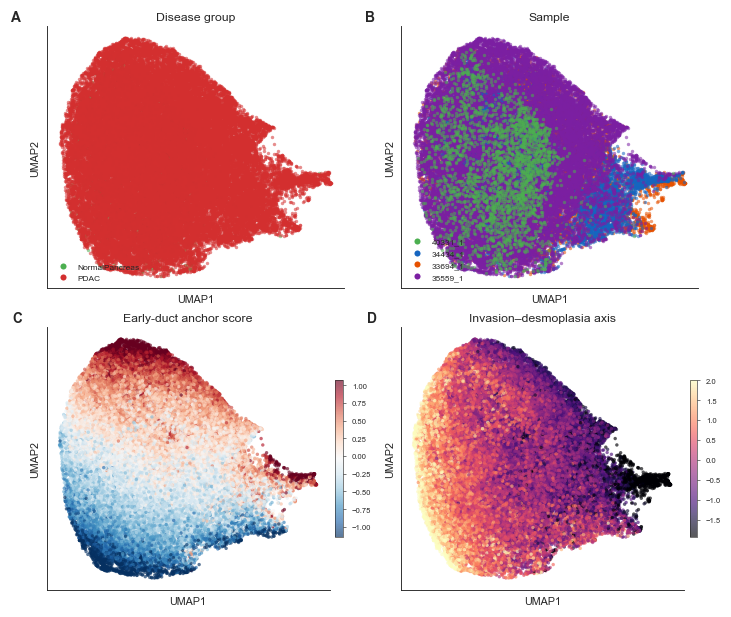

In [6]:
# ── Pooled UMAP diagnostics — publication layout ─────────────────────────────
# [reason] 2×2 panel: disease group, sample, early-duct anchor score,
# invasion-desmoplasia axis. Points rasterized for PDF export.

_diff_palette = {
    cfg["sample_id"]: SAMPLE_PALETTE.get(cfg["sample_id"], "#888")
    for cfg in SAMPLE_CONFIGS
}

fig, axes = plt.subplots(2, 2, figsize=(6.5, 5.5))
axes = axes.ravel()

plot_categorical_embedding(
    axes[0], embedding_df, "UMAP1", "UMAP2",
    "disease_group", "Disease group", DISEASE_PALETTE, size=5,
)
plot_categorical_embedding(
    axes[1], embedding_df, "UMAP1", "UMAP2",
    "sample_id", "Sample", _diff_palette, size=5,
)
plot_continuous_embedding(
    axes[2], embedding_df, "UMAP1", "UMAP2",
    "pdac_early_duct_anchor_score", "Early-duct anchor score",
    cmap="RdBu_r", size=5,
)
plot_continuous_embedding(
    axes[3], embedding_df, "UMAP1", "UMAP2",
    "pdac_invasion_desmoplasia_axis", "Invasion–desmoplasia axis",
    cmap="magma", size=5,
)

# Panel labels
for ax, lbl in zip(axes, list("ABCD")):
    ax.text(-0.12, 1.06, lbl, transform=ax.transAxes,
            fontsize=9, fontweight="bold", va="top", ha="left")

# Legends outside for A and B
for ax_idx, col, palette in [(0,"disease_group",DISEASE_PALETTE),(1,"sample_id",_diff_palette)]:
    handles = [plt.Line2D([0],[0], marker="o", color="w",
                markerfacecolor=c, markersize=5, label=k)
               for k,c in palette.items()]
    axes[ax_idx].legend(handles=handles, frameon=False, fontsize=5.5,
                        loc="lower left", ncol=1)

plt.tight_layout(pad=0.5, h_pad=0.8, w_pad=0.5)
plt.savefig(CACHE_DIR / "fig_umap_diagnostics.pdf")
plt.show()



## Stage 3. Fit a pooled principal tree

Only interpret this tree if the pooled embedding above shows a biologically coherent continuum rather than four isolated sample islands.

The root is anchored on:

- all normal-pancreas ductal niches
- plus the most early-anchor-like PDAC niches


In [7]:
# ── Fit pooled principal tree (detailed + simplified) ───────────────────────
# [reason] Two-tree strategy: detailed tree (NumNodes≈sqrt(N)*2.5) for
# pseudotime resolution; simplified tree (SIMPLIFIED_NUM_NODES) for stable
# branch labelling that is not affected by minor topological fluctuations.

reduced_data = X_pool_pca_use
n_niches = reduced_data.shape[0]
num_nodes = min(100, max(40, int(np.ceil(np.sqrt(n_niches) * 2.5))))
num_nodes_simple = SIMPLIFIED_NUM_NODES

pg_tree_pooled = elpigraph.computeElasticPrincipalTree(
    X=reduced_data,
    NumNodes=num_nodes,
    Lambda=0.01,
    Mu=0.01,
)[0]

pg_tree_pooled_simple = elpigraph.computeElasticPrincipalTree(
    X=reduced_data,
    NumNodes=num_nodes_simple,
    Lambda=0.01,
    Mu=0.01,
)[0]

early_anchor = pd.to_numeric(embedding_df["pdac_early_duct_anchor_score"], errors="coerce")
normal_mask = embedding_df["disease_group"] == "NormalPancreas"
pdac_mask = embedding_df["disease_group"] == "PDAC"

if pdac_mask.any():
    pdac_quantile = early_anchor[pdac_mask].quantile(0.9)
    pdac_early_mask = pdac_mask & (early_anchor >= pdac_quantile)
else:
    pdac_early_mask = early_anchor == early_anchor.max()

root_mask = normal_mask | pdac_early_mask
if root_mask.fillna(False).sum() == 0:
    root_mask = early_anchor == early_anchor.max()

root_anchor = reduced_data[root_mask.to_numpy()].mean(axis=0)
source_node_pooled = int(
    np.argmin(np.sum((pg_tree_pooled["NodePositions"] - root_anchor) ** 2, axis=1))
)
source_node_pooled_simple = int(
    np.argmin(np.sum((pg_tree_pooled_simple["NodePositions"] - root_anchor) ** 2, axis=1))
)

elpigraph.utils.getPseudotime(
    X=reduced_data,
    PG=pg_tree_pooled,
    source=source_node_pooled,
    target=None,
)

elpigraph.utils.getPseudotime(
    X=reduced_data,
    PG=pg_tree_pooled_simple,
    source=source_node_pooled_simple,
    target=None,
)

pooled_result_df = embedding_df.copy()
pooled_result_df["pooled_pseudotime"] = pg_tree_pooled["pseudotime"]
pooled_result_df["pooled_node_id"] = pg_tree_pooled["projection"]["node_id"]
pooled_result_df["pooled_edge_id"] = pg_tree_pooled["projection"]["edge_id"]
pooled_result_df["simple_pseudotime"] = pg_tree_pooled_simple["pseudotime"]
pooled_result_df["simple_node_id"] = pg_tree_pooled_simple["projection"]["node_id"]
pooled_result_df["simple_edge_id"] = pg_tree_pooled_simple["projection"]["edge_id"]
(
    auto_trunk_path,
    auto_branch_paths,
    auto_subbranch_paths,
    auto_tree_inference_df,
    auto_branch_inference_df,
    auto_leaf_score_df,
) = infer_auto_simple_tree_branch_paths(
    pooled_result_df,
    pg_tree_pooled_simple,
    node_col="simple_node_id",
)
pooled_result_df, major_branch_order, branch_summary_df, branch_definition_df = assign_simple_tree_branches_from_paths(
    pooled_result_df,
    pg_tree=pg_tree_pooled_simple,
    trunk_path=auto_trunk_path,
    branch_paths=auto_branch_paths,
    subbranch_paths=auto_subbranch_paths,
    node_col="simple_node_id",
    edge_col="simple_edge_id",
    out_col="major_branch",
)
simple_tree_node_summary_df = summarize_tree_nodes(
    pooled_result_df,
    pg_tree_pooled_simple,
    root_node=auto_trunk_path[0],
    node_col="simple_node_id",
    branch_col="major_branch",
)

save_df(pooled_result_df, CACHE_DIR / "pooled_niche_result_df.pkl")

print("NumNodes (detailed tree):", num_nodes)
print("NumNodes (simplified tree):", num_nodes_simple)
print("Root niches:", int(root_mask.sum()))
print("Major branch order:", major_branch_order)
print("Detailed root node:", source_node_pooled)
print("Simplified root node:", source_node_pooled_simple)
print("Simplified first branching node:", int(pooled_result_df["first_branch_node"].iloc[0]))
display(auto_tree_inference_df)
display(auto_branch_inference_df)
display(auto_leaf_score_df.head(10))
display(branch_summary_df)
display(branch_definition_df)
simple_tree_node_summary_df.sort_values(["depth_from_root", "node_id"])


NumNodes (detailed tree): 100
NumNodes (simplified tree): 36
Root niches: 7270
Major branch order: ['trunk', 'branch 12', 'branch 14', 'branch 14.a', 'branch 14.b', 'branch 15', 'branch 17', 'branch 20', 'branch 23', 'branch 23.a', 'branch 23.b', 'unassigned']
Detailed root node: 38
Simplified root node: 20
Simplified first branching node: 0


,hub_node,hub_degree,trunk_endpoint,trunk_path,n_branches
0,0,7,28,28-21-0,6


,label,entry_node,n_nodes,terminal_leaves,path,n_projected_niches
0,branch 12,12,5,31,0-12-16-2-19-31,7673
1,branch 14,14,5,"25,32",0-14,7427
2,branch 15,15,4,30,0-15-4-24-30,6498
3,branch 17,17,3,29,0-17-11-29,5169
4,branch 20,20,3,26,0-20-6-26,6974
5,branch 23,23,12,"27,35",0-23,5612


,leaf_node,n_projected_niches,normal_fraction,early_anchor_mean
4,28,2426,0.214757,-0.169159
0,5,2310,0.196970,0.390125
7,31,781,0.122919,-0.522680
1,25,1710,0.101754,-0.015305
6,30,1224,0.097222,-1.109905
5,29,1612,0.081266,0.092209
2,26,2212,0.043852,0.168691
8,32,1471,0.036030,0.916373
9,35,195,0.005128,1.373671
3,27,226,0.000000,-0.694791


,major_branch,n_niches
0,branch 12,7839
6,branch 20,7171
4,branch 15,6678
5,branch 17,5331
3,branch 14.b,4743
10,trunk,3840
8,branch 23.a,3453
11,unassigned,2310
2,branch 14.a,1991
7,branch 23,1219


,label,level,path,nodes,first_branch_node,subbranches
0,trunk,trunk,28-21-0,"28,21,0",0,
1,branch 12,hub_branch,0-12-16-2-19-31,"2,12,16,19,31",0,
2,branch 14,hub_branch,0-14,"32,7,8,14,25",0,branch 14.a: 14-25; branch 14.b: 14-8-7-32
3,branch 14.a,subbranch,14-25,25,0,
4,branch 14.b,subbranch,14-8-7-32,"8,7,32",0,
5,branch 15,hub_branch,0-15-4-24-30,"24,4,30,15",0,
6,branch 17,hub_branch,0-17-11-29,"17,11,29",0,
7,branch 20,hub_branch,0-20-6-26,"26,20,6",0,
8,branch 23,hub_branch,0-23,"1,33,3,34,35,9,10,13,18,22,23,27",0,branch 23.a: 23-13-1-22-9-27; branch 23.b: 23-...
9,branch 23.a,subbranch,23-13-1-22-9-27,"13,1,22,9,27",0,


,node_id,parent,depth_from_root,degree,n_projected_niches,children,top_branch_labels
28,28,NaN,0,1,2426,21,{'trunk': 2426}
21,21,28.0,1,3,1292,"0,5",{'trunk': 1292}
0,0,21.0,2,7,1193,"12,14,15,17,20,23","{'branch 14': 226, 'branch 20': 197, 'branch 1..."
5,5,21.0,2,1,2310,,{'unassigned': 2310}
12,12,0.0,3,2,2294,16,{'branch 12': 2294}
14,14,0.0,3,3,1468,"8,25","{'branch 14': 693, 'branch 14.b': 494, 'branch..."
15,15,0.0,3,2,2145,4,{'branch 15': 2145}
17,17,0.0,3,2,2285,11,{'branch 17': 2285}
20,20,0.0,3,2,2705,6,{'branch 20': 2705}
23,23,0.0,3,2,1634,13,"{'branch 23': 1079, 'branch 23.a': 555}"


### Quantile-normalised pooled pseudotime

Rank-based rescaling to [0,1] spreads niches evenly along the trajectory for higher-resolution spatial maps.

In [8]:
# ── Quantile-normalised pooled pseudotime ────────────────────────────────────
# Raw pseudotime piles up at frequently-visited tree nodes; rank-based rescaling
# to [0,1] spreads niches evenly, improving spatial map colour resolution.
# Two versions:
#   pooled_pseudotime_q  – global rank over all niches (used for spatial maps)
#   simple_pseudotime_q  – same, based on the simplified-tree pseudotime
from scipy.stats import rankdata as _rankdata

for _raw_col, _q_col in [
    ("pooled_pseudotime",  "pooled_pseudotime_q"),
    ("simple_pseudotime",  "simple_pseudotime_q"),
]:
    _valid = pooled_result_df[_raw_col].notna()
    _n = _valid.sum()
    _ranks = _rankdata(pooled_result_df.loc[_valid, _raw_col], method="average")
    pooled_result_df.loc[_valid, _q_col] = (_ranks - 1) / (_n - 1)

# Per-branch quantile (useful for branch-stratified plots)
pooled_result_df["pooled_pseudotime_qb"] = np.nan
for _branch, _grp in pooled_result_df.groupby("major_branch", dropna=True):
    _v = _grp["pooled_pseudotime"].notna()
    if _v.sum() < 2:
        continue
    _r = _rankdata(_grp.loc[_v, "pooled_pseudotime"], method="average")
    pooled_result_df.loc[_grp.index[_v], "pooled_pseudotime_qb"] = (_r - 1) / (_r.max() - 1)

save_df(pooled_result_df, CACHE_DIR / "pooled_niche_result_df.pkl")

print("Pooled pseudotime quantile distribution (global):")
print(pooled_result_df["pooled_pseudotime_q"].describe().round(3))
print("\nPooled pseudotime quantile distribution (per-branch):")
print(pooled_result_df["pooled_pseudotime_qb"].describe().round(3))


Pooled pseudotime quantile distribution (global):
count    46574.000
mean         0.500
std          0.289
min          0.000
25%          0.250
50%          0.499
75%          0.750
max          0.999
Name: pooled_pseudotime_q, dtype: float64

Pooled pseudotime quantile distribution (per-branch):
count    46574.000
mean         0.506
std          0.292
min          0.000
25%          0.253
50%          0.505
75%          0.766
max          1.000
Name: pooled_pseudotime_qb, dtype: float64


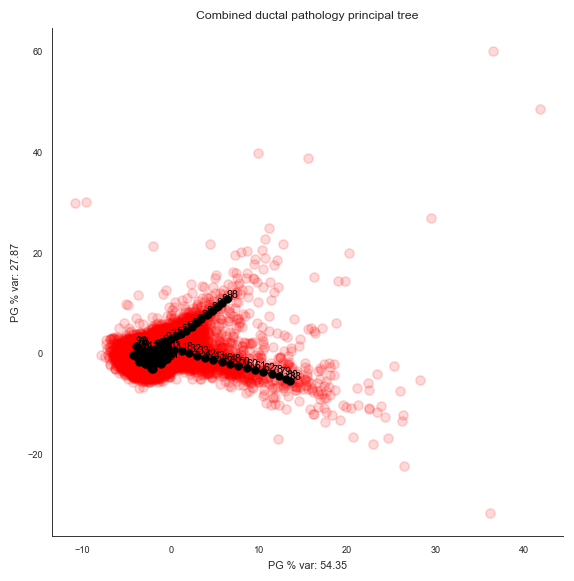

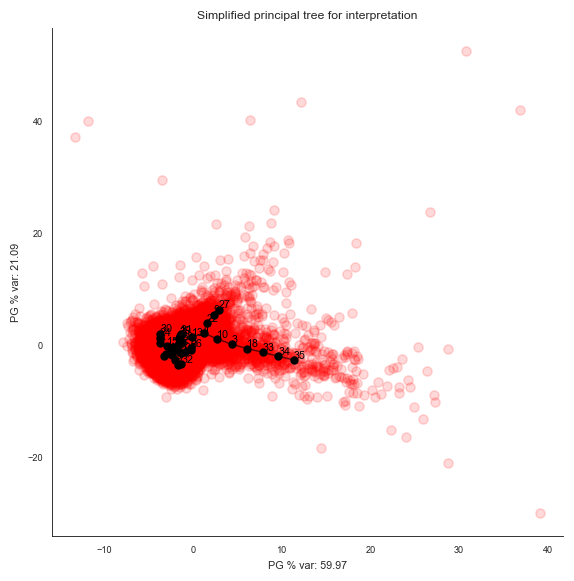

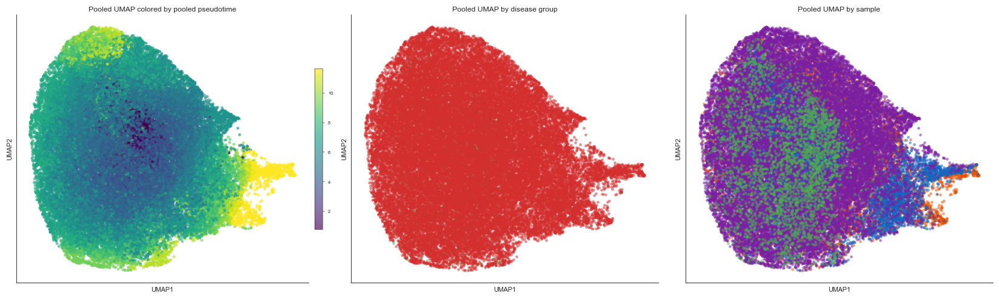

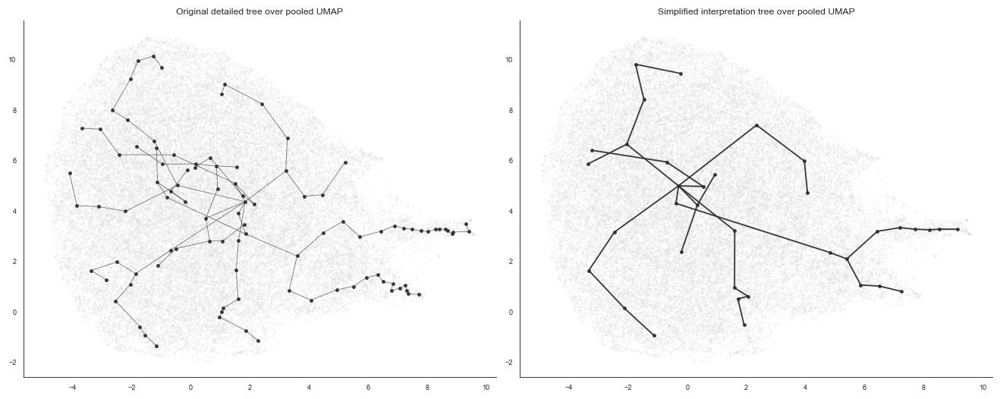

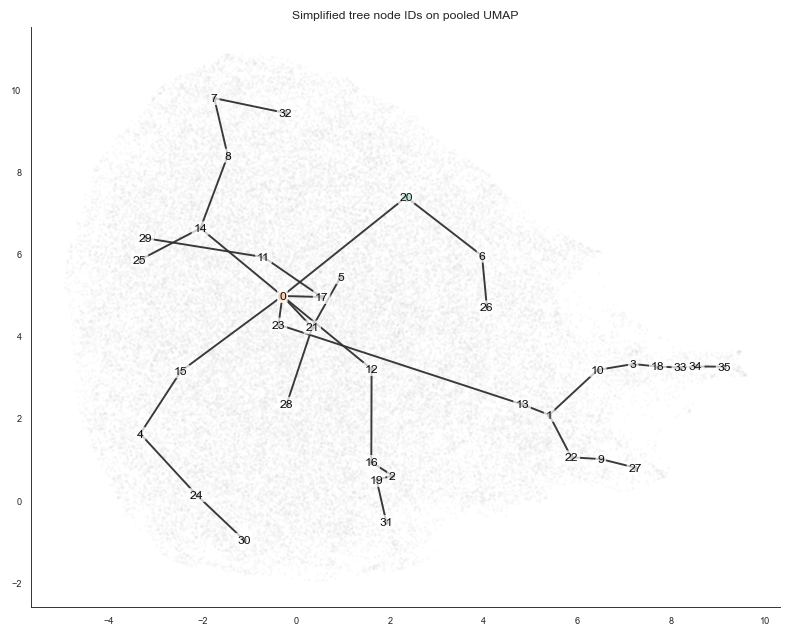

/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_38678/2484791376.py:340: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


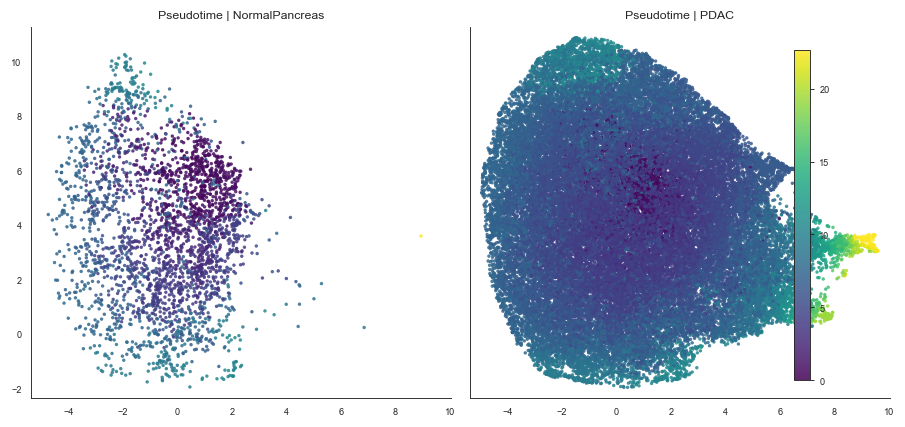

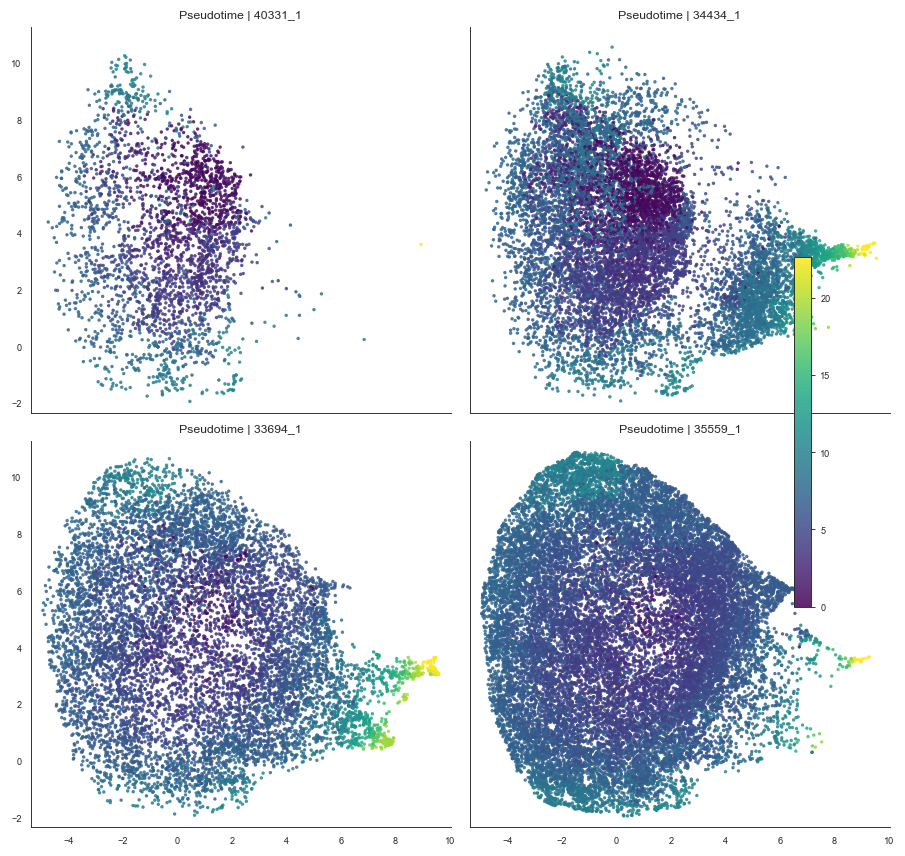

In [9]:
# ── Palette aliases (match cell 9 constants) ────────────────────────────────
disease_palette = DISEASE_PALETTE
sample_palette  = SAMPLE_PALETTE


plt.figure(figsize=(6, 6))
elpigraph.plot.PlotPG(
    reduced_data,
    pg_tree_pooled,
    Do_PCA=True,
    show_text=True,
)
plt.title("Combined ductal pathology principal tree")
plt.grid(False)
plt.show()

plt.figure(figsize=(6, 6))
elpigraph.plot.PlotPG(
    reduced_data,
    pg_tree_pooled_simple,
    Do_PCA=True,
    show_text=True,
)
plt.title("Simplified principal tree for interpretation")
plt.grid(False)
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))

plot_continuous_embedding(
    axes[0],
    pooled_result_df,
    x="UMAP1",
    y="UMAP2",
    color="pooled_pseudotime",
    title="Pooled UMAP colored by pooled pseudotime",
)
plot_categorical_embedding(
    axes[1],
    pooled_result_df,
    x="UMAP1",
    y="UMAP2",
    color="disease_group",
    title="Pooled UMAP by disease group",
    palette=disease_palette,
)
plot_categorical_embedding(
    axes[2],
    pooled_result_df,
    x="UMAP1",
    y="UMAP2",
    color="sample_id",
    title="Pooled UMAP by sample",
    palette=sample_palette,
)

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(12, 4.8))
plot_umap_tree_structure_overlay(
    axes[0],
    pooled_result_df,
    pg_tree_pooled,
    node_col="pooled_node_id",
    point_size=2.5,
    point_alpha=0.15,
    line_width=0.55,
    line_alpha=0.65,
)
axes[0].set_title("Original detailed tree over pooled UMAP")

plot_umap_tree_structure_overlay(
    axes[1],
    pooled_result_df,
    pg_tree_pooled_simple,
    node_col="simple_node_id",
    point_size=2.5,
    point_alpha=0.15,
    line_width=1.2,
    line_alpha=0.95,
)
axes[1].set_title("Simplified interpretation tree over pooled UMAP")

plt.tight_layout()
plt.show()

first_branch_node_simple = int(pooled_result_df["first_branch_node"].iloc[0])

fig, ax = plt.subplots(figsize=(7.2, 5.8))
simple_node_layout_df, simple_edge_layout_df = plot_umap_tree_structure_overlay(
    ax,
    pooled_result_df,
    pg_tree_pooled_simple,
    node_col="simple_node_id",
    point_size=2.5,
    point_alpha=0.12,
    line_width=1.25,
    line_alpha=0.95,
    show_node_labels=True,
    label_size=8,
    highlight_nodes={
        source_node_pooled_simple: "#1b9e77",
        first_branch_node_simple: "#d95f02",
    },
)
ax.set_title("Simplified tree node IDs on pooled UMAP")
plt.tight_layout()
plt.show()

simple_node_layout_df.sort_values("node_id").head()

plot_continuous_embedding_facets(
    pooled_result_df,
    facet_col="disease_group",
    x="UMAP1",
    y="UMAP2",
    color="pooled_pseudotime",
    cmap="viridis",
    title_prefix="Pseudotime | ",
    size=5,
    n_cols=2,
)

plot_continuous_embedding_facets(
    pooled_result_df,
    facet_col="sample_id",
    x="UMAP1",
    y="UMAP2",
    color="pooled_pseudotime",
    cmap="viridis",
    title_prefix="Pseudotime | ",
    size=5,
    n_cols=2,
)



### Optional: simplified-tree stability

This cell refits the simplified tree at several node counts and re-runs the automatic hub/trunk/branch inference.

It is intentionally controlled by `RUN_TREE_STABILITY_TEST` because each node count requires another ElPiGraph fit.


In [10]:

RUN_TREE_STABILITY_TEST = False
TREE_STABILITY_NUM_NODES = [18, 24, 30, 36]

if RUN_TREE_STABILITY_TEST:
    tree_stability_df, tree_branch_stability_df, tree_leaf_score_stability_df = run_simplified_tree_stability(
        X=reduced_data,
        embedding_df=embedding_df,
        root_anchor=root_anchor,
        num_nodes_list=TREE_STABILITY_NUM_NODES,
        lambda_value=0.005,
        mu_value=0.01,
    )
    save_df(tree_stability_df, CACHE_DIR / "simple_tree_stability_summary.pkl")
    save_df(tree_branch_stability_df, CACHE_DIR / "simple_tree_stability_branch_definitions.pkl")
    save_df(tree_leaf_score_stability_df, CACHE_DIR / "simple_tree_stability_leaf_scores.pkl")
    display(tree_stability_df)
    display(tree_branch_stability_df)
    display(tree_leaf_score_stability_df)
else:
    print("Set RUN_TREE_STABILITY_TEST = True to refit simplified trees at:", TREE_STABILITY_NUM_NODES)


Set RUN_TREE_STABILITY_TEST = True to refit simplified trees at: [18, 24, 30, 36]


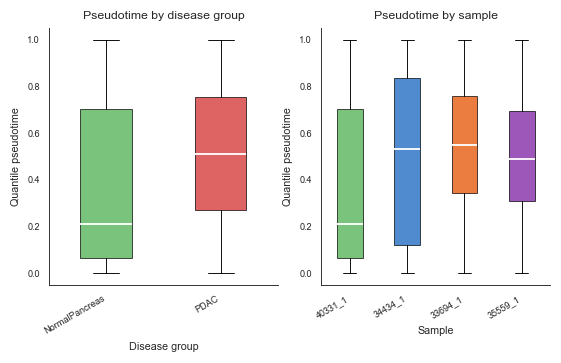

In [11]:
# ── Pseudotime bin × sample-disease composition ─────────────────────────────
# [reason] Check that normal pancreas niches occupy one end of the trajectory
# and invasive PDAC niches the other — basic sanity check before interpreting
# branch biology.

pooled_result_df["pt_bin"] = pd.qcut(
    pooled_result_df["pooled_pseudotime"],
    q=min(12, pooled_result_df["pooled_pseudotime"].nunique()),
    duplicates="drop",
)

bin_comp_df = (
    pooled_result_df.groupby(["pt_bin", "disease_group"], observed=True)
    .size()
    .rename("n")
    .reset_index()
)
bin_comp_df["fraction"] = (
    bin_comp_df["n"] /
    bin_comp_df.groupby("pt_bin", observed=True)["n"].transform("sum")
)
bin_comp_df["pt_bin_center"] = bin_comp_df["pt_bin"].apply(lambda x: x.mid)

fig, axes = plt.subplots(1, 2, figsize=(5.0, 3.2))

_pt_col = "pooled_pseudotime_q"
for ax, group_col, palette, xlabel in [
    (axes[0], "disease_group", DISEASE_PALETTE, "Disease group"),
    (axes[1], "sample_id",    SAMPLE_PALETTE,   "Sample"),
]:
    order = list(palette.keys()) if group_col == "sample_id" else ["NormalPancreas", "PDAC"]
    order = [o for o in order if o in pooled_result_df[group_col].unique()]
    colors = [palette.get(o, "#888") for o in order]
    bp = ax.boxplot(
        [pooled_result_df.loc[pooled_result_df[group_col]==o, _pt_col].dropna()
         for o in order],
        positions=range(len(order)),
        widths=0.45,
        patch_artist=True,
        medianprops=dict(color="white", linewidth=1.2),
        whiskerprops=dict(linewidth=0.6),
        capprops=dict(linewidth=0.6),
        flierprops=dict(marker=".", markersize=1, alpha=0.3, markeredgewidth=0),
        notch=False,
    )
    for patch, c in zip(bp["boxes"], colors):
        patch.set(facecolor=c, alpha=0.75, linewidth=0.6)
    ax.set_xticks(range(len(order)))
    ax.set_xticklabels([DIFF_LABEL.get(o, o) for o in order] if group_col=="differentiation_label"
                        else order, rotation=30, ha="right", fontsize=6)
    ax.set_ylabel("Quantile pseudotime", fontsize=7)
    ax.set_xlabel(xlabel, fontsize=7)
    for sp in ["top","right"]: ax.spines[sp].set_visible(False)

axes[0].set_title("Pseudotime by disease group", fontsize=8)
axes[1].set_title("Pseudotime by sample", fontsize=8)
plt.tight_layout(pad=0.5)
plt.savefig(CACHE_DIR / "fig_pseudotime_distribution.pdf")
plt.show()



/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_38678/2543052358.py:27: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(sub[_pt_col], sub[col], s=3, alpha=0.15, c=bcol,
/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_38678/2543052358.py:27: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(sub[_pt_col], sub[col], s=3, alpha=0.15, c=bcol,
/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/i

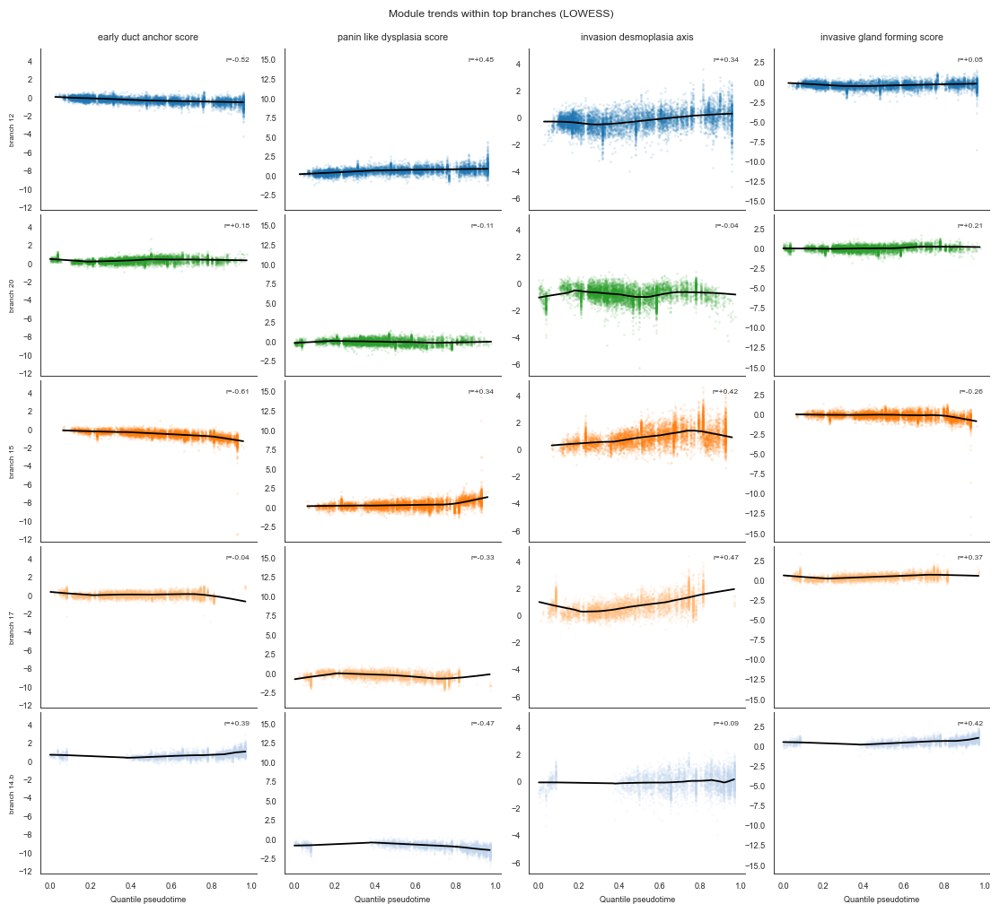

In [12]:
# ── Module score trends — branch-stratified LOWESS ───────────────────────────
# [reason] Global LOWESS is flat because branches with opposite slopes cancel
# (Simpson's paradox). Within each branch the trend is strong (r = 0.3–0.6).
# Here we plot the top 4 branches individually.

trend_cols = [
    "pdac_early_duct_anchor_score",
    "pdac_panin_like_dysplasia_score",
    "pdac_invasion_desmoplasia_axis",
    "pdac_invasive_gland_forming_score",
]
_top_branches = pooled_result_df["major_branch"].value_counts().index[:5].tolist()
_branch_palette = branch_palette_from_df(pooled_result_df, branch_col="major_branch")

_pt_col = "pooled_pseudotime_q"
n_cols = len(trend_cols)
n_rows = len(_top_branches)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(2.5 * n_cols, 1.8 * n_rows),
                         sharex=True, sharey="col")

for row, branch in enumerate(_top_branches):
    sub = pooled_result_df[pooled_result_df["major_branch"] == branch]
    bcol = _branch_palette.get(branch, "#888")
    for col_idx, col in enumerate(trend_cols):
        ax = axes[row, col_idx]
        ax.scatter(sub[_pt_col], sub[col], s=3, alpha=0.15, c=bcol,
                   linewidths=0, rasterized=True)
        smooth = lowess_smooth(sub[_pt_col], sub[col], frac=0.35)
        if smooth is not None:
            ax.plot(smooth[:, 0], smooth[:, 1], color="black", lw=1.2, zorder=3)
        r = sub[col].corr(sub[_pt_col])
        ax.text(0.97, 0.95, f"r={r:+.2f}", transform=ax.transAxes,
                fontsize=5.5, ha="right", va="top", color="#333")
        for sp in ["top","right"]: ax.spines[sp].set_visible(False)
        if col_idx == 0:
            short = globals().get("branch_bio_names", {}).get(branch, branch)
            ax.set_ylabel(short[:22], fontsize=5.5, labelpad=2)
        if row == 0:
            ax.set_title(col.replace("pdac_","").replace("_"," "), fontsize=7)
        if row == n_rows - 1:
            ax.set_xlabel("Quantile pseudotime", fontsize=6)

fig.suptitle("Module trends within top branches (LOWESS)", fontsize=8, y=1.01)
plt.tight_layout(pad=0.3, h_pad=0.4, w_pad=0.4)
plt.savefig(CACHE_DIR / "fig_module_trends_by_branch.pdf")
plt.show()



## Stage 4. Branch-aware pooled views

These views are useful when the combined trajectory is branching rather than close to linear.

They help answer:

- which major branches dominate different samples?
- whether normal pancreas sits mainly on one trunk while PDAC occupies multiple branches
- whether specific branches are associated with distinct pathology-module profiles

Important note:

- the fitted tree lives in pooled PCA space, not in UMAP space
- so apparent “jumps” on the UMAP can reflect UMAP distortion as much as true biological discontinuity
- for interpretation, we therefore keep the original detailed tree for pseudotime, but use the simplified tree plus structural branch labels for visualization
- here `trunk` means the path from the rooted start to the first branching node of the simplified tree
- `branch 1`, `branch 2`, ... are the first-generation branches that emerge from that split


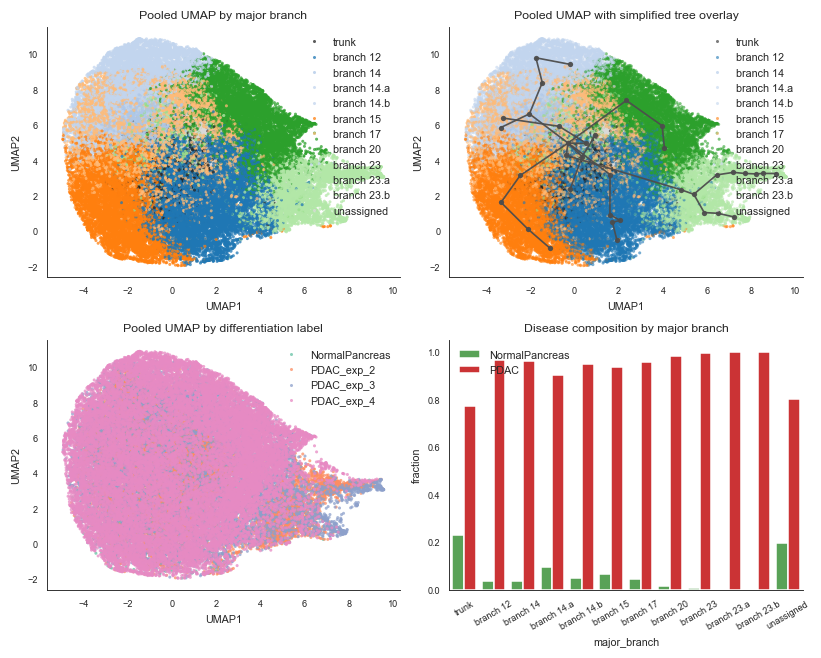

/var/folders/kg/btvhyzjs5fb7f_57bfqf24tr0000gn/T/ipykernel_38678/3733109895.py:93: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(frameon=False, fontsize=7, loc="best")


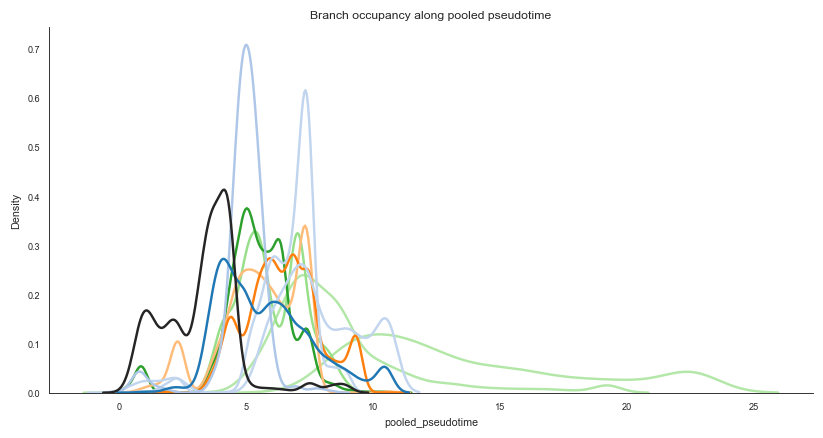

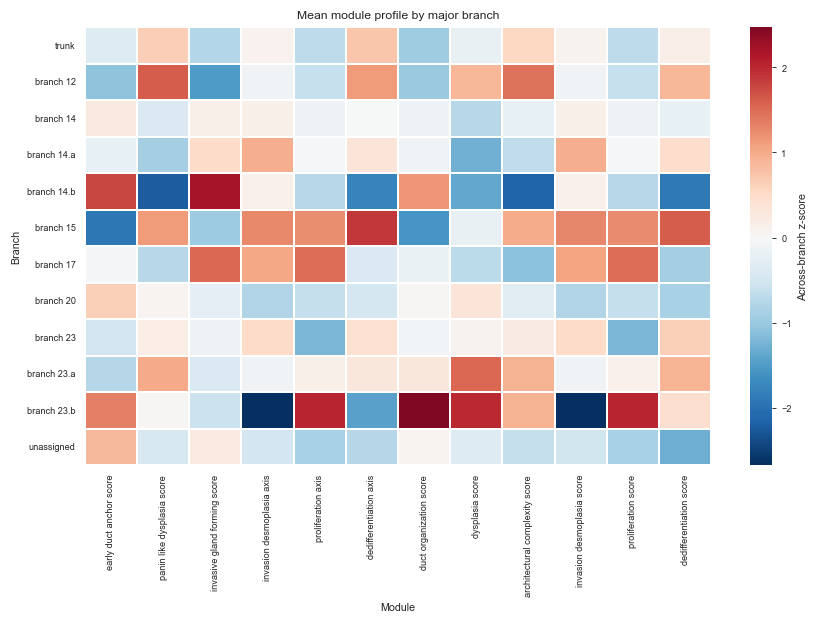

,node_id,parent,depth_from_root,degree,n_projected_niches,children,top_branch_labels
28,28,NaN,0,1,2426,21,{'trunk': 2426}
21,21,28.0,1,3,1292,"0,5",{'trunk': 1292}
0,0,21.0,2,7,1193,"12,14,15,17,20,23","{'branch 14': 226, 'branch 20': 197, 'branch 1..."
5,5,21.0,2,1,2310,,{'unassigned': 2310}
12,12,0.0,3,2,2294,16,{'branch 12': 2294}
14,14,0.0,3,3,1468,"8,25","{'branch 14': 693, 'branch 14.b': 494, 'branch..."
15,15,0.0,3,2,2145,4,{'branch 15': 2145}
17,17,0.0,3,2,2285,11,{'branch 17': 2285}
20,20,0.0,3,2,2705,6,{'branch 20': 2705}
23,23,0.0,3,2,1634,13,"{'branch 23': 1079, 'branch 23.a': 555}"


In [13]:

branch_palette = branch_palette_from_df(pooled_result_df, branch_col="major_branch")

fig, axes = plt.subplots(2, 2, figsize=(7.5, 6.0))
axes = np.array(axes).reshape(-1)

sns.scatterplot(
    data=pooled_result_df,
    x="UMAP1",
    y="UMAP2",
    hue="major_branch",
    hue_order=major_branch_order,
    palette=branch_palette,
    s=4,
    linewidth=0,
    alpha=0.75,
    ax=axes[0],
)
axes[0].set_title("Pooled UMAP by major branch")
axes[0].grid(False)
axes[0].legend(frameon=False, fontsize=7, loc="best")

plot_umap_tree_overlay(
    axes[1],
    pooled_result_df,
    pg_tree_pooled_simple,
    node_col="simple_node_id",
    color_col="major_branch",
    palette=branch_palette,
    hue_order=major_branch_order,
    point_size=4,
    alpha=0.60,
)
axes[1].set_title("Pooled UMAP with simplified tree overlay")
axes[1].grid(False)
axes[1].legend(frameon=False, fontsize=7, loc="best")

branch_comp_df = (
    pooled_result_df.groupby(["major_branch", "disease_group"], observed=True)
    .size()
    .rename("n")
    .reset_index()
)
branch_comp_df["fraction"] = (
    branch_comp_df["n"] /
    branch_comp_df.groupby("major_branch", observed=True)["n"].transform("sum")
)

sns.barplot(
    data=branch_comp_df,
    x="major_branch",
    y="fraction",
    hue="disease_group",
    order=major_branch_order,
    palette={"NormalPancreas": "#4daf4a", "PDAC": "#e41a1c"},
    ax=axes[3],
)
axes[3].set_title("Disease composition by major branch")
axes[3].tick_params(axis="x", rotation=30)
axes[3].grid(False)
axes[3].legend(frameon=False, fontsize=7, loc="best")

sns.scatterplot(
    data=pooled_result_df,
    x="UMAP1",
    y="UMAP2",
    hue="differentiation_label",
    palette="Set2",
    s=4,
    linewidth=0,
    alpha=0.75,
    ax=axes[2],
)
axes[2].set_title("Pooled UMAP by differentiation label")
axes[2].grid(False)
axes[2].legend(frameon=False, fontsize=7, loc="best")

plt.tight_layout()
plt.show()

plt.figure(figsize=(7.5, 4.0))
sns.kdeplot(
    data=pooled_result_df[pooled_result_df["major_branch"] != "unassigned"],
    x="pooled_pseudotime",
    hue="major_branch",
    hue_order=[x for x in major_branch_order if x != "unassigned"],
    palette=branch_palette,
    common_norm=False,
    fill=False,
    linewidth=1.6,
)
plt.title("Branch occupancy along pooled pseudotime")
plt.grid(False)
plt.legend(frameon=False, fontsize=7, loc="best")
plt.tight_layout()
plt.show()

branch_module_mean_df = plot_branch_module_heatmap(
    pooled_result_df,
    module_cols=MODULE_COLS,
    group_col="major_branch",
    group_order=major_branch_order,
    top_n=TOP_BRANCH_GROUPS_FOR_SUMMARY,
)
branch_module_mean_df.head()

branch_summary_df

branch_definition_df

simple_tree_node_summary_df.sort_values(["depth_from_root", "node_id"])


### Branch biological naming and module trend plots

Auto-assign descriptive names based on dominant module z-enrichment, then show branch-stratified LOWESS trends.

In [14]:
# ── Auto-assign biological names to pooled branches ──────────────────────────
# Score each branch by its mean module z-enrichment, then pick the dominant
# signal to generate a readable name. These names are used in downstream plots.
import re as _re

_name_map_rules = [
    ("early_duct_anchor",        "Normal/early-duct"),
    ("panin_like_dysplasia",     "PanIN-like dysplasia"),
    ("invasive_gland_forming",   "Invasive gland-forming"),
    ("invasion_desmoplasia",     "Invasive-desmoplastic"),
    ("proliferation",            "Proliferative"),
    ("dedifferentiation",        "Dedifferentiated"),
]

_module_cols_present = [c for c in MODULE_COLS if c in pooled_result_df.columns]
_branch_means = (
    pooled_result_df[pooled_result_df["major_branch"].isin(major_branch_order)]
    .groupby("major_branch", observed=True)[_module_cols_present]
    .mean()
)
# Z-score across branches for each module
_branch_z = _branch_means.apply(
    lambda col: (col - col.mean()) / (col.std(ddof=0) if col.std(ddof=0) > 1e-8 else 1.0),
    axis=0,
)

branch_bio_names = {}
for _branch in major_branch_order:
    if _branch == "trunk":
        branch_bio_names[_branch] = "Trunk (normal→early PDAC)"
        continue
    if _branch not in _branch_z.index:
        branch_bio_names[_branch] = str(_branch)
        continue
    _row = _branch_z.loc[_branch]
    _best_col = _row.idxmax()
    _best_z   = _row.max()
    _bio_name = str(_branch)
    for _keyword, _display in _name_map_rules:
        if _keyword in _best_col:
            _bio_name = f"{_display} ({_branch})"
            break
    branch_bio_names[_branch] = _bio_name

print("Branch biological names:")
for _b, _name in branch_bio_names.items():
    _n = int(pooled_result_df[pooled_result_df["major_branch"] == _b].shape[0])
    print(f"  {_b:20s} → {_name}  [n={_n}]")


Branch biological names:
  trunk                → Trunk (normal→early PDAC)  [n=3840]
  branch 12            → PanIN-like dysplasia (branch 12)  [n=7839]
  branch 14            → Normal/early-duct (branch 14)  [n=919]
  branch 14.a          → Invasive-desmoplastic (branch 14.a)  [n=1991]
  branch 14.b          → Invasive gland-forming (branch 14.b)  [n=4743]
  branch 15            → Dedifferentiated (branch 15)  [n=6678]
  branch 17            → Invasive gland-forming (branch 17)  [n=5331]
  branch 20            → Normal/early-duct (branch 20)  [n=7171]
  branch 23            → Dedifferentiated (branch 23)  [n=1219]
  branch 23.a          → branch 23.a  [n=3453]
  branch 23.b          → branch 23.b  [n=1080]
  unassigned           → Normal/early-duct (unassigned)  [n=2310]


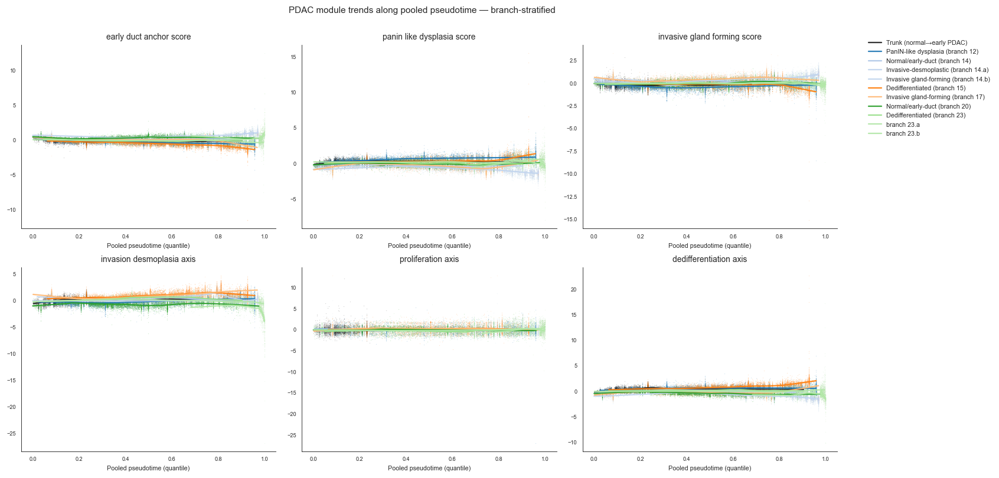

In [15]:
# ── Branch-stratified module trend plots ─────────────────────────────────────
# Plot each PDAC module score along pooled_pseudotime_q, stratified by branch.
# This is more informative than the per-disease-group trend in cell 16.
_pt_q_col = "pooled_pseudotime_q" if "pooled_pseudotime_q" in pooled_result_df.columns else "pooled_pseudotime"

_trend_module_cols = [
    "pdac_early_duct_anchor_score",
    "pdac_panin_like_dysplasia_score",
    "pdac_invasive_gland_forming_score",
    "pdac_invasion_desmoplasia_axis",
    "pdac_proliferation_axis",
    "pdac_dedifferentiation_axis",
]
_trend_module_cols = [c for c in _trend_module_cols if c in pooled_result_df.columns]

# Use top branches only (exclude tiny/unassigned)
_plot_branches = [b for b in major_branch_order if b not in {"unassigned"}
                  and pooled_result_df[pooled_result_df["major_branch"]==b].shape[0] >= 200]

_n_cols, _n_rows = 3, int(np.ceil(len(_trend_module_cols) / 3))
fig, axes = plt.subplots(_n_rows, _n_cols, figsize=(13, 3.6 * _n_rows))
axes = np.array(axes).reshape(-1)

for ax, _col in zip(axes, _trend_module_cols):
    for _branch in _plot_branches:
        _sub = pooled_result_df[pooled_result_df["major_branch"] == _branch].copy()
        _sub = _sub[[_pt_q_col, _col]].dropna().sort_values(_pt_q_col)
        if len(_sub) < 50:
            continue
        _color = branch_palette.get(_branch, "#7f7f7f")
        ax.scatter(_sub[_pt_q_col], _sub[_col],
                   s=0.8, alpha=0.18, c=[_color], linewidths=0, rasterized=True)
        _smooth = lowess_smooth(_sub[_pt_q_col], _sub[_col], frac=0.3)
        if _smooth is not None:
            _bio = branch_bio_names.get(_branch, _branch)
            ax.plot(_smooth[:,0], _smooth[:,1], color=_color, linewidth=1.5,
                    label=_bio, alpha=0.92)
    ax.set_title(_col.replace("pdac_","").replace("_"," "), fontsize=9)
    ax.set_xlabel("Pooled pseudotime (quantile)", fontsize=7)
    ax.grid(False)

for ax in axes[len(_trend_module_cols):]:
    ax.axis("off")

# Shared legend outside
_handles, _labels = [], []
for ax in axes[:len(_trend_module_cols)]:
    _h, _l = ax.get_legend_handles_labels()
    for h, l in zip(_h, _l):
        if l not in _labels:
            _handles.append(h)
            _labels.append(l)
fig.legend(_handles, _labels, loc="upper right", bbox_to_anchor=(1.18, 0.95),
           frameon=False, fontsize=7, markerscale=6)
fig.suptitle("PDAC module trends along pooled pseudotime — branch-stratified", fontsize=10, y=1.01)
plt.tight_layout()
plt.savefig(CACHE_DIR / "pooled_module_trends_branch_stratified.pdf", dpi=300, bbox_inches="tight")
plt.savefig(CACHE_DIR / "pooled_module_trends_branch_stratified.png", dpi=200, bbox_inches="tight")
plt.show()



## Stage 5. Project the pooled trajectory back into tissue space

This is often the most persuasive “application value” visualization:

- the pooled trajectory is not just an embedding artifact
- it maps back to real spatial ductal structures in each tissue section


In [16]:
# ── Build spatial-cell tables for all samples ───────────────────────────────
# [reason] Merge pseudotime + branch labels back to individual cells so the
# trajectory can be visualised in tissue coordinates (most interpretable plot).

spatial_cell_tables = {}
for sample_id in SPATIAL_VIS_SAMPLE_IDS:
    cfg = get_sample_cfg(sample_id)
    spatial_cell_tables[sample_id] = build_sample_spatial_cell_df(
        cfg,
        pooled_result_df,
        force=False,
    )
    print(
        sample_id,
        spatial_cell_tables[sample_id].shape,
        "n niche-assigned cells =",
        int(spatial_cell_tables[sample_id]["has_pooled_niche"].sum()),
    )


40331_1 (1443965, 22) n niche-assigned cells = 42212
34434_1 (1763634, 22) n niche-assigned cells = 385675
33694_1 (2919250, 22) n niche-assigned cells = 379314
35559_1 (1994937, 22) n niche-assigned cells = 430869


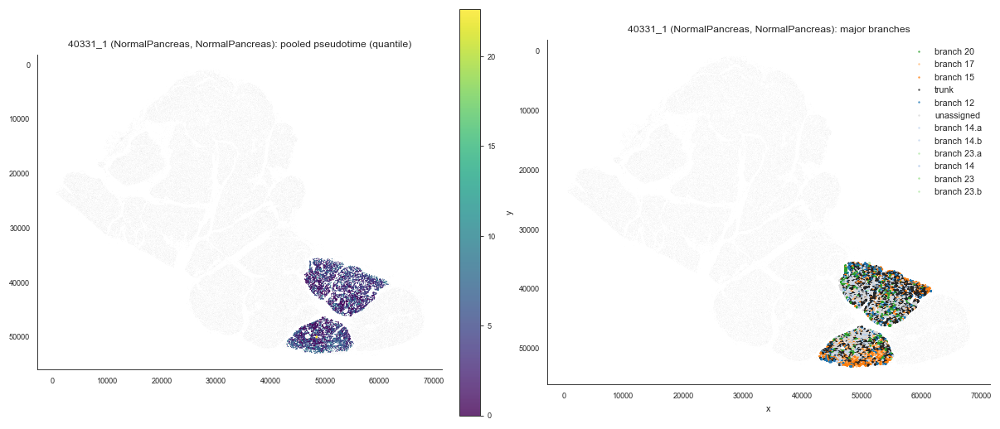

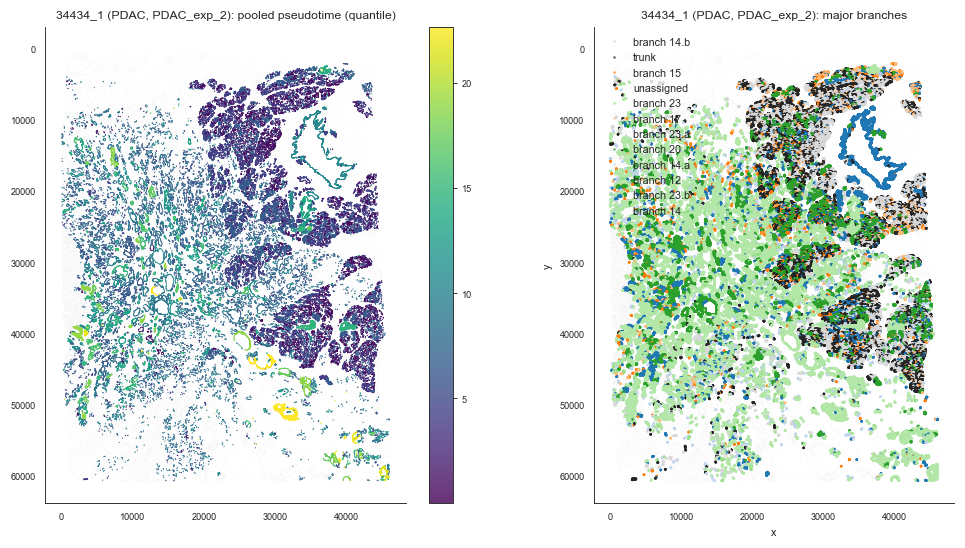

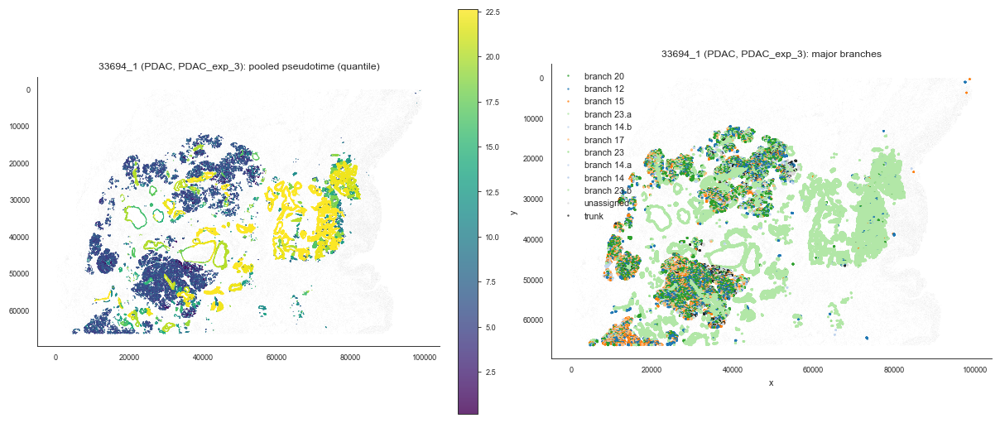

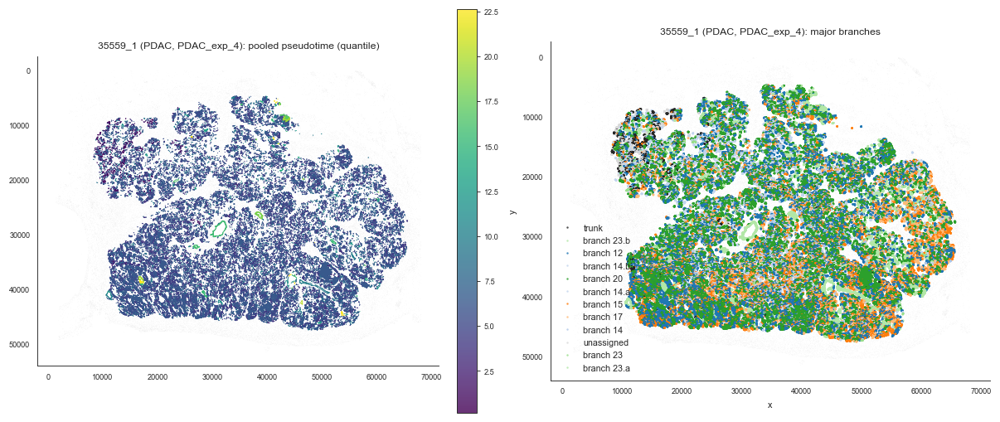

In [17]:

for sample_id in SPATIAL_VIS_SAMPLE_IDS:
    sample_df = spatial_cell_tables[sample_id]
    title_prefix = (
        f"{sample_id} "
        f"({sample_df['disease_group'].iloc[0]}, {sample_df['differentiation_label'].iloc[0]})"
    )
    plot_spatial_sample_views(
        sample_df,
        title_prefix=title_prefix,
        background_max=140000,
        point_size=0.08,
        niche_point_size=0.18,
    )



## Stage 6. Representative niche examples

These panels highlight concrete ductal niches sampled from different parts of the pooled trajectory.

They are useful for slides/talks because they turn the abstract pooled tree back into recognizable tissue structures.


In [18]:

representative_niches_df = select_representative_niches(
    pooled_result_df,
    sample_id=REPRESENTATIVE_SAMPLE_ID,
    group_col="major_branch",
    group_order=[x for x in major_branch_order if x not in {"trunk", "other", "unassigned"}],
    quantiles=REPRESENTATIVE_NICHE_QUANTILES,
    top_n_groups=TOP_BRANCH_GROUPS_FOR_SUMMARY,
)

representative_niches_df[
    [
        "sample_id",
        "disease_group",
        "major_branch",
        "simple_edge_id",
        "pooled_edge_id",
        "pooled_pseudotime",
        "pdac_early_duct_anchor_score",
        "pdac_invasion_desmoplasia_axis",
        "pdac_dedifferentiation_axis",
        "quantile_label",
        NICHE_KEY,
    ]
].head(12)


,sample_id,disease_group,major_branch,simple_edge_id,pooled_edge_id,pooled_pseudotime,pdac_early_duct_anchor_score,pdac_invasion_desmoplasia_axis,pdac_dedifferentiation_axis,quantile_label,pancreatic ductal epithelium_mask_component
0,33694_1,PDAC,branch 12,3,22,4.016300,-0.503966,-0.010389,0.357795,q0.15,global__component_10587
1,33694_1,PDAC,branch 12,9,14,6.113416,-0.402410,-0.063272,0.198256,q0.50,global__component_9458
2,33694_1,PDAC,branch 12,14,29,7.865136,-0.066037,0.471300,0.542448,q0.85,global__component_2570
3,33694_1,PDAC,branch 14,5,24,4.605686,0.274439,0.425589,0.081606,q0.15,global__component_5846
4,33694_1,PDAC,branch 14,5,6,5.012364,0.108295,-0.178373,-0.257094,q0.50,global__component_4178
5,33694_1,PDAC,branch 14,5,0,5.665922,0.118921,0.630497,-0.097567,q0.85,global__component_4492
6,33694_1,PDAC,branch 14.a,24,54,5.984254,-0.295264,0.675239,-0.006205,q0.15,global__component_12179
7,33694_1,PDAC,branch 14.a,24,94,7.044376,0.105558,0.537847,-0.170138,q0.50,global__component_3921
8,33694_1,PDAC,branch 14.a,24,90,7.461982,-0.360958,1.396917,0.043909,q0.85,global__component_10413
9,33694_1,PDAC,branch 14.b,6,0,6.230667,-0.091587,0.262363,-0.056542,q0.15,global__component_9743


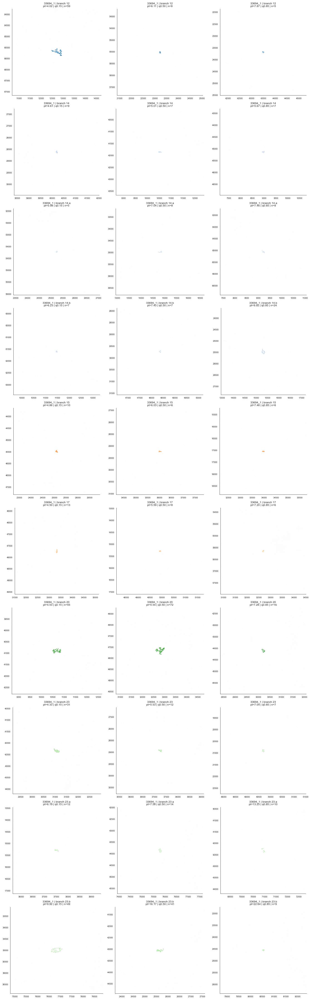

In [19]:

rep_sample_df = spatial_cell_tables.get(REPRESENTATIVE_SAMPLE_ID)
if rep_sample_df is None:
    rep_sample_df = build_sample_spatial_cell_df(
        get_sample_cfg(REPRESENTATIVE_SAMPLE_ID),
        pooled_result_df,
        force=False,
    )

plot_representative_niche_panels(
    rep_sample_df,
    representative_niches_df,
    background_max=100000,
    n_cols=3,
)



## Stage 7. Branch-specific microenvironment context

This stage asks whether different pooled branches carry different stromal and immune surroundings.

That is often where the pooled trajectory becomes most biologically persuasive:

- some branches may remain duct-rich and relatively organized
- others may become fibroblast-heavy or immune-enriched
- fibroblast activation markers may separate branch programs even when the epithelial continuum looks similar


In [20]:

branch_context_cols = [c for c in BRANCH_CONTEXT_FEATURES + BRANCH_FIBRO_MARKER_FEATURES if c in pooled_pathology_df.columns]

pooled_context_df = pooled_result_df.merge(
    pooled_pathology_df[[NICHE_KEY, "image_id"] + branch_context_cols].drop_duplicates(subset=[NICHE_KEY, "image_id"]),
    on=[NICHE_KEY, "image_id"],
    how="left",
)

top_branch_labels = [
    x
    for x in major_branch_order
    if x not in {"other", "unassigned"}
]
if TOP_BRANCHES_FOR_CONTEXT_TRENDS is not None:
    top_branch_labels = top_branch_labels[:TOP_BRANCHES_FOR_CONTEXT_TRENDS]

print("Branches for context trends:", top_branch_labels)
print("Context columns available:", branch_context_cols)
pooled_context_df.shape


Branches for context trends: ['trunk', 'branch 12', 'branch 14', 'branch 14.a', 'branch 14.b', 'branch 15', 'branch 17', 'branch 20', 'branch 23', 'branch 23.a', 'branch 23.b']
Context columns available: ['surround_prop__pancreatic_ductal_epithelium', 'surround_prop__Fibroblasts', 'surround_prop__T_cells', 'surround_prop__B_lineage', 'surround_prop__Endothelial_cells', 'surround_prop__Vimentin_only_mesenchyme', 'surround_prop__pancreatic_acinar_epithelium', 'surround__Fibroblasts__FAP_expr_z__mean', 'surround__Fibroblasts__aSMA_expr_z__mean', 'surround__Fibroblasts__PDPN_expr_z__mean', 'surround__Fibroblasts__Thy1_expr_z__mean']


(46574, 55)

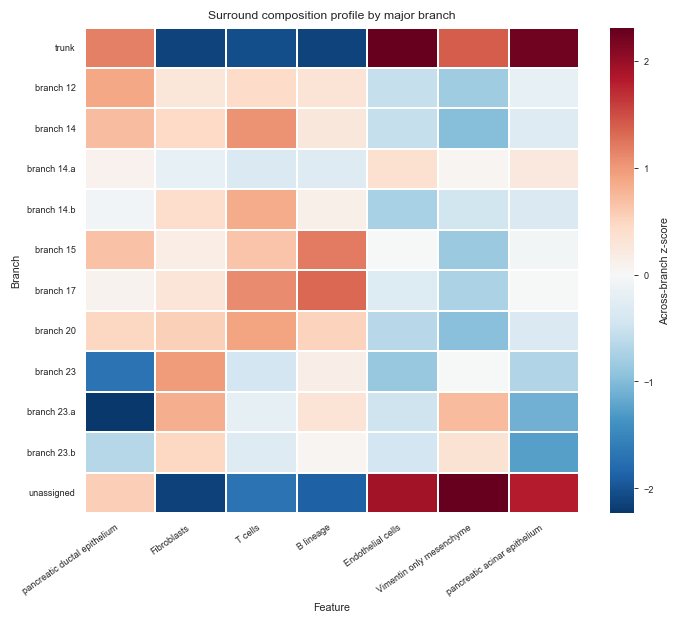

,surround_prop__pancreatic_ductal_epithelium,surround_prop__Fibroblasts,surround_prop__T_cells,surround_prop__B_lineage,surround_prop__Endothelial_cells,surround_prop__Vimentin_only_mesenchyme,surround_prop__pancreatic_acinar_epithelium
major_branch,,,,,,,
trunk,0.335976,0.089940,0.033195,0.009605,0.093873,0.154536,0.251586
branch 12,0.327993,0.348314,0.059509,0.026285,0.066062,0.032936,0.090588
branch 14,0.323117,0.367567,0.065861,0.025969,0.066015,0.023983,0.083184
branch 14.a,0.306107,0.298045,0.051346,0.022241,0.075031,0.080186,0.118446
branch 14.b,0.301184,0.363695,0.063896,0.025093,0.064175,0.052991,0.080424


In [21]:

branch_context_mean_df = plot_branch_feature_heatmap(
    pooled_context_df,
    feature_cols=BRANCH_CONTEXT_FEATURES,
    group_col="major_branch",
    group_order=major_branch_order,
    top_n=TOP_BRANCH_GROUPS_FOR_SUMMARY,
    figsize=(6.5, 3.8),
    title="Surround composition profile by major branch",
    cbar_label="Across-branch z-score",
)
branch_context_mean_df.head()


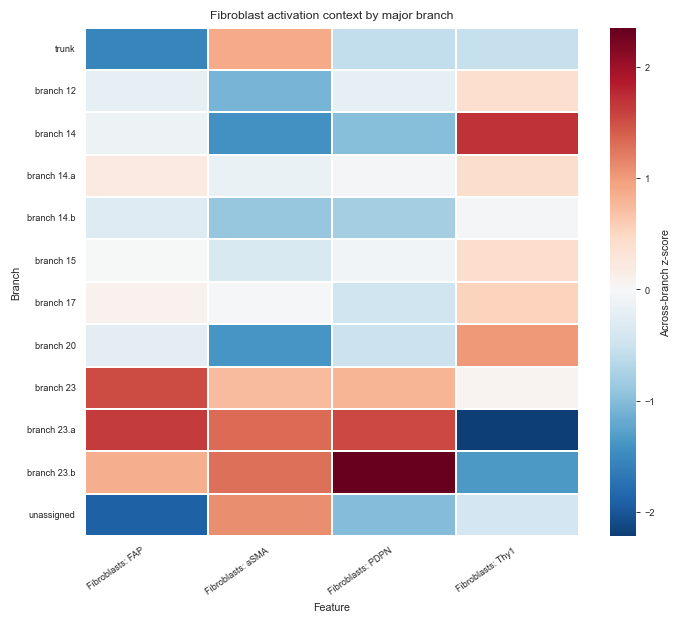

,surround__Fibroblasts__FAP_expr_z__mean,surround__Fibroblasts__aSMA_expr_z__mean,surround__Fibroblasts__PDPN_expr_z__mean,surround__Fibroblasts__Thy1_expr_z__mean
major_branch,,,,
trunk,0.146642,0.530040,-0.064776,0.364438
branch 12,0.330671,0.180887,-0.004362,0.429357
branch 14,0.342844,0.120948,-0.134030,0.518022
branch 14.a,0.387176,0.344444,0.024040,0.430663
branch 14.b,0.318658,0.212970,-0.099600,0.399112


In [22]:

branch_fibro_mean_df = plot_branch_feature_heatmap(
    pooled_context_df,
    feature_cols=BRANCH_FIBRO_MARKER_FEATURES,
    group_col="major_branch",
    group_order=major_branch_order,
    top_n=TOP_BRANCH_GROUPS_FOR_SUMMARY,
    figsize=(6.5, 3.6),
    title="Fibroblast activation context by major branch",
    cbar_label="Across-branch z-score",
)
branch_fibro_mean_df.head()


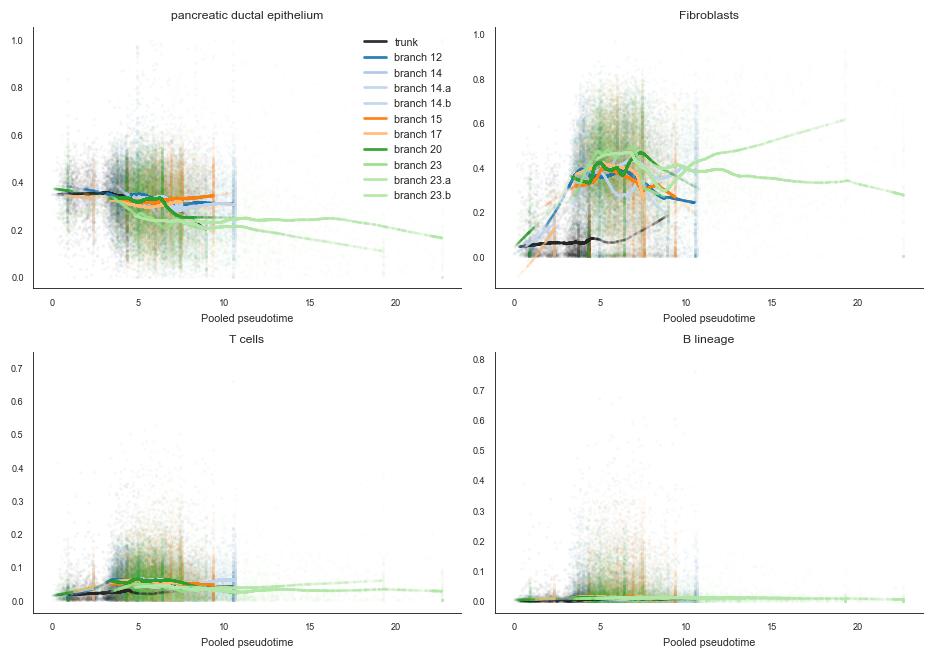

In [23]:

plot_branch_trend_panels(
    pooled_context_df,
    feature_cols=BRANCH_CONTEXT_TREND_FEATURES,
    branch_order=top_branch_labels,
    branch_palette=branch_palette,
    n_cols=2,
    figsize_scale=3.0,
    point_alpha=0.04,
    point_size=4,
    line_width=1.8,
    lowess_frac=0.28,
    min_points=60,
)


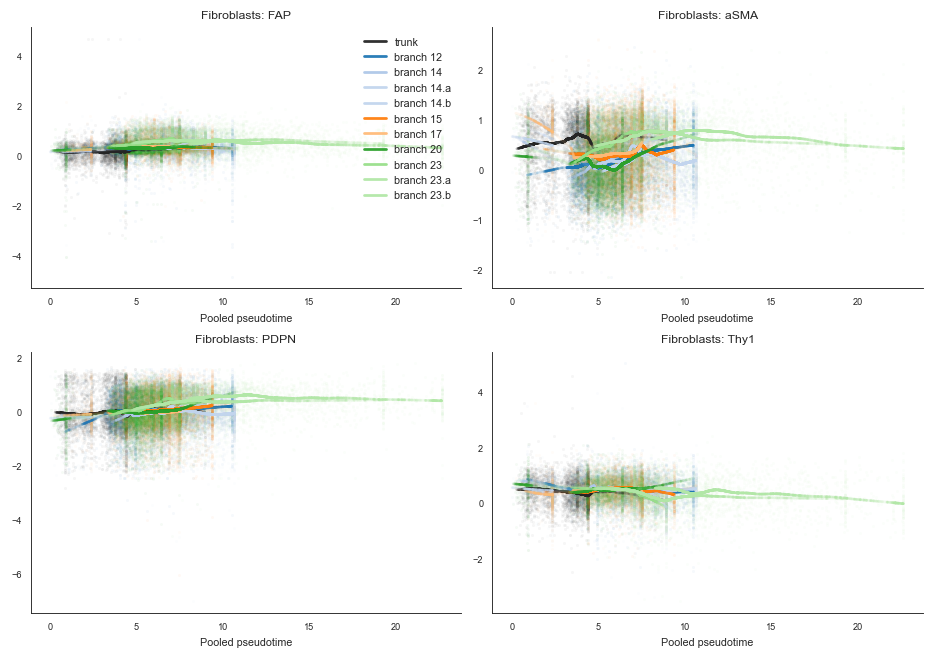

In [24]:

plot_branch_trend_panels(
    pooled_context_df,
    feature_cols=BRANCH_FIBRO_MARKER_FEATURES,
    branch_order=top_branch_labels,
    branch_palette=branch_palette,
    n_cols=2,
    figsize_scale=3.0,
    point_alpha=0.04,
    point_size=4,
    line_width=1.8,
    lowess_frac=0.28,
    min_points=60,
)



## Stage 8. Epithelial-intrinsic trajectory and PanIN-like validation

This is the clean biological sensitivity analysis.

The pooled tree above is a **contextual ductal niche trajectory** because stromal and surround features help define the feature space.

Here we rebuild a second tree from epithelial-intrinsic features only:

- duct/gland organization
- epithelial morphology and nuclear/cytoplasmic features
- CK19 / NaKATPase / Ki67 / Vimentin summaries
- texture and polarity features
- ductal graph geometry/topology

Surround proportions and fibroblast/immune marker summaries are excluded from this tree, then tested afterward.


In [25]:
# ── Score PanIN morphological validation axes ───────────────────────────────
# [reason] Independent morphological evidence (normal_duct_like,
# lg_panin_like, hg_panin_like, invasive_desmoplastic) validates that the
# epithelial trajectory recapitulates known PanIN progression histology.

panin_validation_score_df, panin_validation_feature_df = score_panin_morphology_validation(
    pooled_pathology_df,
    min_features=2,
)
pooled_pathology_panin_df = pd.concat(
    [
        pooled_pathology_df.reset_index(drop=True),
        panin_validation_score_df.reset_index(drop=True),
    ],
    axis=1,
)

save_df(pooled_pathology_panin_df, CACHE_DIR / "pooled_pathology_with_panin_validation_scores.pkl")
save_df(panin_validation_feature_df, CACHE_DIR / "panin_validation_resolved_features.pkl")

score_summary_df = (
    pooled_pathology_panin_df.groupby(["disease_group", "sample_id"], observed=True)[PANIN_VALIDATION_SCORE_COLS]
    .mean()
    .reset_index()
)

display(panin_validation_feature_df)
score_summary_df


,score,feature,sign
0,panin_validation__normal_duct_like_score,pdac_duct_organization_score,1.0
1,panin_validation__normal_duct_like_score,pdac_dysplasia_score,-1.0
2,panin_validation__normal_duct_like_score,pdac_architectural_complexity_score,-1.0
3,panin_validation__normal_duct_like_score,pdac_proliferation_score,-1.0
4,panin_validation__normal_duct_like_score,pdac_dedifferentiation_score,-1.0
5,panin_validation__normal_duct_like_score,state__CK19_expr__mean,1.0
6,panin_validation__normal_duct_like_score,state__NaKATPase_expr__mean,1.0
7,panin_validation__normal_duct_like_score,state__polarity_score__mean,1.0
8,panin_validation__normal_duct_like_score,state__solidity__mean,1.0
9,panin_validation__normal_duct_like_score,state__boundary_irregularity__mean,-1.0


,disease_group,sample_id,panin_validation__normal_duct_like_score,panin_validation__lg_panin_like_score,panin_validation__hg_panin_like_score,panin_validation__invasive_desmoplastic_context_score,panin_validation__panin_grade_like_axis
0,NormalPancreas,40331_1,0.230234,-0.091109,-0.297881,-0.013402,-0.341779
1,PDAC,33694_1,-0.020873,0.081294,0.161055,0.024614,0.163141
2,PDAC,34434_1,0.037437,0.137682,0.052568,-0.025697,0.084416
3,PDAC,35559_1,-0.047552,-0.118361,-0.081276,0.002060,-0.079731


In [26]:

epithelial_candidate_cols = list(
    dict.fromkeys(EPITHELIAL_INTRINSIC_MODULE_COLS + EPITHELIAL_INTRINSIC_FEATURE_CANDIDATES)
)
# ── Epithelial-intrinsic feature selection ────────────────────────────────────
# [reason] Higher NA tolerance (0.50) because epithelial markers are sparsely
# expressed in normal pancreas; same correlation pruning threshold as pooled.
_epi_fm_result = prepare_pseudotime_feature_matrix(
    data=pooled_pathology_panin_df,
    feature_cols=epithelial_candidate_cols,
    priority_features=EPITHELIAL_INTRINSIC_MODULE_COLS,
    max_na_fraction=0.50,
    correlation_threshold=0.75,
)
X_epi                            = _epi_fm_result.matrix
epithelial_selected_cols         = _epi_fm_result.selected_features
epithelial_feature_availability_df = _epi_fm_result.diagnostics
print(f"Epithelial feature selection: {len(epithelial_candidate_cols)} candidates → {len(epithelial_selected_cols)} selected")

if X_epi.shape[1] < 2:
    raise ValueError("Not enough epithelial-intrinsic features were available to build a trajectory.")

epi_scaler = StandardScaler()
X_epi_scaled = epi_scaler.fit_transform(X_epi)

epi_pca = PCA(n_components=min(10, X_epi.shape[1]), random_state=RANDOM_STATE)
X_epi_pca = epi_pca.fit_transform(X_epi_scaled)
n_epi_pcs_use = min(7, X_epi_pca.shape[1])
X_epi_pca_use = X_epi_pca[:, :n_epi_pcs_use]

epi_umap_model = UMAP(
    n_neighbors=12,
    min_dist=0.2,
    n_components=2,
    random_state=RANDOM_STATE,
)
X_epi_umap = epi_umap_model.fit_transform(X_epi_pca_use)

epithelial_embedding_df = pooled_pathology_panin_df[
    [
        NICHE_KEY,
        "image_id",
        "exp_id",
        "sample_id",
        "disease_group",
        "differentiation_label",
        "n_cells",
    ]
    + [c for c in MODULE_COLS if c in pooled_pathology_panin_df.columns]
    + [c for c in PANIN_VALIDATION_SCORE_COLS if c in pooled_pathology_panin_df.columns]
].copy()

for i in range(X_epi_pca_use.shape[1]):
    epithelial_embedding_df[f"epithelial_PC{i+1}"] = X_epi_pca_use[:, i]
epithelial_embedding_df["epithelial_UMAP1"] = X_epi_umap[:, 0]
epithelial_embedding_df["epithelial_UMAP2"] = X_epi_umap[:, 1]

save_df(epithelial_embedding_df, CACHE_DIR / "epithelial_intrinsic_embedding_df.pkl")

print("Selected epithelial-intrinsic trajectory features:")
print(epithelial_selected_cols)
print()
print("Epithelial-intrinsic explained variance ratio:")
print(np.round(epi_pca.explained_variance_ratio_[:5], 4))

epithelial_feature_availability_df.head(30)


Epithelial feature selection: 67 candidates → 44 selected


/Users/shihongwu/anaconda3/envs/spatioev_env/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Selected epithelial-intrinsic trajectory features:
['pdac_duct_organization_score', 'pdac_dysplasia_score', 'pdac_architectural_complexity_score', 'pdac_proliferation_score', 'pdac_dedifferentiation_score', 'geometry__hull_circularity', 'geometry__mean_nearest_neighbor_distance', 'geometry__nearest_neighbor_distance_cv', 'geometry__edge_length_cv', 'geometry__orientation_entropy', 'geometry__spatial_entropy', 'geometry__cell_density_hull', 'geometry__edge_density_hull', 'geometry__node_cloud_elongation', 'topology__largest_component_fraction', 'topology__density', 'topology__degree_var', 'topology__bridge_fraction', 'topology__skeleton_leaf_fraction', 'topology__skeleton_branchpoint_fraction', 'topology__skeleton_tortuosity', 'state__CK19_expr__mean', 'state__NaKATPase_expr__mean', 'state__Ki67_expr__mean', 'state__nc_ratio__mean', 'state__nc_ratio__iqr', 'state__major_minor_axis_ratio__mean', 'state__major_minor_axis_ratio__std', 'state__convex_hull_resid__mean', 'state__centroid_dif_

,feature,na_fraction,variance,selected,drop_reason
0,geometry__cell_density_hull,0.0,2.320211e-06,True,
1,geometry__edge_density_hull,0.0,1.761859e-05,True,
2,geometry__edge_length_cv,0.0,1.506987e-03,True,
3,geometry__hull_circularity,0.0,1.856554e-02,True,
4,geometry__mean_nearest_neighbor_distance,0.0,1.099641e+01,True,
5,geometry__nearest_neighbor_distance_cv,0.0,4.052600e-03,True,
6,geometry__node_cloud_elongation,0.0,1.510714e+02,True,
7,geometry__orientation_entropy,0.0,6.420106e-03,True,
8,geometry__spatial_entropy,0.0,5.242203e-03,True,
9,pdac_architectural_complexity_score,0.0,8.453035e-02,True,


In [27]:

reduced_data_epithelial = X_epi_pca_use
pg_tree_epithelial = elpigraph.computeElasticPrincipalTree(
    X=reduced_data_epithelial,
    NumNodes=SIMPLIFIED_NUM_NODES,
    Lambda=0.01,
    Mu=0.01,
)[0]

normal_duct_score = pd.to_numeric(
    epithelial_embedding_df["panin_validation__normal_duct_like_score"],
    errors="coerce",
)
normal_mask_epi = epithelial_embedding_df["disease_group"] == "NormalPancreas"
pdac_mask_epi = epithelial_embedding_df["disease_group"] == "PDAC"

if pdac_mask_epi.any() and normal_duct_score[pdac_mask_epi].notna().any():
    pdac_epi_quantile = normal_duct_score[pdac_mask_epi].quantile(0.9)
    pdac_epi_early_mask = pdac_mask_epi & (normal_duct_score >= pdac_epi_quantile)
else:
    pdac_epi_early_mask = normal_duct_score == normal_duct_score.max()

root_mask_epi = normal_mask_epi | pdac_epi_early_mask
if root_mask_epi.fillna(False).sum() == 0:
    root_mask_epi = normal_duct_score == normal_duct_score.max()

root_anchor_epi = reduced_data_epithelial[root_mask_epi.to_numpy()].mean(axis=0)
source_node_epithelial = int(
    np.argmin(np.sum((pg_tree_epithelial["NodePositions"] - root_anchor_epi) ** 2, axis=1))
)

elpigraph.utils.getPseudotime(
    X=reduced_data_epithelial,
    PG=pg_tree_epithelial,
    source=source_node_epithelial,
    target=None,
)

epithelial_result_df = epithelial_embedding_df.copy()
epithelial_result_df["epithelial_pseudotime"] = pg_tree_epithelial["pseudotime"]
epithelial_result_df["epithelial_node_id"] = pg_tree_epithelial["projection"]["node_id"]
epithelial_result_df["epithelial_edge_id"] = pg_tree_epithelial["projection"]["edge_id"]

(
    epi_auto_trunk_path,
    epi_auto_branch_paths,
    epi_auto_subbranch_paths,
    epi_auto_tree_inference_df,
    epi_auto_branch_inference_df,
    epi_auto_leaf_score_df,
) = infer_auto_simple_tree_branch_paths(
    epithelial_result_df,
    pg_tree_epithelial,
    node_col="epithelial_node_id",
    early_col="panin_validation__normal_duct_like_score",
)

epithelial_result_df, epithelial_branch_order, epithelial_branch_summary_df, epithelial_branch_definition_df = assign_simple_tree_branches_from_paths(
    epithelial_result_df,
    pg_tree=pg_tree_epithelial,
    trunk_path=epi_auto_trunk_path,
    branch_paths=epi_auto_branch_paths,
    subbranch_paths=epi_auto_subbranch_paths,
    node_col="epithelial_node_id",
    edge_col="epithelial_edge_id",
    out_col="epithelial_major_branch",
)
epithelial_result_df = epithelial_result_df.rename(
    columns={
        "hub_branch": "epithelial_hub_branch",
        "terminal_lineage": "epithelial_terminal_lineage",
    }
)

contextual_projection_cols = [
    c
    for c in [
        NICHE_KEY,
        "image_id",
        "pooled_pseudotime",
        "simple_pseudotime",
        "major_branch",
        "hub_branch",
        "terminal_lineage",
    ]
    if c in pooled_result_df.columns
]
contextual_projection_df = pooled_result_df[contextual_projection_cols].rename(
    columns={
        "pooled_pseudotime": "contextual_pseudotime",
        "simple_pseudotime": "contextual_simple_pseudotime",
        "major_branch": "contextual_major_branch",
        "hub_branch": "contextual_hub_branch",
        "terminal_lineage": "contextual_terminal_lineage",
    }
)
epithelial_result_df = epithelial_result_df.merge(
    contextual_projection_df,
    on=[NICHE_KEY, "image_id"],
    how="left",
)

save_df(epithelial_result_df, CACHE_DIR / "epithelial_intrinsic_pseudotime_result_df.pkl")
save_df(epithelial_branch_definition_df, CACHE_DIR / "epithelial_intrinsic_branch_definitions.pkl")

print("Epithelial-intrinsic root niches:", int(root_mask_epi.sum()))
print("Epithelial-intrinsic root node:", source_node_epithelial)
print("Epithelial-intrinsic branch order:", epithelial_branch_order)
display(epi_auto_tree_inference_df)
display(epi_auto_branch_inference_df)
display(epithelial_branch_summary_df)
epithelial_branch_definition_df


Epithelial-intrinsic root niches: 7270
Epithelial-intrinsic root node: 24
Epithelial-intrinsic branch order: ['trunk', 'branch 1', 'branch 1.a', 'branch 1.b', 'branch 1.c', 'branch 7', 'branch 13', 'branch 19', 'branch 27', 'branch 27.a', 'branch 27.b', 'branch 32', 'branch 32.a', 'branch 32.b', 'branch 35']


,hub_node,hub_degree,trunk_endpoint,trunk_path,n_branches
0,0,8,9,9-33-10-30-25-17-0,7


,label,entry_node,n_nodes,terminal_leaves,path,n_projected_niches
0,branch 1,1,5,"8,18,31",0-1,9786
1,branch 7,7,5,20,0-7-24-14-3-20,7868
2,branch 13,13,2,6,0-13-6,3441
3,branch 19,19,3,11,0-19-34-11,3131
4,branch 27,27,4,"22,28",0-27,4232
5,branch 32,32,6,"15,16",0-32,6054
6,branch 35,35,4,12,0-35-29-26-12,4464


,epithelial_major_branch,n_niches
13,branch 7,7959
14,trunk,7054
12,branch 35,4475
1,branch 1.a,4188
10,branch 32.a,3999
4,branch 13,3547
5,branch 19,3194
2,branch 1.b,2713
3,branch 1.c,2483
7,branch 27.a,2080


,label,level,path,nodes,first_branch_node,subbranches
0,trunk,trunk,9-33-10-30-25-17-0,"9,33,10,30,25,17,0",0,
1,branch 1,hub_branch,0-1,"1,8,18,23,31",0,branch 1.a: 1-23-8; branch 1.b: 1-18; branch 1...
2,branch 1.a,subbranch,1-23-8,"23,8",0,
3,branch 1.b,subbranch,1-18,18,0,
4,branch 1.c,subbranch,1-31,31,0,
5,branch 7,hub_branch,0-7-24-14-3-20,"3,7,14,20,24",0,
6,branch 13,hub_branch,0-13-6,"13,6",0,
7,branch 19,hub_branch,0-19-34-11,"11,34,19",0,
8,branch 27,hub_branch,0-27,"27,4,28,22",0,branch 27.a: 27-4-22; branch 27.b: 27-4-28
9,branch 27.a,subbranch,27-4-22,"4,22",0,


### Quantile-normalised epithelial pseudotime

Same rank rescaling applied to the epithelial-intrinsic and contextual pseudotime axes.

In [28]:
# ── Quantile-normalised epithelial pseudotime ────────────────────────────────
from scipy.stats import rankdata as _rankdata

for _raw_col, _q_col in [
    ("epithelial_pseudotime", "epithelial_pseudotime_q"),
    ("contextual_pseudotime", "contextual_pseudotime_q"),
]:
    if _raw_col not in epithelial_result_df.columns:
        continue
    _valid = epithelial_result_df[_raw_col].notna()
    _n = _valid.sum()
    _ranks = _rankdata(epithelial_result_df.loc[_valid, _raw_col], method="average")
    epithelial_result_df.loc[_valid, _q_col] = (_ranks - 1) / (_n - 1)

# Per-branch version for epithelial branches
epithelial_result_df["epithelial_pseudotime_qb"] = np.nan
for _branch, _grp in epithelial_result_df.groupby("epithelial_major_branch", dropna=True):
    _v = _grp["epithelial_pseudotime"].notna()
    if _v.sum() < 2:
        continue
    _r = _rankdata(_grp.loc[_v, "epithelial_pseudotime"], method="average")
    epithelial_result_df.loc[_grp.index[_v], "epithelial_pseudotime_qb"] = (_r - 1) / (_r.max() - 1)

save_df(epithelial_result_df, CACHE_DIR / "epithelial_intrinsic_pseudotime_result_df.pkl")

print("Epithelial pseudotime quantile distribution:")
print(epithelial_result_df["epithelial_pseudotime_q"].describe().round(3))


Epithelial pseudotime quantile distribution:
count    46574.000
mean         0.500
std          0.289
min          0.003
25%          0.250
50%          0.494
75%          0.750
max          0.990
Name: epithelial_pseudotime_q, dtype: float64


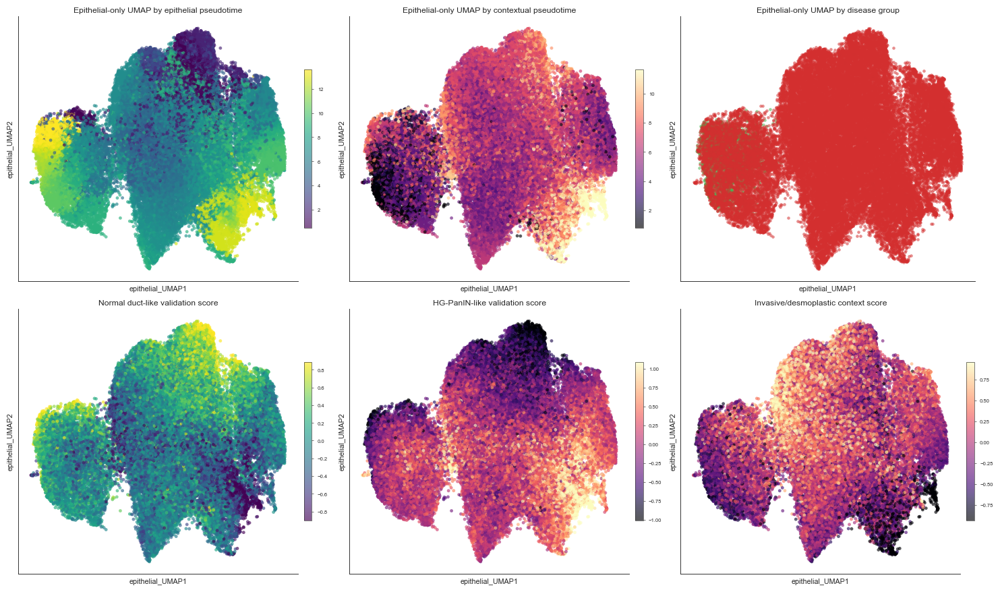

In [29]:

fig, axes = plt.subplots(2, 3, figsize=(13.5, 8.0))
axes = axes.ravel()
disease_palette = DISEASE_PALETTE
sample_palette  = SAMPLE_PALETTE

plot_continuous_embedding(
    axes[0],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="epithelial_pseudotime",
    title="Epithelial-only UMAP by epithelial pseudotime",
)
plot_continuous_embedding(
    axes[1],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="contextual_pseudotime",
    title="Epithelial-only UMAP by contextual pseudotime",
    cmap="magma",
)
plot_categorical_embedding(
    axes[2],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="disease_group",
    title="Epithelial-only UMAP by disease group",
    palette=disease_palette,
)
plot_continuous_embedding(
    axes[3],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="panin_validation__normal_duct_like_score",
    title="Normal duct-like validation score",
    cmap="viridis",
)
plot_continuous_embedding(
    axes[4],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="panin_validation__hg_panin_like_score",
    title="HG-PanIN-like validation score",
    cmap="magma",
)
plot_continuous_embedding(
    axes[5],
    epithelial_result_df,
    x="epithelial_UMAP1",
    y="epithelial_UMAP2",
    color="panin_validation__invasive_desmoplastic_context_score",
    title="Invasive/desmoplastic context score",
    cmap="magma",
)

plt.tight_layout()
plt.show()


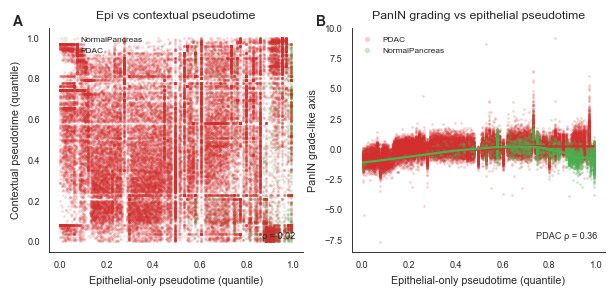

In [30]:
# ── Epithelial vs contextual pseudotime — quantile axes ─────────────────────
# [reason] Raw pseudotime has stripe artefact from high-traffic tree edges;
# quantile-normalised _q columns give a clean uniform scatter.
# PDAC-only correlation is shown for PanIN grade axis (NormalPancreas opposes).

from scipy.stats import spearmanr as _spearmanr

fig, axes = plt.subplots(1, 2, figsize=(5.5, 2.6))

# --- Panel A: epi_q vs contextual_q coloured by disease group ---
for disease, sub in epithelial_result_df.groupby("disease_group"):
    axes[0].scatter(sub["epithelial_pseudotime_q"], sub["contextual_pseudotime_q"],
                    s=3, alpha=0.18, c=DISEASE_PALETTE.get(disease,"#888"),
                    linewidths=0, rasterized=True, label=disease)
axes[0].set_xlabel("Epithelial-only pseudotime (quantile)", fontsize=7)
axes[0].set_ylabel("Contextual pseudotime (quantile)", fontsize=7)
axes[0].set_title("Epi vs contextual pseudotime", fontsize=8)
axes[0].legend(frameon=False, fontsize=5.5, markerscale=2, loc="upper left")
for sp in ["top","right"]: axes[0].spines[sp].set_visible(False)

_rho, _p = _spearmanr(
    epithelial_result_df["epithelial_pseudotime_q"].dropna(),
    epithelial_result_df["contextual_pseudotime_q"].loc[
        epithelial_result_df["epithelial_pseudotime_q"].notna()],
)
axes[0].text(0.97, 0.05, f"ρ = {_rho:.2f}", transform=axes[0].transAxes,
             fontsize=6, ha="right", va="bottom")

# --- Panel B: PDAC-only PanIN grade-like axis vs epi_q ---
_pdac_df    = epithelial_result_df[epithelial_result_df["disease_group"] == "PDAC"]
_normal_df  = epithelial_result_df[epithelial_result_df["disease_group"] == "NormalPancreas"]
_panin_col  = "panin_validation__panin_grade_like_axis"

for disease, sub, alpha in [("PDAC", _pdac_df, 0.22), ("NormalPancreas", _normal_df, 0.30)]:
    axes[1].scatter(sub["epithelial_pseudotime_q"], sub[_panin_col],
                    s=3, alpha=alpha, c=DISEASE_PALETTE.get(disease,"#888"),
                    linewidths=0, rasterized=True, label=disease)
    smooth = lowess_smooth(sub["epithelial_pseudotime_q"], sub[_panin_col], frac=0.3)
    if smooth is not None:
        axes[1].plot(smooth[:,0], smooth[:,1],
                     color=DISEASE_PALETTE.get(disease,"#888"), lw=1.5, zorder=3)

_rho_p, _ = _spearmanr(_pdac_df["epithelial_pseudotime_q"].dropna(),
                         _pdac_df[_panin_col].loc[_pdac_df["epithelial_pseudotime_q"].notna()])
axes[1].text(0.97, 0.05, f"PDAC ρ = {_rho_p:.2f}", transform=axes[1].transAxes,
             fontsize=6, ha="right", va="bottom")
axes[1].set_xlabel("Epithelial-only pseudotime (quantile)", fontsize=7)
axes[1].set_ylabel("PanIN grade-like axis", fontsize=7)
axes[1].set_title("PanIN grading vs epithelial pseudotime", fontsize=8)
axes[1].legend(frameon=False, fontsize=5.5, markerscale=2)
for sp in ["top","right"]: axes[1].spines[sp].set_visible(False)

for ax, lbl in zip(axes, "AB"):
    ax.text(-0.14, 1.06, lbl, transform=ax.transAxes,
            fontsize=9, fontweight="bold", va="top", ha="left")

plt.tight_layout(pad=0.5)
plt.savefig(CACHE_DIR / "fig_epi_vs_contextual_pseudotime.pdf")
plt.show()


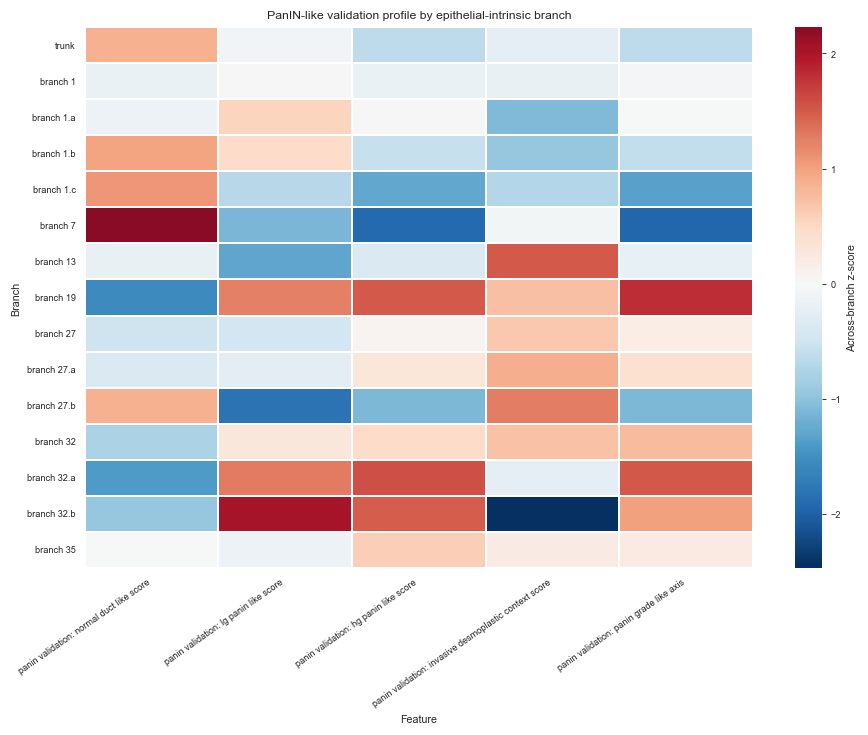

,panin_validation__normal_duct_like_score,panin_validation__lg_panin_like_score,panin_validation__hg_panin_like_score,panin_validation__invasive_desmoplastic_context_score,panin_validation__panin_grade_like_axis
epithelial_major_branch,,,,,
trunk,0.119807,-0.006282,-0.132453,-0.044895,-0.156922
branch 1,-0.111649,0.023261,0.010166,-0.033920,0.074369
branch 1.a,-0.109312,0.168825,0.063076,-0.239445,0.086080
branch 1.b,0.142566,0.149347,-0.108951,-0.212651,-0.146275
branch 1.c,0.163170,-0.165089,-0.321666,-0.156635,-0.434121


In [31]:

epithelial_panin_branch_mean_df = plot_branch_feature_heatmap(
    epithelial_result_df,
    feature_cols=PANIN_VALIDATION_SCORE_COLS,
    group_col="epithelial_major_branch",
    group_order=epithelial_branch_order,
    top_n=TOP_BRANCH_GROUPS_FOR_SUMMARY,
    figsize=(8.5, 4.2),
    title="PanIN-like validation profile by epithelial-intrinsic branch",
    cbar_label="Across-branch z-score",
)
epithelial_panin_branch_mean_df.head()


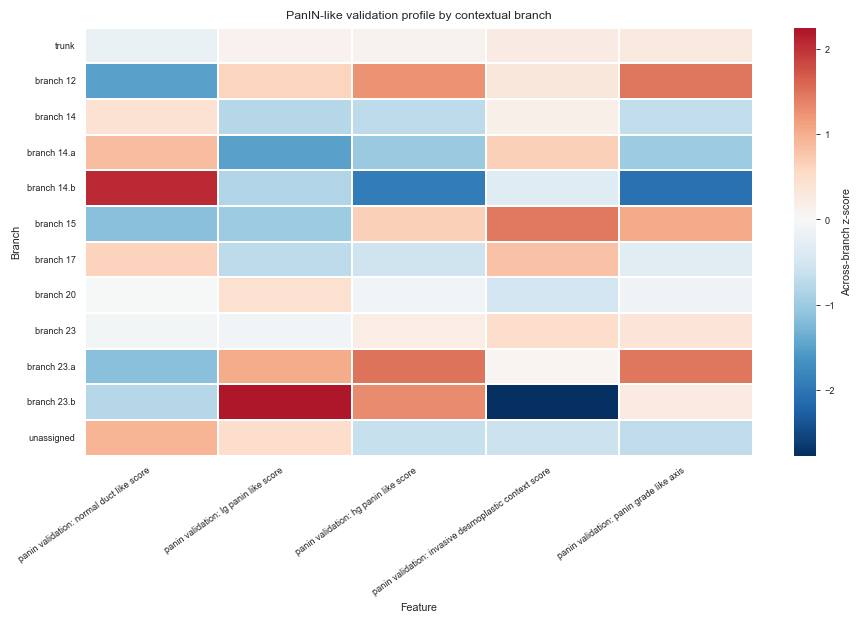

,panin_validation__normal_duct_like_score,panin_validation__lg_panin_like_score,panin_validation__hg_panin_like_score,panin_validation__invasive_desmoplastic_context_score,panin_validation__panin_grade_like_axis
contextual_major_branch,,,,,
trunk,-0.008151,0.043334,-0.001551,-0.002815,0.036358
branch 12,-0.352075,0.184850,0.361451,0.044323,0.532873
branch 14,0.152785,-0.207338,-0.266348,-0.023555,-0.358922
branch 14.a,0.266389,-0.414464,-0.363161,0.192908,-0.493732
branch 14.b,0.582997,-0.228651,-0.654582,-0.240702,-0.929878


In [32]:

contextual_panin_branch_mean_df = plot_branch_feature_heatmap(
    epithelial_result_df,
    feature_cols=PANIN_VALIDATION_SCORE_COLS,
    group_col="contextual_major_branch",
    group_order=major_branch_order,
    top_n=TOP_BRANCH_GROUPS_FOR_SUMMARY,
    figsize=(8.5, 4.2),
    title="PanIN-like validation profile by contextual branch",
    cbar_label="Across-branch z-score",
)
contextual_panin_branch_mean_df.head()


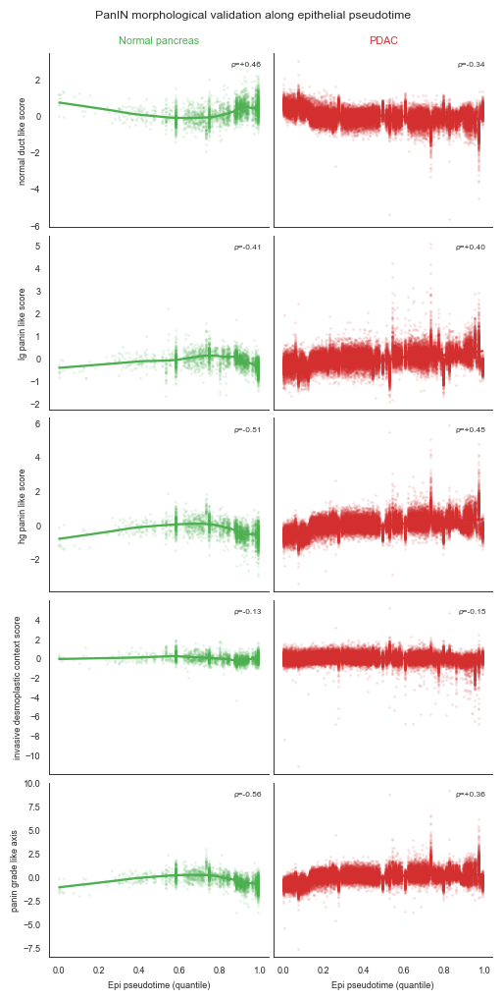

In [33]:
# ── PanIN validation score trends — PDAC-only (quantile pseudotime) ─────────
# [reason] Within PDAC the correlation is r=0.36–0.46; however, NormalPancreas
# shows the OPPOSITE trend (r_normal = -0.19 to -0.39) so the combined LOWESS
# appears flat. Here we show PDAC and Normal in separate columns so both are
# visible, and annotate Spearman ρ for each.

from scipy.stats import spearmanr as _spearmanr

_pt_col  = "epithelial_pseudotime_q"
use_cols = [c for c in PANIN_VALIDATION_SCORE_COLS if c in epithelial_result_df.columns]
n_cols   = 2   # PDAC | Normal
n_rows   = len(use_cols)

fig, axes = plt.subplots(n_rows, n_cols,
                          figsize=(4.5, 1.8 * n_rows),
                          sharex=True, sharey="row")

for row, col in enumerate(use_cols):
    for col_idx, (disease, c) in enumerate(DISEASE_PALETTE.items()):
        ax   = axes[row, col_idx]
        sub  = epithelial_result_df[epithelial_result_df["disease_group"] == disease]
        ax.scatter(sub[_pt_col], sub[col], s=3, alpha=0.15, c=c,
                   linewidths=0, rasterized=True)
        smooth = lowess_smooth(sub[_pt_col], sub[col], frac=0.3)
        if smooth is not None:
            ax.plot(smooth[:,0], smooth[:,1], color=c, lw=1.5, zorder=3)
        _valid = sub[[_pt_col, col]].dropna()
        if len(_valid) > 20:
            _rho, _p = _spearmanr(_valid[_pt_col], _valid[col])
            ax.text(0.97, 0.95, f"ρ={_rho:+.2f}", transform=ax.transAxes,
                    fontsize=5.5, ha="right", va="top", color="#333")
        for sp in ["top","right"]: ax.spines[sp].set_visible(False)
        if row == 0:
            ax.set_title(disease.replace("NormalPancreas","Normal pancreas"), fontsize=7, color=c)
        if col_idx == 0:
            ax.set_ylabel(col.replace("panin_validation__","").replace("_"," "), fontsize=6, labelpad=2)
        if row == n_rows - 1:
            ax.set_xlabel("Epi pseudotime (quantile)", fontsize=6)

fig.suptitle("PanIN morphological validation along epithelial pseudotime", fontsize=8, y=1.01)
plt.tight_layout(pad=0.3, h_pad=0.4, w_pad=0.5)
plt.savefig(CACHE_DIR / "fig_panin_validation_trends.pdf")
plt.show()



### Project epithelial-only pseudotime back into tissue space

These panels use the same ductal niche cells as the contextual spatial maps, but color them by the epithelial-intrinsic trajectory.


In [34]:

spatial_cell_tables_epithelial = {}
for sample_id in SPATIAL_VIS_SAMPLE_IDS:
    cfg = get_sample_cfg(sample_id)
    spatial_cell_tables_epithelial[sample_id] = build_sample_spatial_cell_df(
        cfg,
        pooled_result_df,
        epithelial_result_df=epithelial_result_df,
        force=False,
    )
    print(
        sample_id,
        spatial_cell_tables_epithelial[sample_id].shape,
        "n epithelial trajectory-assigned cells =",
        int(spatial_cell_tables_epithelial[sample_id]["has_epithelial_niche"].sum()),
    )


40331_1 (1443965, 33) n epithelial trajectory-assigned cells = 42212
34434_1 (1763634, 33) n epithelial trajectory-assigned cells = 385675
33694_1 (2919250, 33) n epithelial trajectory-assigned cells = 379314
35559_1 (1994937, 33) n epithelial trajectory-assigned cells = 430869


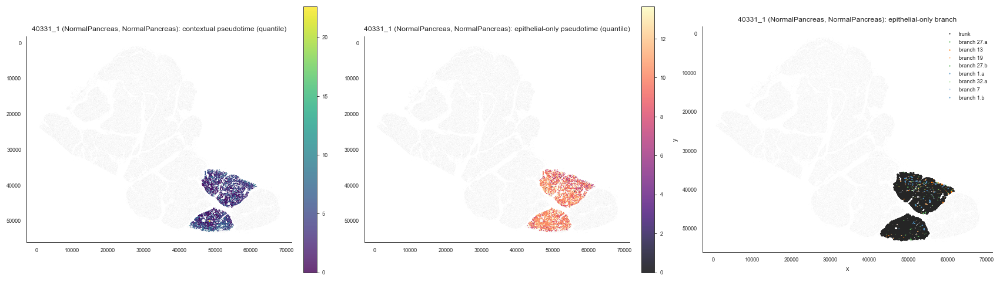

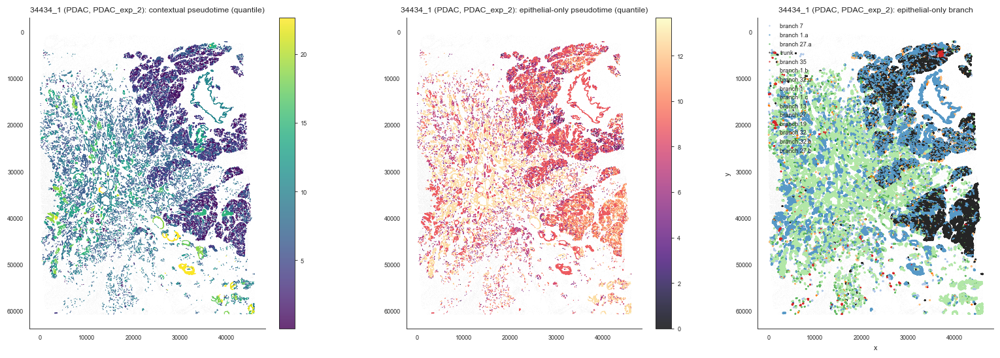

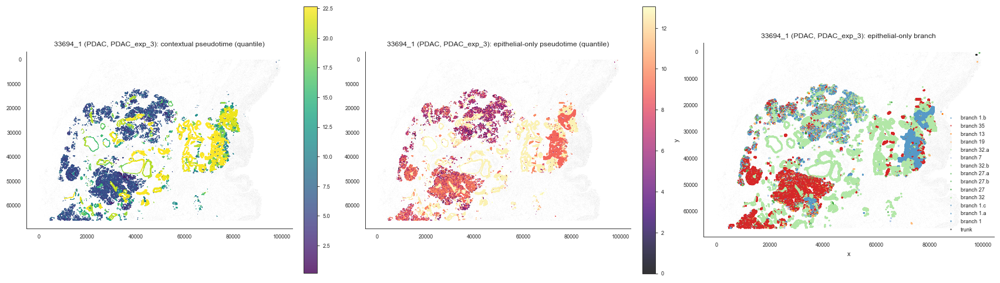

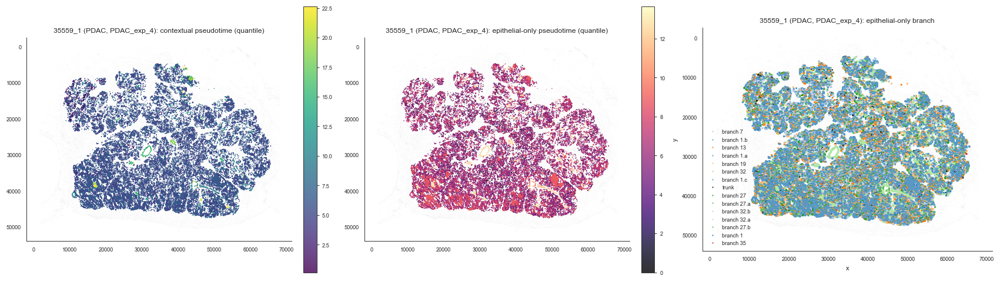

In [35]:

for sample_id in SPATIAL_VIS_SAMPLE_IDS:
    sample_df = spatial_cell_tables_epithelial[sample_id]
    title_prefix = (
        f"{sample_id} "
        f"({sample_df['disease_group'].iloc[0]}, {sample_df['differentiation_label'].iloc[0]})"
    )
    plot_spatial_epithelial_sample_views(
        sample_df,
        title_prefix=title_prefix,
        background_max=140000,
        point_size=0.08,
        niche_point_size=0.18,
    )


## Stage 9. Per-sample pseudotime concordance

Validates pooled trajectory by comparing pooled pseudotime to per-sample ElPiGraph pseudotime from each individual experiment notebook.

In [36]:
# ── Per-sample pseudotime concordance: pooled vs per-sample ──────────────────
# For each PDAC sample, load its per-sample pseudotime result (from exp_2/3/4)
# and compute Spearman correlation against the pooled pseudotime.
# High concordance validates that pooling doesn't distort individual trajectories.
from scipy.stats import spearmanr as _spearmanr

_per_sample_result_paths = {
    "34434_1": ROOT / "notebooks" / "results" / "pseudotime_exp2" / "niche_pseudotime_results.csv",
    "33694_1": ROOT / "notebooks" / "results" / "pseudotime_exp3" / "niche_pseudotime_results.csv",
    "35559_1": ROOT / "notebooks" / "results" / "pseudotime_exp4" / "niche_pseudotime_results.csv",
    "40331_1": ROOT / "notebooks" / "results" / "pseudotime_exp5" / "niche_pseudotime_results.csv",
}

_concordance_rows = []
for _sample_id, _path in _per_sample_result_paths.items():
    if not _path.exists():
        print(f"  {_sample_id}: per-sample result not found at {_path} — skip")
        continue
    _ps_df = pd.read_csv(_path)
    _merge_key = NICHE_KEY
    # Find image_id column
    _img_col = next((c for c in _ps_df.columns if "image" in c.lower()), None)
    if _img_col is None or _merge_key not in _ps_df.columns:
        print(f"  {_sample_id}: missing merge keys in per-sample result — skip")
        continue

    _pooled_sub = pooled_result_df[pooled_result_df["sample_id"] == _sample_id][
        [_merge_key, "image_id", "pooled_pseudotime", "pooled_pseudotime_q"]
    ].copy()
    _ps_df = _ps_df.rename(columns={_img_col: "image_id_ps"})
    _merged = _pooled_sub.merge(
        _ps_df[[_merge_key, "image_id_ps", "elpigraph_pseudotime"]].rename(
            columns={"image_id_ps": "image_id"}),
        on=[_merge_key, "image_id"],
        how="inner",
    )
    if len(_merged) < 20:
        print(f"  {_sample_id}: too few matched niches ({len(_merged)}) — skip")
        continue

    _rho_raw, _p_raw = _spearmanr(_merged["pooled_pseudotime"], _merged["elpigraph_pseudotime"])
    _rho_q,   _p_q   = _spearmanr(_merged["pooled_pseudotime_q"], _merged["elpigraph_pseudotime"])
    _concordance_rows.append({
        "sample_id": _sample_id,
        "n_matched_niches": len(_merged),
        "spearman_rho_raw":   round(float(_rho_raw), 3),
        "spearman_rho_q":     round(float(_rho_q),   3),
        "p_value":            float(_p_raw),
    })
    print(f"  {_sample_id}: n={len(_merged)}, rho_raw={_rho_raw:.3f}, rho_q={_rho_q:.3f}, p={_p_raw:.2e}")

if _concordance_rows:
    concordance_df = pd.DataFrame(_concordance_rows)
    concordance_df.to_csv(CACHE_DIR / "pooled_vs_persample_pseudotime_concordance.csv", index=False)
    display(concordance_df)
    print("\nHigh Spearman rho (>0.6) across samples validates the pooled trajectory.")
else:
    print("No per-sample results found. Run individual exp notebooks first to generate results.")
    concordance_df = pd.DataFrame()


  34434_1: n=12184, rho_raw=0.635, rho_q=0.635, p=0.00e+00
  33694_1: per-sample result not found at /Users/shihongwu/SpatioEv/notebooks/results/pseudotime_exp3/niche_pseudotime_results.csv — skip
  35559_1: per-sample result not found at /Users/shihongwu/SpatioEv/notebooks/results/pseudotime_exp4/niche_pseudotime_results.csv — skip
  40331_1: per-sample result not found at /Users/shihongwu/SpatioEv/notebooks/results/pseudotime_exp5/niche_pseudotime_results.csv — skip


,sample_id,n_matched_niches,spearman_rho_raw,spearman_rho_q,p_value
0,34434_1,12184,0.635,0.635,0.0



High Spearman rho (>0.6) across samples validates the pooled trajectory.



## Notes for interpretation

- If the pooled UMAP is dominated by `sample_id` rather than a continuous transition in the pathology axes, do **not** over-interpret the combined tree.
- If the normal pancreas niches sit near the high `pdac_early_duct_anchor_score` end and the PDAC samples bridge outward into more invasive / dedifferentiated states, the pooled tree is likely useful.
- The contextual tree is a ductal niche state trajectory. The epithelial-intrinsic tree is the cleaner sensitivity analysis for epithelial progression.
- PanIN-like validation scores are post hoc interpretability aids, not pathologist-confirmed PanIN grades.
- If needed, the next refinement would be a batch-aware pooled embedding or pathologist ROI validation.
